# Introduction


**File:** Notebook_BVP_k_M_structure.ipynb 
\
**Author:** Elizabeth Gould
\
**Date:** 15.03.2026
\
**Problem:** Find $k_{\mu}\left(B, R, dk, \mu\right)$ and $M_{\mu}\left(B, R, dk, \mu\right)$

This Jupyter notebook is used for modeling the changes in our wavenumbers $k_j$ and $M_j$ of the two oscillations of the solution of the nonlinear Schrödinger equation for persistant current in micrometer scale gold loops which solve the BVP requiring continuity of the wavefunction at the beginning and end of the loop. 

For our observed approximate solution to the nonlinear Schrödinger equation
\begin{equation}
\psi_j(x) = e^{i M_{j} x} \left( a_j e^{i k_{j} x} + b_j e^{- i k_{j} x} \right),
\end{equation}
we know that $\psi_j(0) = \psi_j(2\pi R_j)$ when 
\begin{equation}
\psi_j^\prime(0) = i M_{j} + k_j \left( \frac{e^{- 2 i M_{j}\pi R} - \cos\left( 2\pi k_{j} R_j \right)}{\sin\left(2\pi k_{j} R_j\right)}\right),
\end{equation}

where $k_{j}\left(\mu, R_j, B, k_0, \psi_j^\prime(0) \right)$ and $M_{j}\left(\mu, R_j, B, k_0, \psi_j^\prime(0) \right)$ are given by our previously solved model. Since the equations for $k_j$ and $M_j$ of our model are dependent on $\psi_j^\prime(0)$, we have obtained the values of $\psi_j^\prime(0)$ which solve this BVP equation with a numerical root finding algorithm. We now wish to reexamine our modeling for $k_j$ and $M_j$, and figure out the structure of the changes of $k_{j}\left(\mu, R_j, B, k_0 \right)$ and $M_{j}\left(\mu, R_j, B, k_0\right)$ from their linear solutions for the cases where $k_j$ and $M_j$ solve the BVP.

In our calculations, we vary $R_j$, $B$, $dk$, and $\mu$, with $k_0$ given by $k_0 = k_{Fermi, Au} + \frac{dk}{2 R_{max}}$.

# Loading Grid

To start with, we need to load our data into memory.

As typical, we start by loading our libraries.

In [1]:
#--LIBRARIES--------

import eelib
from eelib import pi, B_max, phi0inv, R_max
from eelib import find_ind_var, clean_table

import numpy as np
import pickle
import pandas as pd
from sklearn.linear_model import LinearRegression
import warnings

#plotting
import matplotlib.pyplot as plt
import seaborn as sns

For this notebook, we will make a list of our grid objects.

In [2]:
gridl=[]

And load each of our grids into the object, in order.

In [3]:
# loading script; be careful of python version
file = open('grid030', 'rb')    
gridl.append(pickle.load(file))
file.close()

# loading script; be careful of python version
file = open('grid033', 'rb')    
gridl.append(pickle.load(file))
file.close()

# loading script; be careful of python version
file = open('grid040', 'rb')    
gridl.append(pickle.load(file))
file.close()

# loading script; be careful of python version
file = open('grid041', 'rb')    
gridl.append(pickle.load(file))
file.close()

# loading script; be careful of python version
file = open('grid026', 'rb')    
gridl.append(pickle.load(file))
file.close()

In [4]:
for ob in gridl: print(ob)

Grid object to measure current:
mu is: 1.5e-08
dk is: 0.45
B has 100 points from 0.5 to 0.6.
R has 100 points from 0.9 to 0.9002.
A is: [1.]
k0 is: 12000000000.0
Total number of parameters: 10000
Grid object to measure current:
mu has 100 points from 3.1622776601683795e-09 to 3.162277660168379e-08.
dk has 100 points from 0.0 to 3.0.
B is: 0.5
R is: 0.9
A is: [1.]
k0 is: 12000000000.0
Total number of parameters: 10000
Grid object to measure current:
mu is: 1.5e-08
dk is: 0.45
B has 20 points from 0.5 to 0.6.
R has 511 points from 0.5709233333333332 to 0.9959233333333333.
A is: [1.]
k0 is: 12000000000.0
Total number of parameters: 10220
Grid object to measure current:
mu is: 1.5e-08
dk is: 0.45
B has 300 points from 0.11 to 1.0.
R has 30 points from 0.9 to 0.9002.
A is: [1.]
k0 is: 12000000000.0
Total number of parameters: 9000
Grid object to measure current:
mu has 11 points from 3.1622776601683795e-10 to 3.162277660168379e-08.
dk has 11 points from 0.1 to 0.9.
B has 11 points from 0.5 

Here we are working with the following 5 objects:

0) grid 30 - $B$ and small $R$ variations to find oscillation structure
   - mu is: 1.5e-08
   - dk is: 0.45
   - B has 100 points from 0.5 to 0.6.
   - R has 100 points from 0.9 to 0.9002.
1) grid 33 - $dk$ and $\mu$ variations, to examine effect of $\mu$ and $dk$
   - mu has 100 points from 3.1622776601683795e-09 to 3.162277660168379e-08.
   - dk has 100 points from 0.0 to 3.0.
   - B is: 0.5
   - R is: 0.9
2) grid 40 - full range of $R$
   - mu is: 1.5e-08
   - dk is: 0.45
   - B has 20 points from 0.5 to 0.6.
   - R has 511 points from 0.5709233333333332 to 0.9959233333333333.
3) grid 41 - full range of $B$
   - mu is: 1.5e-08
   - dk is: 0.45
   - B has 300 points from 0.11 to 1.0.
   - R has 30 points from 0.9 to 0.9002.
4) grid 26 - small grid varied over all 4 parameters
   - mu has 11 points from 3.1622776601683795e-10 to 3.162277660168379e-08.
   - dk has 11 points from 0.1 to 0.9.
   - B has 11 points from 0.5 to 0.506.
   - R has 11 points from 0.9 to 0.9002.

I want to transfer all of my data to pandas dataframes for analysis.

In [5]:
tbl = []

In [6]:
for grid in gridl:
    tbl.append(pd.DataFrame(grid.derivs))

In [7]:
del gridl # To clear up some memory. We have all the data already stored in the tables.

In [8]:
tbl[1].head() # And check a grid.

,R,B,dk,mu,k,A,dpsi0,Exact End,a0,b0,...,I0,dpsi,New End,a,b,A max new,I v1,I v2,I v3,effective mu
0,0.9,0.5,0.000000,3.162278e-09,1.200000e+10,1.0,8.863435e+09+4.613110e+ 07j,1.0+0.0j,0.501737-0.369303j,0.498263+0.369303j,...,0.003474,8.452251e+09+4.579073e+ 07j,1.0+0.0j,0.501723-0.352171j,0.498277+0.352171j,1.223152,0.003446,0.003446,0.003446+0.000000j,4.731084e-09
1,0.9,0.5,0.030303,3.162278e-09,1.200000e+10,1.0,5.136212e+08+4.700433e+ 08j,1.0-0.0j,0.519400-0.021401j,0.480600+0.021401j,...,0.038800,3.322678e+08+5.318948e+ 08j,1.0-0.0j,0.521977-0.013844j,0.478023+0.013844j,1.000384,0.043954,0.043954,0.043954+0.000000j,3.164707e-09
2,0.9,0.5,0.060606,3.162278e-09,1.200000e+10,1.0,1.030296e+09+2.381010e+ 08j,1.0+0.0j,0.509736-0.042929j,0.490264+0.042929j,...,0.019471,8.474647e+08+2.520906e+ 08j,1.0-0.0j,0.510319-0.035311j,0.489681+0.035311j,1.002492,0.020637,0.020637,0.020637+0.000000j,3.178056e-09
3,0.9,0.5,0.090909,3.162278e-09,1.200000e+10,1.0,1.550530e+09+1.611744e+ 08j,1.0+0.0j,0.506530-0.064605j,0.493470+0.064605j,...,0.013061,1.364701e+09+1.670318e+ 08j,1.0-0.0j,0.506774-0.056862j,0.493226+0.056862j,1.006447,0.013549,0.013549,0.013549+0.000000j,3.203184e-09
4,0.9,0.5,0.121212,3.162278e-09,1.200000e+10,1.0,2.076495e+09+1.230092e+ 08j,1.0+0.0j,0.504940-0.086520j,0.495060+0.086520j,...,0.009880,1.886200e+09+1.261143e+ 08j,1.0-0.0j,0.505070-0.078591j,0.494930+0.078591j,1.012279,0.010139,0.010139,0.010139+0.000000j,3.240414e-09


# Defining variables for analysis

I have all my data in table form, but I know that it was all produced from grids of values. I therefore want to load my potential parameter values into arrays, so that I can more easily select all data of a given value of a given parameter.

In [9]:
R_g = []
B_g = []
dk_g = []
mu_g = []

In [10]:
for df in tbl:
    R_g.append(df["R"].unique())
    B_g.append(df["B"].unique())
    dk_g.append(df["dk"].unique())
    mu_g.append(df["mu"].unique())

In [11]:
k0   = tbl[0]["k"].unique()[0]
A    = tbl[0]["A"].unique()[0]

In [12]:
# The first 2 grids have two varied parameters of length 100.
grid_size = R_g[0].shape[0]
# For the 3rd grid, my grid sizes are 20 for B and 511 for R.
# My fourth grid has 300 points for B and 30 for R. 
# I need to save these lengths separately.
gs_r1 = R_g[2].shape[0]
gs_r2 = R_g[3].shape[0]
gs_b1 = B_g[2].shape[0]
gs_b2 = B_g[3].shape[0]
# The last grid has a grid size of 11 for all 4 parameters.
gs2 = R_g[4].shape[0]

In [13]:
# display grid sizes, to check that they are correct
grid_size, gs_r1, gs_r2, gs_b1, gs_b2, gs2

(100, 511, 30, 20, 300, 11)

Ok, I saved my array sizes. Now I want to check how well I have found a solution to the BVP. My tolerance here is 1 %, so all of the nonlinear solutions should give an error of around 1 %.

In [14]:
for df in tbl:
    print("Max error in new endpoint:", np.max(np.abs(df["New End"].to_numpy()-(1.0+0.0j))))
    print("Max error in old endpoint:", np.max(np.abs(df["Exact End"].to_numpy()-(1.0+0.0j))))

Max error in new endpoint: 0.009995294828413707
Max error in old endpoint: 9.668703732403756e-10
Max error in new endpoint: 0.00999759070608627
Max error in old endpoint: 1.1897410141962145e-10
Max error in new endpoint: 0.009998719201844994
Max error in old endpoint: 2.6063175770843754e-11
Max error in new endpoint: 0.009998713933494732
Max error in old endpoint: 2.27591748523702e-10
Max error in new endpoint: 0.009999028548925254
Max error in old endpoint: 2.1603538026081975e-09


Now lets clean the tables of excess data.

In [ ]:
tbl_red = []
for df in tbl:
    tbl_red.append(df[["R", "B", "dk", "mu", 'dpsi0', 'a0', 'b0', 'A max 0', 'I0', 'dpsi', 'a', 'b', 'A max new', 'I v3', 'effective mu']])

In [16]:
tbl_cl = []

for df in tbl_red:
    tbl_cl.append(clean_table(df))

I need to check the length of my tables, as I have probably lost some solutions, and this could cause problems with the rest of my code, which may not know how to handle this.

In [17]:
for df in tbl_cl:
    print(df.shape)

(10000, 15)
(10000, 15)
(10220, 15)
(9000, 15)
(14641, 15)


Nope. All good. Fitting with multiple algorithms and starting points works well. Lets check for erroneous points on the graphs however.

Now I want to calculate my $k_j$ and $M_j$ values, using my model and my known initial derivatives of $\psi$. The difference between the linear and nonlinear solutions will be added to all of the tables.

In [18]:
del tbl_red # Clear old data.
tbl_red = [] # Reset our variable to an empty list.

In [ ]:
# We are creating arrays in which to store our predicted nonlinear wave numbers.
kn = []
Mn = []
for i, df in enumerate(tbl_cl):
    kn.append(np.zeros(df.shape[0]))
    Mn.append(np.zeros(df.shape[0]))

In [ ]:
# For each row in each of our tables, I am adding a model prediction for 
# both of our wave numbers. I then want to subtract the linear 
# expectation for that wave number, and add a column to our table with the 
# difference between linear and nonlinear wave number.
for i, df in enumerate(tbl_cl):
    for iel in range(df.shape[0]):
        rr = df["R"].iloc[iel]
        bb = df["B"].iloc[iel]
        kk = df["dk"].iloc[iel]
        mm = df["mu"].iloc[iel]
        
        RR = rr * R_max
        BB = bb * B_max
        
        dpsi = df['dpsi'].iloc[iel]

        k_new = eelib.pred_fast_k_true(dpsi, mm, kk, BB, RR, A=A, k0=k0)        
        M_new = eelib.pred_slow_k_v3(dpsi, mm, kk, BB, RR, A=A, k0=k0)

        dk_new = k_new - (k0+kk/1e-6/2.0)
        dM_new = M_new - rr*R_max*bb*B_max*phi0inv

        kn[i][iel] = dk_new
        Mn[i][iel] = dM_new

    tbl_cl[i]["dkn"] = kn[i]
    tbl_cl[i]["dMn"] = Mn[i]

In [ ]:
# This determines which of our table columns we wish to save.
cols = []
for i, df in enumerate(tbl_cl):
    col_names = find_ind_var(i, R_g, B_g, dk_g, mu_g) # To determine which parameters to plot.
    col_names.append("dkn") # Also plot the change in fast oscillation wave number.
    col_names.append("dMn") # Also plot the change in slow oscillation wave number.
    cols.append(col_names)

In [22]:
# Our reduced tables will have only the columns which are useful for our analysis.
for i,df in enumerate(tbl_cl):
    tbl_red.append(df[cols[i]])

Ok, now that we have cleaned up datasets, lets move on to visualization, and try to figure out with what we are dealing.

# Visualization

Now lets look at the triangle plots for all of our datasets. 

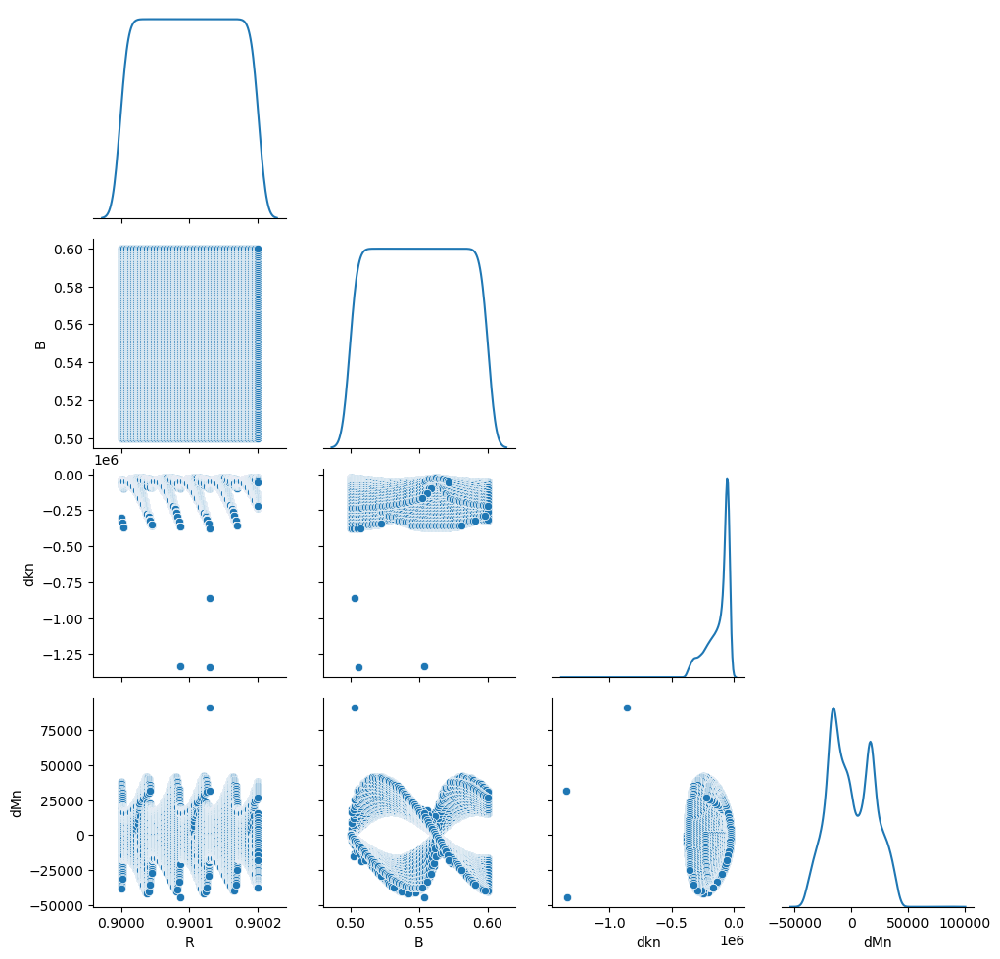

In [23]:
g = sns.PairGrid(tbl_red[0], diag_sharey=False, corner=True)

g.map_diag(sns.kdeplot)
g.map_lower(sns.scatterplot)

In [24]:
# I want to delete the outliers from my dataset to make the pattern more visible.
tbl_red[0].loc[tbl_red[0]["dkn"]< -0.75e6,"dkn"]= np.nan
tbl_red[0].loc[tbl_red[0]["dMn"]> 50000,"dMn"]= np.nan

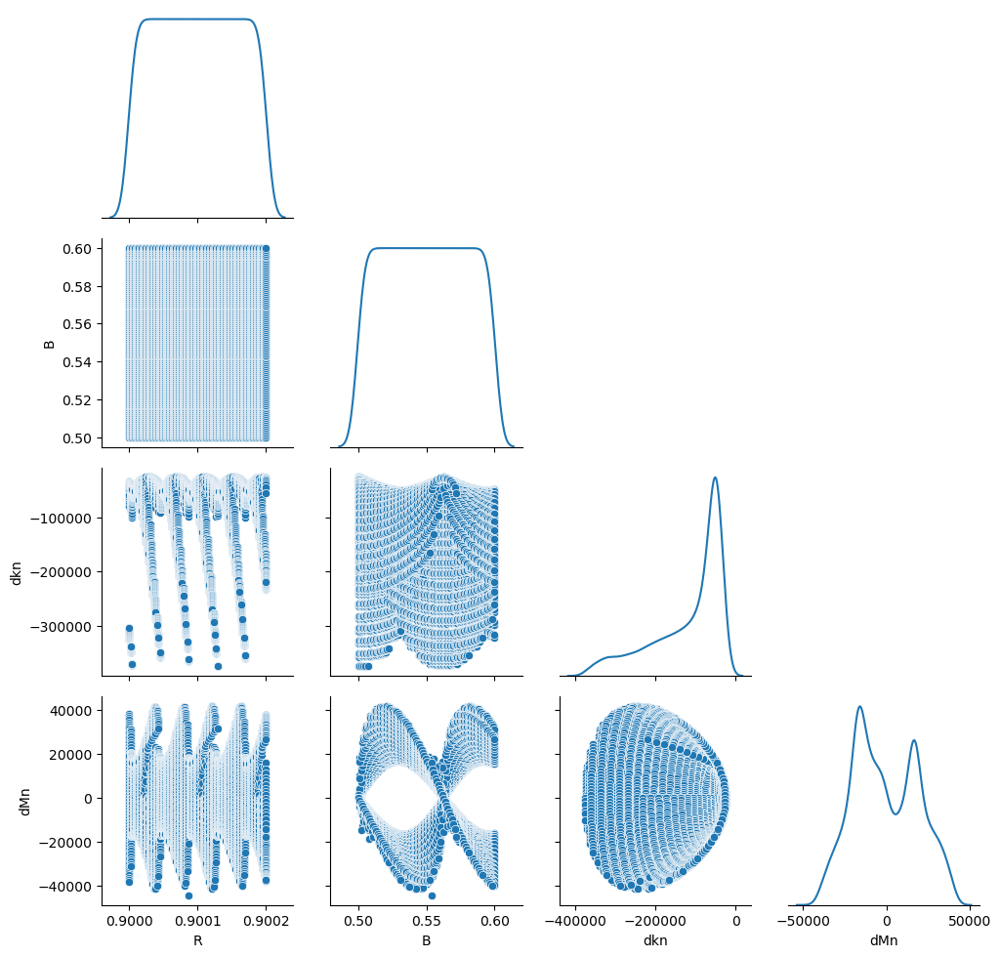

In [25]:
g = sns.PairGrid(tbl_red[0], diag_sharey=False, corner=True)

g.map_diag(sns.kdeplot)
g.map_lower(sns.scatterplot)

Oscillatory behavior clearly visible. It looks like our $B$ range has not completed an oscillation. I see for $R$ vs $dkn$ some sort of tilted secant squared pattern, while for $B$ vs dMn, I see a tilted sine wave.

These are the equations I found for the skewed sine wave, which has the sawtooth pattern as its limit. They may be useful later on for fitting the data to a functional form.

\begin{equation}
\frac{2^{2n-1}}{\binom{2n}{n}}\cos^{2n}\left(\frac{x}2\right)-\frac12
\end{equation}

\begin{equation}
\sum_{k=1}^n\frac{\binom{2n}{n-k}}{\binom{2n}{n}}\frac{\sin(kx)}k
\end{equation}

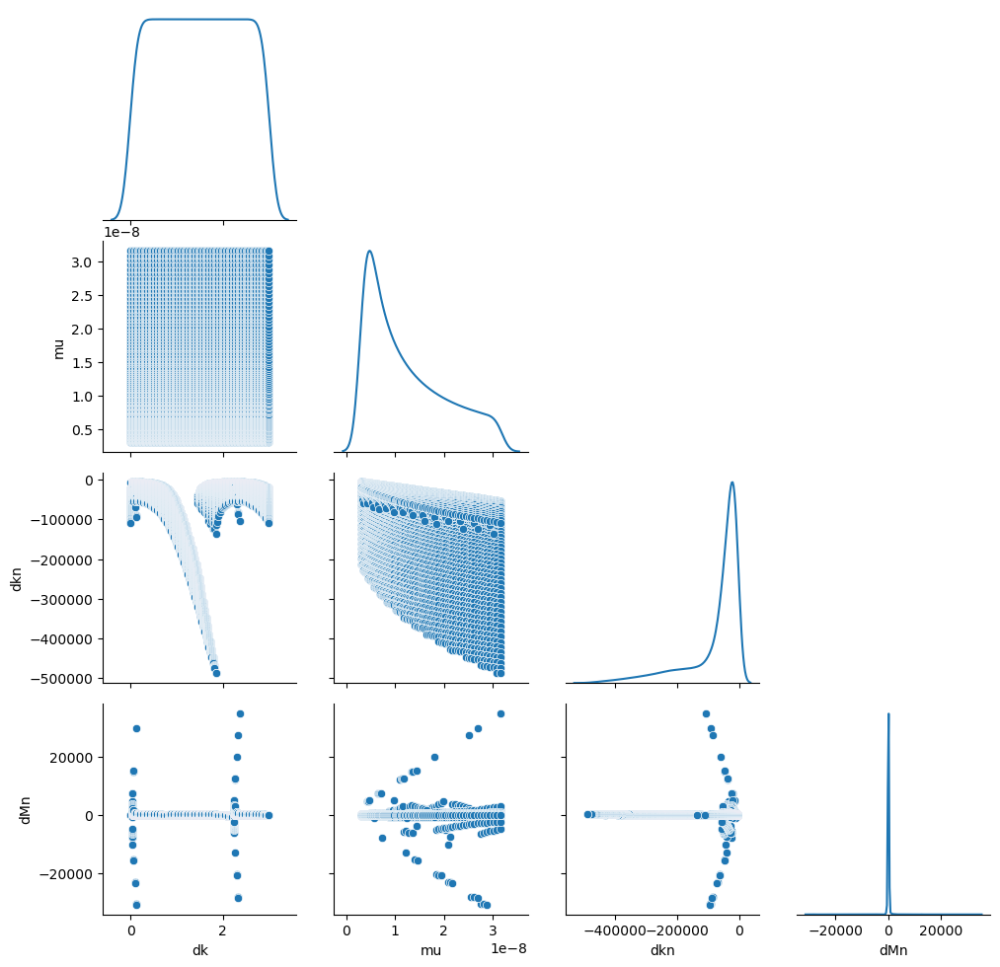

In [26]:
g = sns.PairGrid(tbl_red[1], diag_sharey=False, corner=True)

g.map_diag(sns.kdeplot)
g.map_lower(sns.scatterplot)

dk variations cause the same sort of pattern in the data as my small scale $R$ variations of the previous dataset. This is expected on our scale as they are equivalent. I want to extract the period and sample on their minima to calculate the other oscillation. 

The dMn behavior here looks like a flat curve, with spikes on the period boundaries, as if it were the limit to some sort of function.

$\mu$ causes linear growth of the minima, but slower than linear for the maxima. Most of my analyses have shown a linear dependence on $\mu$ for the amplitude of my oscillations, but I know $\mu$ also changes my parameters, which appears to shorten the spikes for my tilted secant squared functions. From this graph, this effect is not so visible, but I will come back to $\mu$ analysis later.

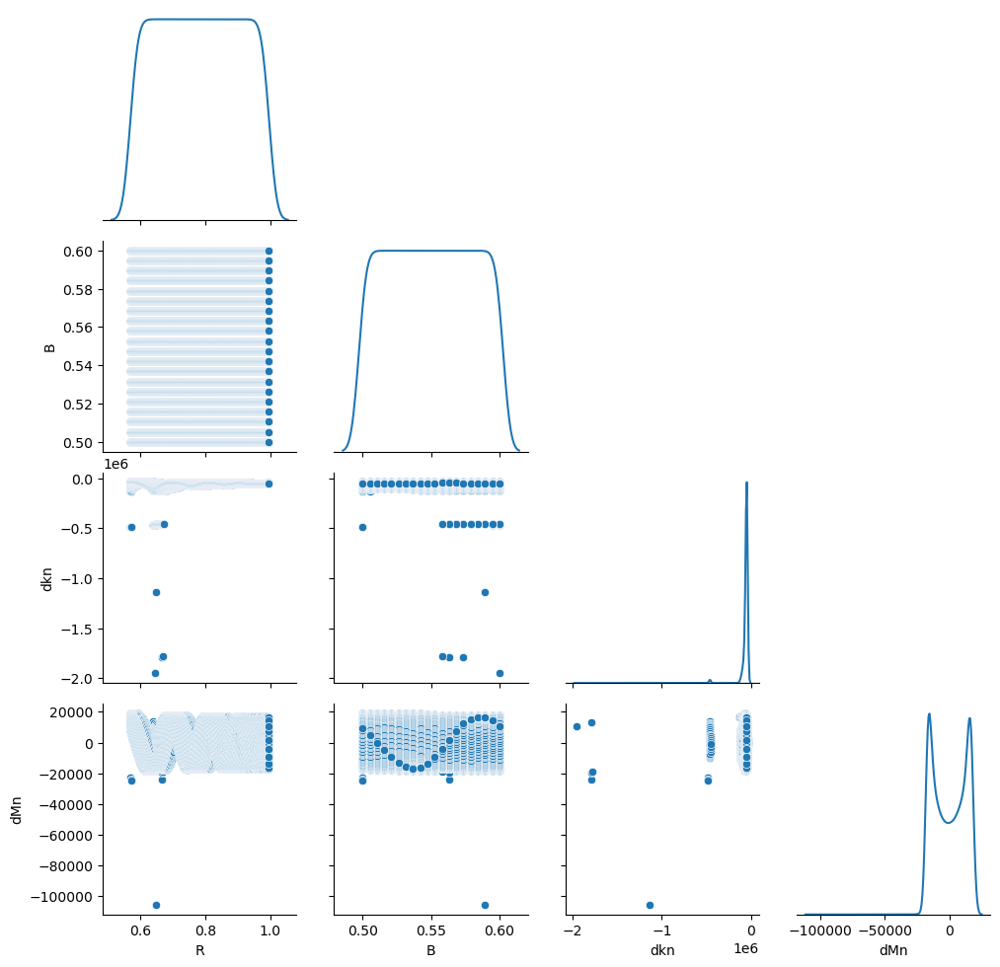

In [27]:
g = sns.PairGrid(tbl_red[2], diag_sharey=False, corner=True)

g.map_diag(sns.kdeplot)
g.map_lower(sns.scatterplot)

In [28]:
# I need to delete outliers again. I was hoping mu was small enough to avoid this.
tbl_red[2].loc[tbl_red[2]["dMn"] < -20000,"dMn"] = None
tbl_red[2].loc[tbl_red[2]["dkn"] < -4.0e5,"dkn"] = None

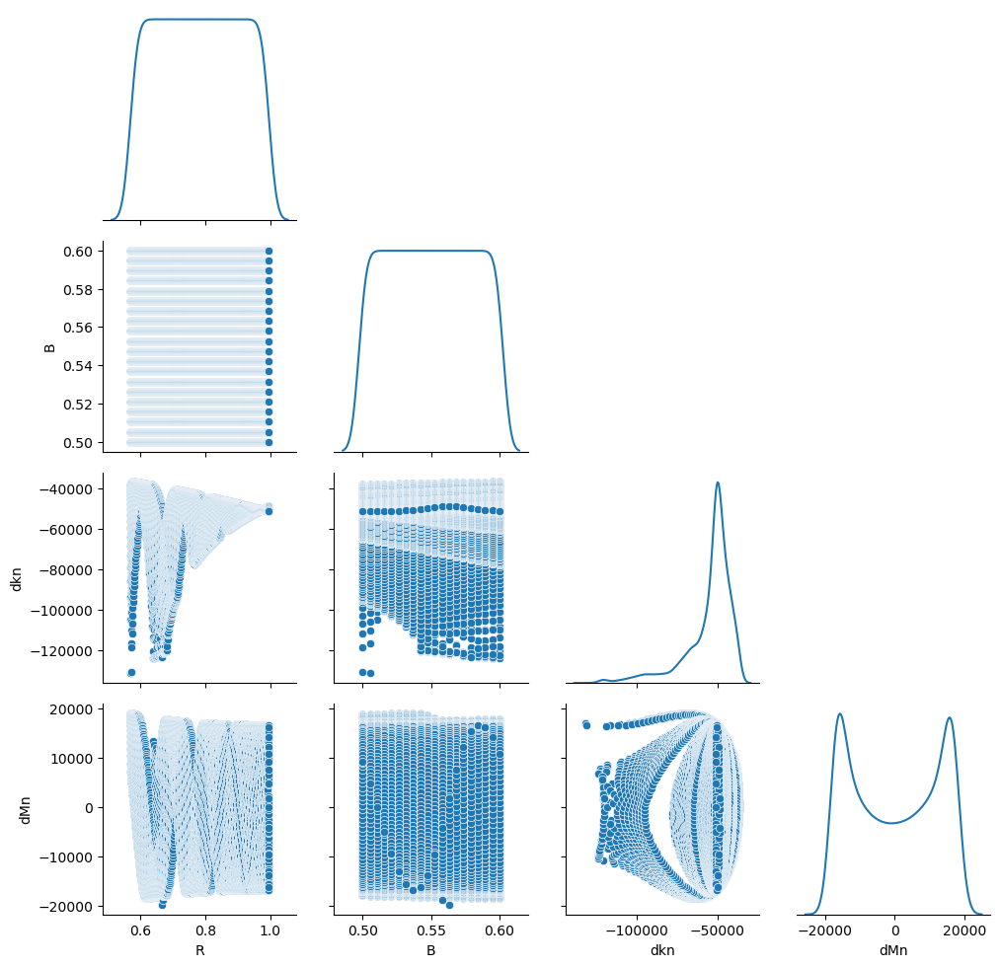

In [29]:
g = sns.PairGrid(tbl_red[2], diag_sharey=False, corner=True)

g.map_diag(sns.kdeplot)
g.map_lower(sns.scatterplot)

The patterns are not quite obvious here. I know that I have my small-scale (fast) oscillations fixed for this dataset, while the slow $B$ dependent oscillations should be visible. By the time I had chosen this dataset, I already know that I have one pattern based on the decimal part of $kR$ where $k$ and $R$ are in natural units, and a second pattern based on the decimal part of $\pi^2BR^2$ where $B$ and $R$ are a percent of their maximum value. The second pattern should be responsible for the oscillatory behavior visible here, while the remaining behavior is what I wish to extract from this dataset. This pattern should be found by following the envelope of these curves. There appears to be amplitude dependence on $R$. 

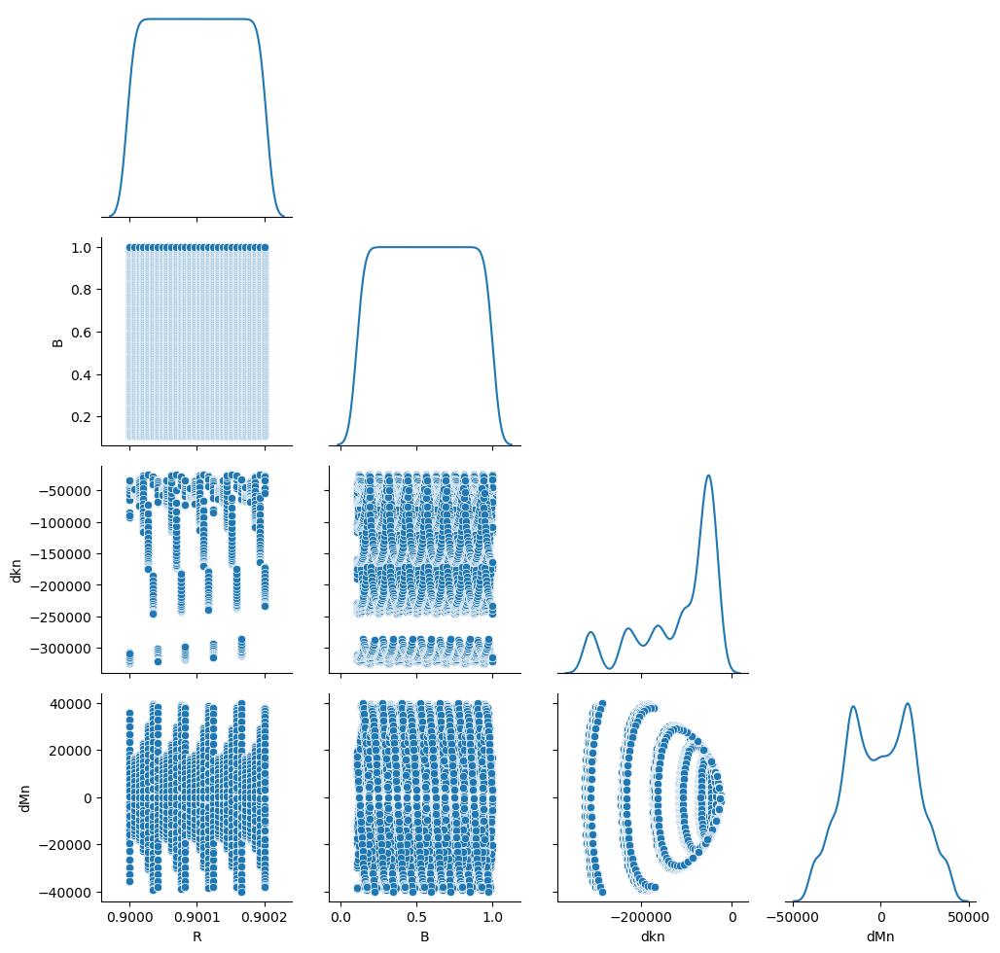

In [30]:
g = sns.PairGrid(tbl_red[3], diag_sharey=False, corner=True)

g.map_diag(sns.kdeplot)
g.map_lower(sns.scatterplot)

Full $B$ range for the small $R$ range. Periodic behavior is clearly visible in this image. Unlike the full $R$ range graph, there appears to be no $B$ dependence on the parameters which give the shape of the oscillations. $\mu$ and $R$ determine the shape and amplitude of oscillations. $B$ and $dk$ only determine where in the period this point is. 

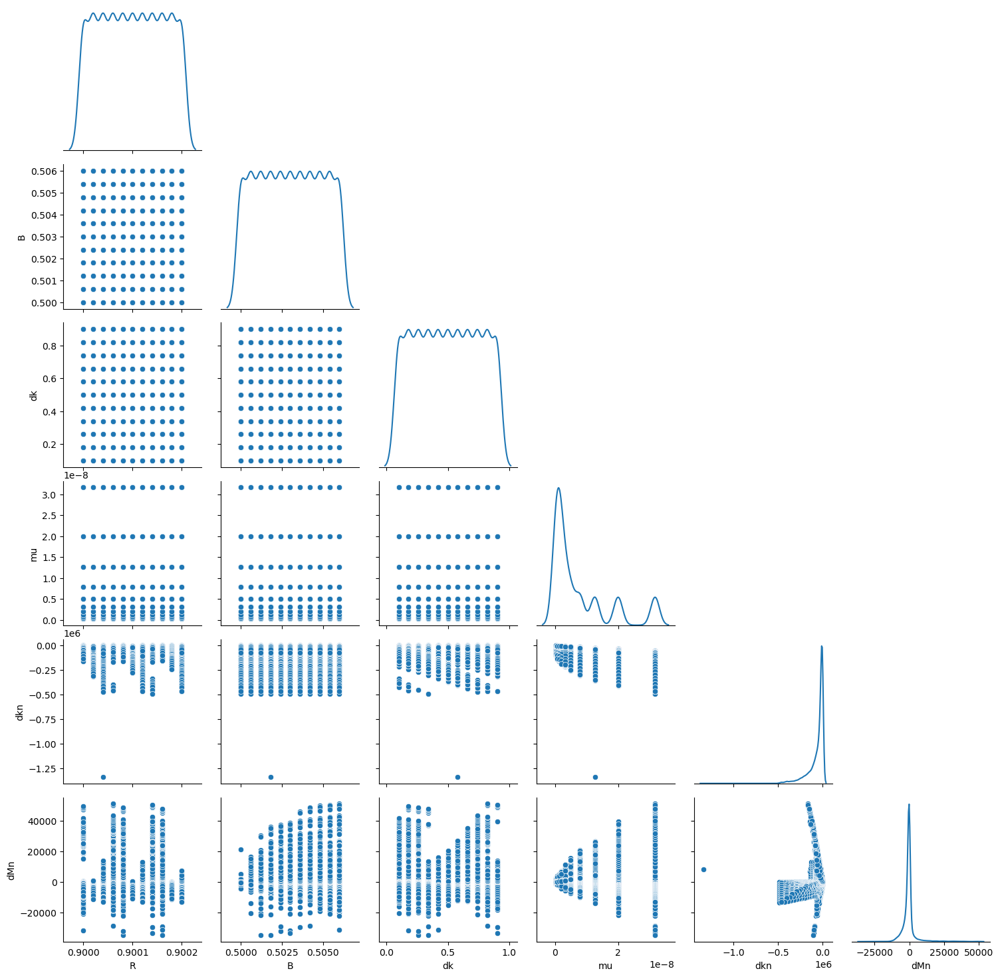

In [31]:
g = sns.PairGrid(tbl_red[4], diag_sharey=False, corner=True)

g.map_diag(sns.kdeplot)
g.map_lower(sns.scatterplot)

This large grid is difficult to decipher here, but contains $\mu$ variation for all of my parameters, which will be useful later. However, there are too few datapoints to use it for any other analysis.

The analysis will proceed as follows: 
 - Analysis of the $dk$-dependent structure can give us our period of the small-scale oscillations, as well as their functional form. 
 - Analysis of the $B$-dependent structure can give us our period of the large-scale oscillations, as well as the shape and behavior of all 4 of our oscillations:
     * $dkn$ vs $dk$ or $dR$
     * $dMn$ vs $dk$ or $dR$
     * $dkn$ vs $B$ 
     * $dMn$ vs $B$
 - Analysis of the $\mu$-dependent structure from our $dk$ and $\mu$ varying dataset can show how $\mu$ affects the structure. 
 - Analysis of the large-scale $R$-dependent structure can complete our picture, verifying our large-scale oscillations, and showing how $R$ affects the structure.

Actual numerical analysis of $\mu$ and $R$ dependence will need to be saved for later. 

# Small-Scale Oscillations

We are going to start by working with our $k$ and $\mu$ varying dataset.

In [33]:
tbl_red[1]

,dk,mu,dkn,dMn
0,0.0,3.162278e-09,-7969.899509,13.457522
1,0.0,3.236689e-09,-21241.450718,14.759672
2,0.0,3.312852e-09,-21655.040102,15.081138
3,0.0,3.390807e-09,-22075.471048,15.409241
4,0.0,3.470596e-09,-22502.823629,15.744108
...,...,...,...,...
9995,3.0,2.881350e-08,-102227.695108,100.520093
9996,3.0,2.949151e-08,-103715.570360,102.482218
9997,3.0,3.018547e-08,-105221.666897,104.480650
9998,3.0,3.089577e-08,-106746.223455,106.516039


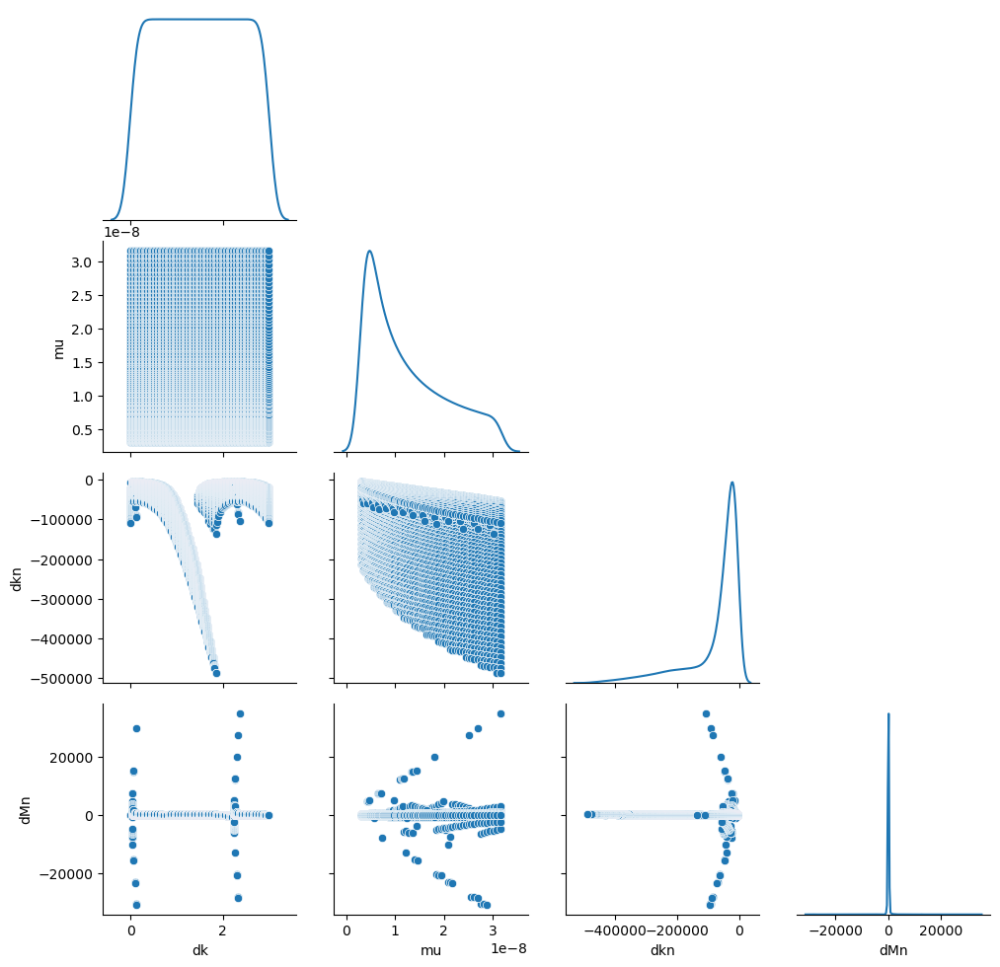

In [32]:
g = sns.PairGrid(tbl_red[1], diag_sharey=False, corner=True)

g.map_diag(sns.kdeplot)
g.map_lower(sns.scatterplot)

I am renaming my variables here, so that I don't need to remember which table number I am working with. All of the data is extracted from my table and put into arrays.

In [55]:
gind = 1

In [56]:
dk = dk_g[gind]
mu = mu_g[gind]

dkn_arr = np.zeros((grid_size, grid_size))
dMn_arr = np.zeros((grid_size, grid_size))

for r, rr in enumerate(dk_g[gind]):
    for b, bb in enumerate(mu_g[gind]):
        tbl_sel = tbl_red[gind][(tbl_red[gind]["dk"]==rr) &(tbl_red[gind]["mu"]==bb)]
        dkn_arr[r,b] = tbl_sel["dkn"].to_numpy()[0]
        dMn_arr[r,b] = tbl_sel["dMn"].to_numpy()[0]

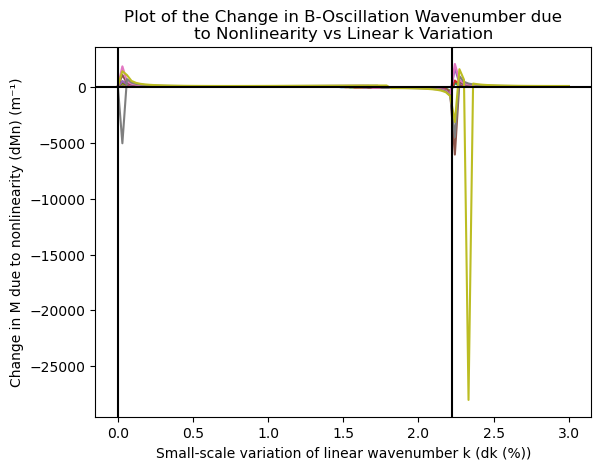

In [ ]:
# The indicies to plot are in an array, so that one can easily change which plots are displayed.

jj = [10, 20, 30, 40, 50, 60, 70, 80, 90]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in B-Oscillation Wave number Due\nto Nonlinearity vs Linear k Variation")
ax.set_ylabel('Change in M due to nonlinearity (dMn) (m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

for i in range(ilim):
    ax.plot(dk, dMn_arr[:, jj[i]])
plt.axline((0,0), (1e-15,0), color='k')
plt.axline((0,0), (0,1e-15), color='k')
plt.axline((2/R_g[gind][0],0), (2/R_g[gind][0],1e-15), color='k')
plt.show()

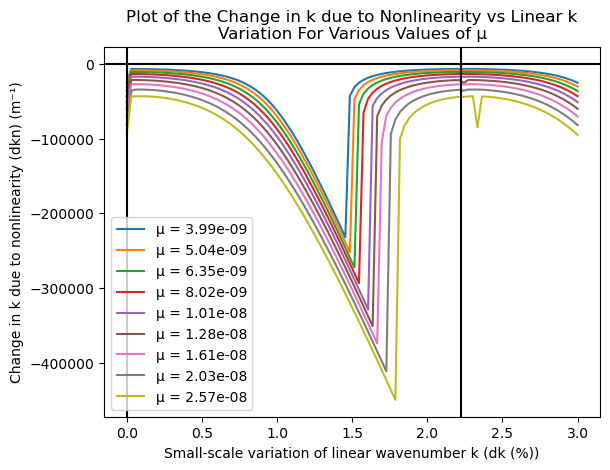

In [ ]:
# The indicies to plot are in an array, so that one can easily change which plots are displayed.

jj = [10, 20, 30, 40, 50, 60, 70, 80, 90]

ilim = len(jj)

# Define our plot object
fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs Linear k\nVariation For Various Values of \u03BC")
ax.set_ylabel('Change in k due to nonlinearity (dkn) (m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

h_list = [] # For making the legend.

# Our functions to plot
for i in range(ilim):
    line, = ax.plot(dk, dkn_arr[:, jj[i]], label = f'\u03BC = {mu[jj[i]]:.2e}')
    h_list.append(line)

# Lines for the axes and oscillation boundary.
plt.axline((0,0), (1e-15,0), color='k')
plt.axline((0,0), (0,1e-15), color='k')
plt.axline((2/R_g[gind][0],0), (2/R_g[gind][0],1e-15), color='k')

# Legend
ax.legend(handles=h_list)
plt.show()

My structure here appears to have a repetition on the scale of the decimal part of $\frac{kR}{2}$ as my period of $dk$ oscillations is $\frac{2}{R}$. However, $k= k_{F} + \frac{dk}{2 R_{max}}$, so my repetition is actually based on $k R R_{max} + \frac{dk R R_{max}}{2 R_{max}}$. The first term is always a whole number for $k_F = 1.2 \times 10^{10}$ and $R R_{max} = 9 \times 10^{-7}$, leaving us with the second term, $\frac{dk R}{2}$, and my repeating pattern is a function of the decimal part of $kR$, in real units.

This is not quite true, as the shape of the oscillations most likely has a dependence on large-scale variations $R$ and $k$, but for a fixed large scale variation of these parameters, our small-scale oscillations have their value based on the decimal part of $kR$, which produces very fast oscillations, given that $ 6.84 \times 10^{3} \le kR \le 1.2 \times 10^{4}$ for gold and our range of values for $R$. 

Before moving into trying to fit this shape to a tilted squared secant function, I will show this same oscillatory effect on the $R$ dependent graphs. I will extract this data from my $R$ and $B$ dependent dataset.

In [59]:
gind = 0

dR = (R_g[gind] - 0.9)*1e4 # To remove the constant part of R and analyze only the change
B  = B_g[gind]

del dkn_arr, dMn_arr

dkn_arr = np.zeros((grid_size, grid_size))
dMn_arr = np.zeros((grid_size, grid_size))

for r, rr in enumerate(R_g[gind]):
    for b, bb in enumerate(B_g[gind]):
        tbl_sel = tbl_red[gind][(tbl_red[gind]["R"]==rr) &(tbl_red[gind]["B"]==bb)]
        dkn_arr[r,b] = tbl_sel["dkn"].to_numpy()[0] / 100000 # rescaling to make plots easier to read
        dMn_arr[r,b] = tbl_sel["dMn"].to_numpy()[0] / 10000 # rescaling to make plots easier to read

Period calculations. 
We know that $dk = 0.45$ or $0.225 \times 10^6$, 
$k_0 = 1.2 \times 10^{10}$, 
$R_0 = 0.9$ or $0.9 \times 10^{-6}$ and 
$dR = dR_{shown} \times 10^{-10}$. 
\begin{equation}
kR = k_0 R_0 + k_0 dR + dk R_0 + dk dR
\end{equation}
The $k_0 R_0$ and $dk dR$ terms are irrelevant, as the first always gives a whole number and the second is too small to be seen. So we have
\begin{equation}
kR = k_0 dR + dk R_0 = 1.2 dR_{shown} + 0.225 * 0.9 =  0.2025 + 1.2 R_{shown}.
\end{equation}
This is 0 when $R_{shown} = - 0.2025 / 1.2 = -0.16875$, and 1 when $R_{shown} = -0.16875 + 1/1.2 = 1.0208$.

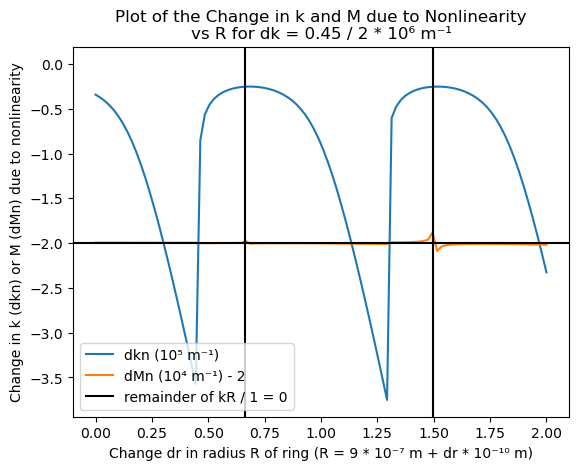

In [ ]:
# The indexes to plot are in an array, so that one can easily change which plots are displayed.
# I have chosen the B value which sits at our node, like for the dk graph case. 
# I will analyze the rest of this data later. 

jj = [0]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k and M Due to Nonlinearity\nvs R for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9")
ax.set_ylabel('Change in k (dkn) or M (dMn) due to nonlinearity')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

# Graphs
for i in range(ilim):
    ax.plot(dR, dkn_arr[:,jj[i]], label="dkn (10\u2075 m\u207b\u00b9)")
    ax.plot(dR, dMn_arr[:,jj[i]] - 2, label="dMn (10\u2074 m\u207b\u00b9) - 2") # The shift of this axis is so that they can both be seen together.

# Our black lines designate the expected period boundaries
plt.axline((0,-2), (1e-15,-2), color='k')
shift = - 0.16875 + 1/1.2
plt.axline((shift,0), (shift,1e-15), color='k', label="remainder of kR / 1 = 0")
shift = shift + 1/1.2
plt.axline((shift,0), (shift,1e-15), color='k')

plt.legend()

plt.show()

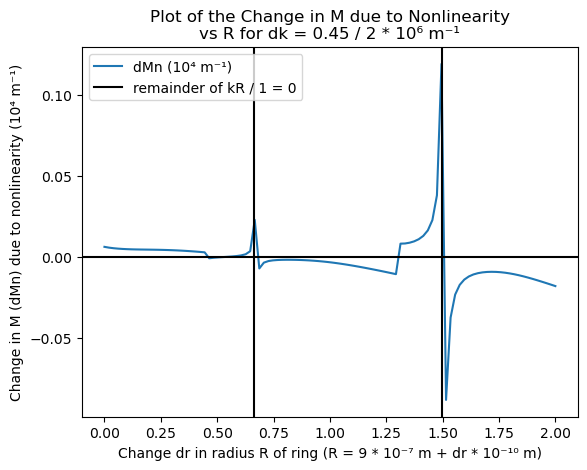

In [ ]:
# Now to show the dMn graph separately. The structure can be seen to prefer the indicated points. 
# The actual shape of the structure is actual incorrect due to our imprecision, but this will 
# be seen later.

jj = [0]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in M Due to Nonlinearity\nvs R for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

# Graph
for i in range(ilim):
    ax.plot(dR, dMn_arr[:,jj[i]], label="dMn (10\u2074 m\u207b\u00b9)")

# Our indicator lines
plt.axline((0,0), (1e-15,0), color='k')
shift = - 0.16875 + 1/1.2
plt.axline((shift,0), (shift,1e-15), color='k', label="remainder of kR / 1 = 0")
shift = shift + 1/1.2
plt.axline((shift,0), (shift,1e-15), color='k')

plt.legend()

plt.show()

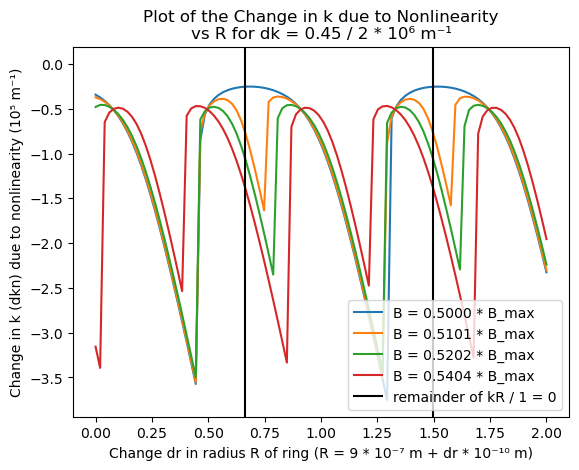

In [ ]:
# I can show this for more B values to show that this period is correct, but the B oscillation will be analyzed later.

jj = [0, 10, 20, 40]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity\nvs R for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(dR, dkn_arr[:,jj[i]], label = f'B = {B[jj[i]]:.4f} * B_max')

shift = - 0.16875 + 1/1.2
plt.axline((shift,0), (shift,1e-15), color='k', label="remainder of kR / 1 = 0")
shift = shift + 1/1.2
plt.axline((shift,0), (shift,1e-15), color='k')

plt.legend()

plt.show()

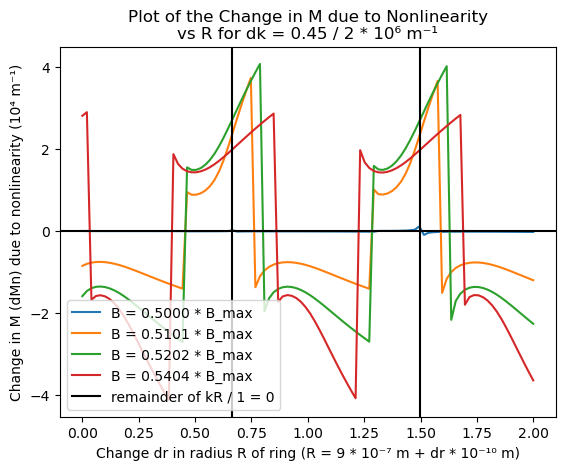

In [ ]:
jj = [0, 10, 20, 40]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in M Due to Nonlinearity\nvs R for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(dR, dMn_arr[:,jj[i]], label = f'B = {B[jj[i]]:.4f} * B_max') 

plt.axline((0,0), (1e-15,0), color='k')
shift = - 0.16875 + 1/1.2
plt.axline((shift,0), (shift,1e-15), color='k', label="remainder of kR / 1 = 0")
shift = shift + 1/1.2
plt.axline((shift,0), (shift,1e-15), color='k')

plt.legend()

plt.show()

Neither $\mu$ nor $B$ change this period, although they both change the structure of the graph. The fact that our chosen starting point of oscillations is significant is not always obvious. Let us now extract that skewed secant squared pattern, then move on to the $B$ analysis, which clearly shows all of the oscillatory behavior.

# Rotated Secant Squared

In [81]:
gind = 1

In [82]:
dk = dk_g[gind]
mu = mu_g[gind]

dkn_arr = np.zeros((grid_size, grid_size))
dMn_arr = np.zeros((grid_size, grid_size))

for r, rr in enumerate(dk_g[gind]):
    for b, bb in enumerate(mu_g[gind]):
        tbl_sel = tbl_red[gind][(tbl_red[gind]["dk"]==rr) &(tbl_red[gind]["mu"]==bb)]
        dkn_arr[r,b] = tbl_sel["dkn"].to_numpy()[0]
        dMn_arr[r,b] = tbl_sel["dMn"].to_numpy()[0]

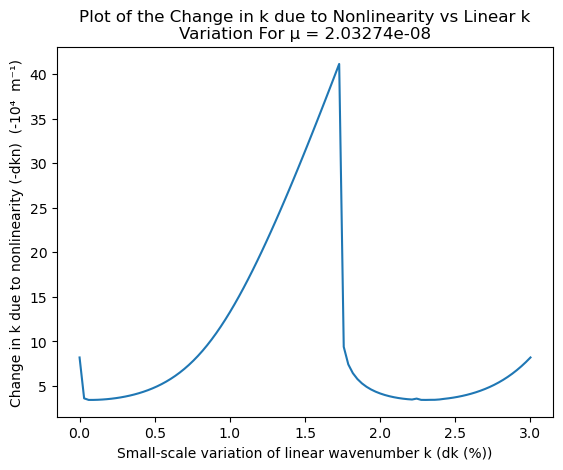

In [ ]:
# Plot of our dkn vs dk data for a single chosen value of mu

jj = [80]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k due to Nonlinearity vs Linear k\nVariation For \u03BC = {mu[jj[0]]:.5e}")
ax.set_ylabel('Change in k due to nonlinearity (-dkn)  (-10\u2074  m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

ax.plot(dk, -dkn_arr[:, jj[0]]/10000)

plt.show()

In [85]:
# We are now going to work with the one curve shown above, and try to extract its shape.
# We start by finding the minimum absolute value of our curve.
# Note that our changes in fast oscillation period are always negative, so we switched the sign
# in order to work with positive numbers.

min_dkn = np.min(-dkn_arr[2:, jj[0]]/10000)
period = 2/0.9

In [ ]:
# We know that tan^2 + sec^2 = 1, so we will move the function to the x axis and
# match the function to tan^2 instead of sec^2. This will be convenient later, 
# when we want to rotate this curve around our minimum.

model1 = min_dkn*np.power(np.tan(0.9*pi*dk/2),2)

# Now we need to cut off values of our function which are too large, so that 
# the plot focuses on our relevant values of dkn.

for i,j in enumerate(model1):
    if j > 40: model1[i] = 40

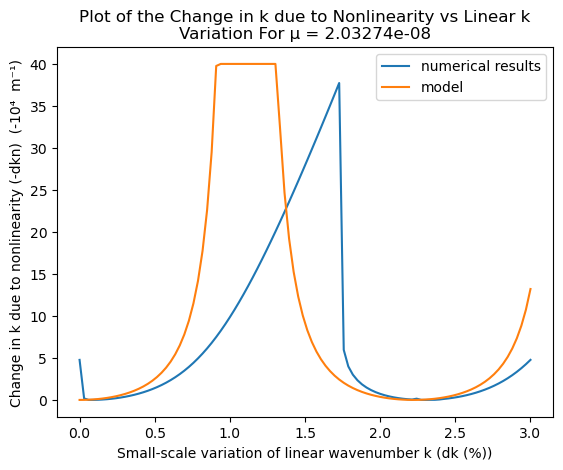

In [ ]:
# for easy changing which two plots to use.

jj = [80]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k due to Nonlinearity vs Linear k\nVariation For \u03BC = {mu[jj[0]]:.5e}")
ax.set_ylabel('Change in k due to nonlinearity (-dkn)  (-10\u2074  m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

ax.plot(dk, -dkn_arr[:, jj[0]]/10000 - min_dkn, label = "numerical results") # We are rescaling dkn and moving it to the axis.
ax.plot(dk, model1, label = "model")

plt.legend()

plt.show()

This functional form looks somewhat similar, but it is not obvious that it is correct yet. Now I will try to rotate this tangent squared curve around the minimum, using a rotation matrix.

In [91]:
# tangent squared model
model1 = -min_dkn*np.power(np.tan(0.9*pi*dk/2),2) 

x2 = np.zeros(grid_size) # New x values
y2 = np.zeros(grid_size) # New y values
theta = 0.02025 # This is our rotation angle, which we adjust by hand for now.

# Apply the rotation matrix
for i,y1 in enumerate(model1):
    x1 = dk[i]
    x2[i] = np.cos(theta)* x1 - np.sin(theta)*y1
    y2[i] = np.sin(theta)* x1 - np.cos(theta)*y1

# remove values which are too large
for i,j in enumerate(y2):
    if j > 40: y2[i] = None
for i, j in enumerate(x2):
    if j > 3: x2[i]= None

Here is my plot. Note that I have shifted the x values by a value inserted by hand and the rotation angle has also been tuned by hand. I will eventually need to construct a nonlinear regression script for fitting this function, but for now I just want to know what the function is and what parameters it has.

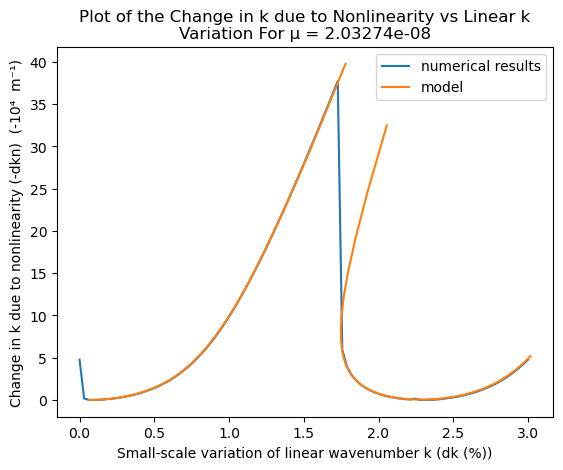

In [92]:
fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k due to Nonlinearity vs Linear k\nVariation For \u03BC = {mu[jj[0]]:.5e}")
ax.set_ylabel('Change in k due to nonlinearity (-dkn)  (-10\u2074  m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wavenumber k (dk (%))")

ax.plot(dk, -dkn_arr[:, jj[0]]/10000 - min_dkn, label = "numerical results")

ax.plot(x2+0.065, y2, label = 'model') # Shift the modeled skewed secant squared curve over by the set value.

plt.legend()

plt.show()

This curve looks like a good fit. I just need to cut off values from the left curve where they overlap on the right curve, and all of the values on the left hand side of the right curve where they overlap another x point on that curve.

In [93]:
# If one of x or y is already removed, remove the other.
for i in range(grid_size):
    if np.isnan(y2[i]): x2[i] = None
    if np.isnan(x2[i]): y2[i] = None

In [ ]:
# I need to find the overlaps within the x array. I know the array values are in order for x1, 
# which means that there will be values for the first tangent squared curve, then for the second.
# I want to first look for the removed values, which exist for the cutoff, 
# in order to separate these curves, since I know that removed values will appear at the two sides
# of each curve.

arg1 = np.argwhere(np.isnan(x2))[0][0]
arg2 = np.argwhere(np.isnan(y2))[0][0]

arg1_arr = np.argwhere(np.isnan(x2))[:,0]
arg2_arr = np.argwhere(np.isnan(y2))[:,0]

# Find the first spacing in my array of NaN indexes which is greater than one, indicating that these indexes 
# come from different chunks of data which have been removed. 
loc1 = np.where(arg1_arr[1:]-arg1_arr[:-1] > 1)[0][0]

# This is then the minimum and maximum indexes of data which has not been removed, for the right curve.
loc2 = arg1_arr[loc1]+1
loc3 = arg1_arr[loc1+1]-1

In [95]:
# Find the minimum x value of this curve. 
x2_min_2 = np.min(x2[loc2:loc3])

# I will now remove all data for the points which have x2 value greater than a point which appears to 
# its right in the array, and therefore has a lower value for x1.

# This clears this data for the left curve.
for i in range(arg1):
    if x2[i] > x2_min_2:
        x2[i] = None
        y2[i] = None

# This is the index of my x2 minimum for the right curve
loc4 = np.argmin(x2[loc2:loc3])+loc2

# And now to clear the data for the right curve.
for i in range(loc2, loc4):
    x2[i] = None
    y2[i] = None

And now to plot the results of this data removal.

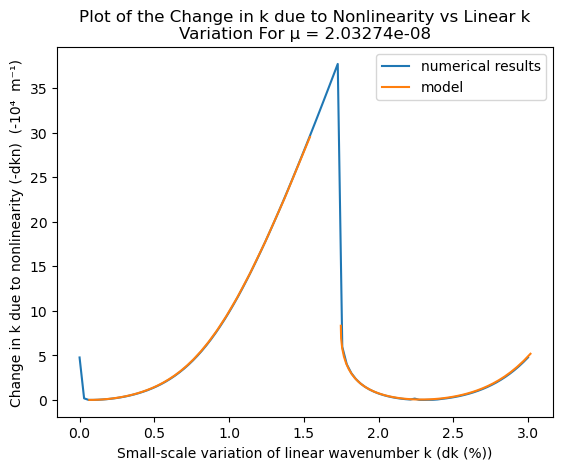

In [ ]:
fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k due to Nonlinearity vs Linear k\nVariation For \u03BC = {mu[jj[0]]:.5e}")
ax.set_ylabel('Change in k due to nonlinearity (-dkn)  (-10\u2074  m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

ax.plot(dk, -dkn_arr[:, jj[0]]/10000 - min_dkn, label = "numerical results")

ax.plot(x2+0.065, y2, label = "model")

plt.legend()

plt.show()

And the problem with multiple values for dkn for certain dk values is gone. Now I have an algorithm to create a curve which can fit this fast oscillation curve decently enough. Now to show it for another curve, then to move to examining the next shape.

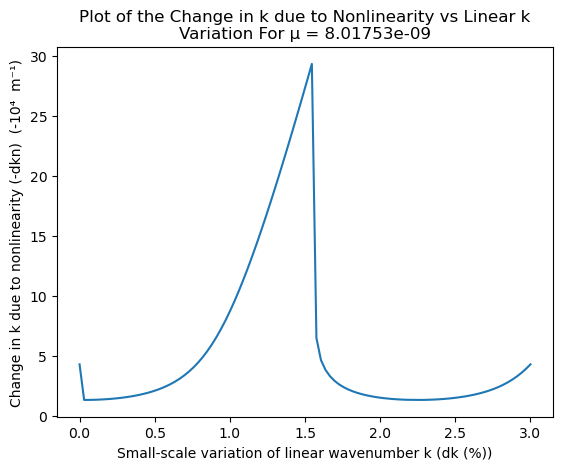

In [ ]:
jj = [40]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k due to Nonlinearity vs Linear k\nVariation For \u03BC = {mu[jj[0]]:.5e}")
ax.set_ylabel('Change in k due to nonlinearity (-dkn)  (-10\u2074  m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

ax.plot(dk, -dkn_arr[:, jj[0]]/10000)

plt.show()

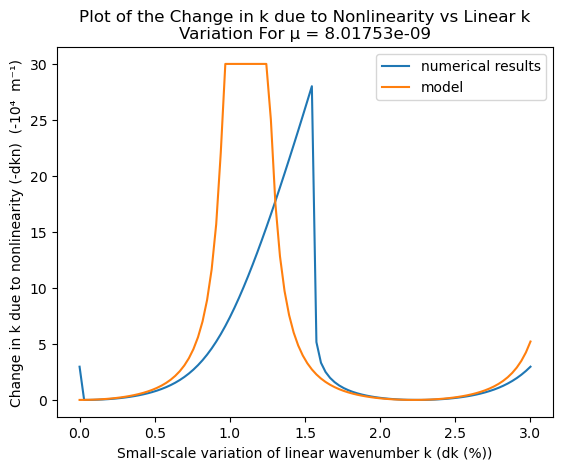

In [ ]:
min_dkn = np.min(-dkn_arr[2:, jj[0]]/10000)
per = 2/0.9

model1 = min_dkn*np.power(np.tan(0.9*pi*dk/2),2)

for i,j in enumerate(model1):
    if j > 30: model1[i] = 30

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k due to Nonlinearity vs Linear k\nVariation For \u03BC = {mu[jj[0]]:.5e}")
ax.set_ylabel('Change in k due to nonlinearity (-dkn)  (-10\u2074  m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

ax.plot(dk, -dkn_arr[:, jj[0]]/10000 - min_dkn, label = "numerical results")
ax.plot(dk, model1, label = "model")

plt.legend()

plt.show()

In [100]:
model1 = -min_dkn*np.power(np.tan(0.9*pi*dk/2),2)

x2 = np.zeros(grid_size)
y2 = np.zeros(grid_size)
theta = 0.0199

for i,y1 in enumerate(model1):
    x1 = dk[i]
    x2[i] = np.cos(theta)* x1 - np.sin(theta)*y1
    y2[i] = np.sin(theta)* x1 - np.cos(theta)*y1


for i,j in enumerate(y2):
    if j > 30: y2[i] = None
for i, j in enumerate(x2):
    if j > 3: x2[i]= None

for i in range(grid_size):
    if np.isnan(y2[i]): x2[i] = None
    if np.isnan(x2[i]): y2[i] = None

arg1 = np.argwhere(np.isnan(x2))[0][0]
arg2 = np.argwhere(np.isnan(y2))[0][0]
arg1_arr = np.argwhere(np.isnan(x2))[:,0]
arg2_arr = np.argwhere(np.isnan(y2))[:,0]
loc1 = np.where(arg1_arr[1:]-arg1_arr[:-1] > 1)[0][0]
loc2 = arg1_arr[loc1]+1
loc3 = arg1_arr[loc1+1]-1
loc2,loc3
x2_min_2 = np.min(x2[loc2:loc3])
x2[loc2:loc3]
for i in range(arg1):
    if x2[i] > x2_min_2:
        x2[i] = None
        y2[i] = None

loc4 = np.argmin(x2[loc2:loc3])+loc2
for i in range(loc2, loc4):
    x2[i] = None
    y2[i] = None

arg1_find_arr = arg1_arr[1:]-arg1_arr[:-1]
ind1 = np.min([arg1,arg2])-1

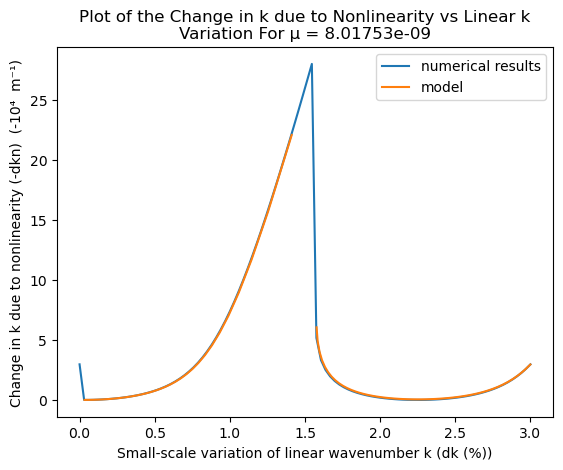

In [ ]:
fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k due to Nonlinearity vs Linear k\nVariation For \u03BC = {mu[jj[0]]:.5e}")
ax.set_ylabel('Change in k due to nonlinearity (-dkn)  (-10\u2074  m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

ax.plot(dk, -dkn_arr[:, jj[0]]/10000 - min_dkn, label = "numerical results")

ax.plot(x2+0.033, y2, label = "model")

plt.legend()

plt.show()

My values for the amplitude, rotation angle, and x translation are different, but it still seems to work.

# B Analysis for $dkn$ vs $R$

And now for the $B$ analysis, which shows all types of oscillations in the changes of fast and slow oscillation wave number.

In [102]:
gind = 0

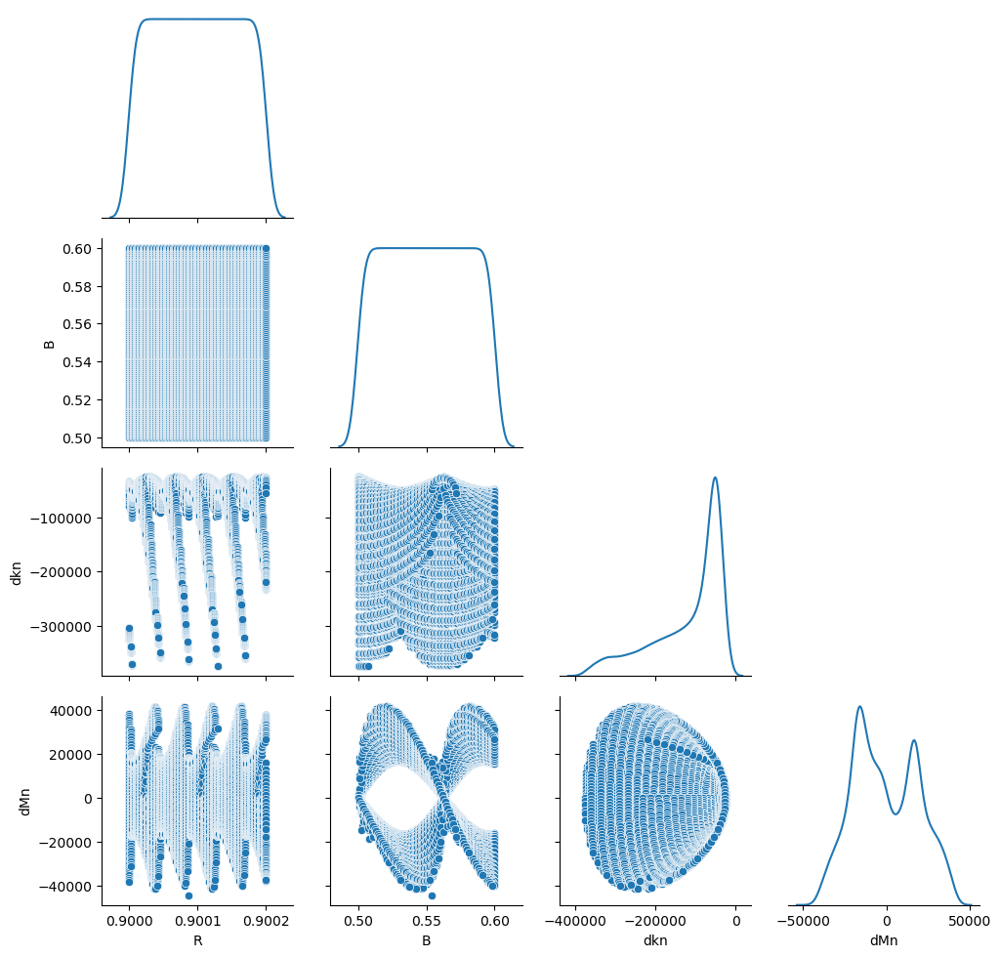

In [103]:
g = sns.PairGrid(tbl_red[0], diag_sharey=False, corner=True)

g.map_diag(sns.kdeplot)
g.map_lower(sns.scatterplot)

We start by loading our data.

In [104]:
del dkn_arr, dMn_arr

dkn_arr = np.zeros((grid_size, grid_size))
dMn_arr = np.zeros((grid_size, grid_size))

for r, rr in enumerate(R_g[gind]):
    for b, bb in enumerate(B_g[gind]):
        tbl_sel = tbl_red[gind][(tbl_red[gind]["R"]==rr) &(tbl_red[gind]["B"]==bb)]
        dkn_arr[r,b] = tbl_sel["dkn"].to_numpy()[0]
        dMn_arr[r,b] = tbl_sel["dMn"].to_numpy()[0]

In [105]:
#B and B will be rescaled to show only the difference from our 
scale_R = 1/10000
R0 = 0.9
B0 = 0.5
dk = dk_g[gind][0]

R = (R_g[gind] - R0)/scale_R
B = B_g[gind] - B0

In [106]:
# We will learn here that our oscillations are based on the fractional part of B * R^2 * pi^2
# Here are a few functions for calculating our period boundaries.

def find_count_B_osc(dR, dB):
    R = dR * scale_R  + R0
    B = dB + B0
    count =  B * R**2 * pi**2
    return count

def find_count_k_osc(dR):
    k = (k0 + dk * 1e6 / 2) / 1e6
    R = dR * scale_R + R0
    return k * R

def find_dB_B_osc(n, dR = 0):
    R = dR * scale_R  + R0
    # n = B * R^2 * pi^2
    dB = n / (R**2 * pi**2) - B0
    return dB

def find_dR_k_osc(n):
    # n = k0 * R0 + k0 dR + dk R0 + dk dR
    k0_diff = k0 * R0 % 1
    # n - k0_diff = k0 dR + dk R0
    dk2 = dk / 2
    dR = (n - k0_diff - dk2 * R0) / k0 / scale_R * 1e6
    return dR

I will start with my $dkn$ vs $dR$ graphs.

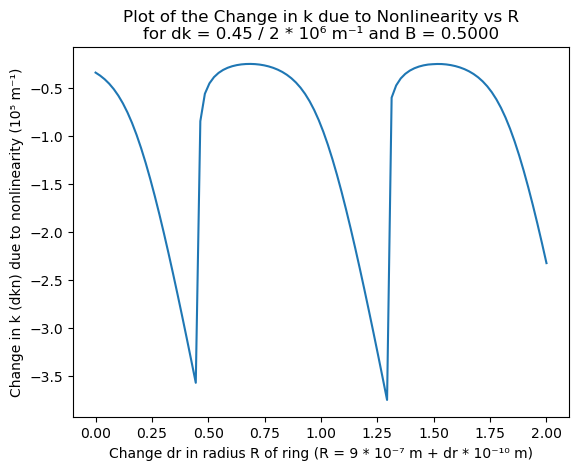

In [ ]:
# Again, choose the indexes beforehand. This is a B value on my B node, as I will see later.

Bi = [0]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 and B = {B0+Bi[0]:.4f}")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dkn_arr[:, Bi[i]]/100000)

plt.show()

In [109]:
print("Number of fast cycles:", find_count_k_osc(dR[-1]) - find_count_k_osc(dR[0]))
print("Position of fast cycle starts:", find_dR_k_osc(1), ", ", find_dR_k_osc(2))

Number of fast cycles: 2.4000449999984994
Position of fast cycle starts: 0.6645833333333333 ,  1.4979166666666663


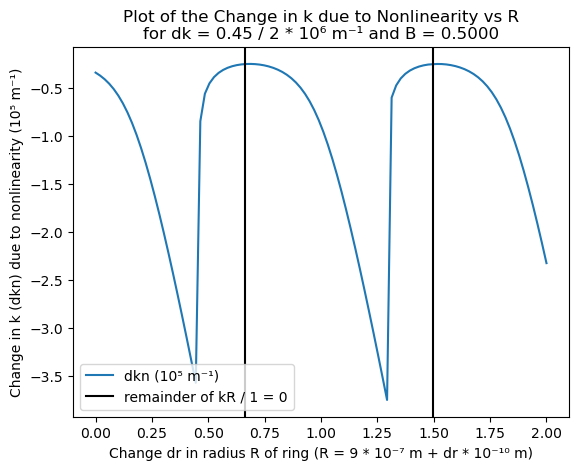

In [ ]:
# Again, choose the indexes beforehand.

Bi = [0]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 and B = {B0+Bi[0]:.4f}")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dkn_arr[:, Bi[i]]/100000, label = "dkn (10\u2075 m\u207b\u00b9)")

# Our cycle boundaries
plt.axline((find_dR_k_osc(1),-0.5), (find_dR_k_osc(1),-0.6), color='k', label="remainder of kR / 1 = 0")
plt.axline((find_dR_k_osc(2),-0.5), (find_dR_k_osc(2),-0.6), color='k')

plt.legend()

plt.show()

We start here at a $B$ node. The cycles start at the minima of our curve.

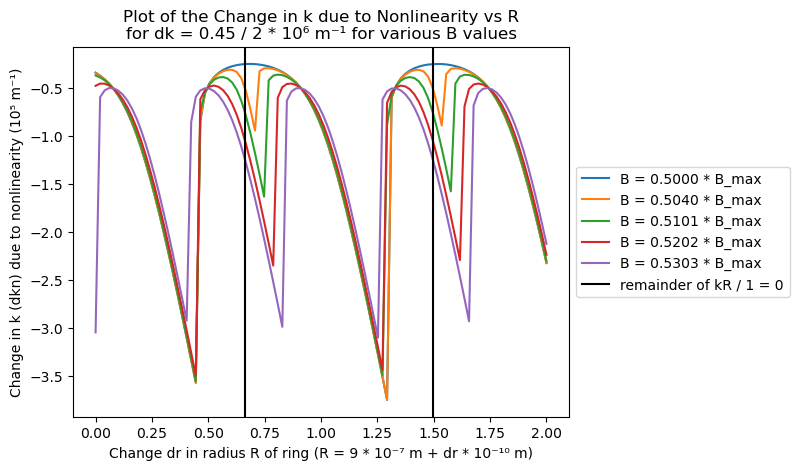

In [ ]:
Bi = [0, 4, 10, 20, 30]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for various B values")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dkn_arr[:, Bi[i]]/100000, label = f"B = {B0+B[Bi[i]]:.4f} * B_max")
plt.axline((find_dR_k_osc(1),-0.5), (find_dR_k_osc(1),-0.6), color='k', label="remainder of kR / 1 = 0")
plt.axline((find_dR_k_osc(2),-0.5), (find_dR_k_osc(2),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

In [113]:
B[30]

0.030303030303030276

As $B$ increases, a spike rises from this midpoint. This spike is the same spike of our original function, but shifted over by a half cycle. As the new pattern grows (which is our old pattern shifted by half a cycle), the old curve will recede slightly. Around $B = 0.53$, our two curves have equal height. 

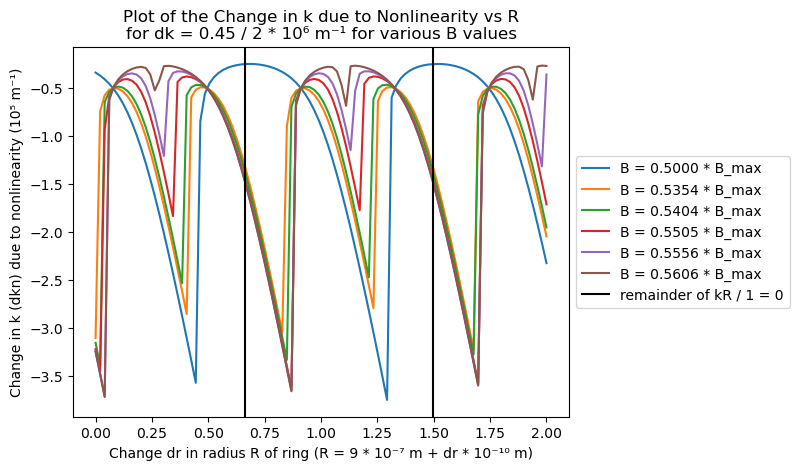

In [ ]:
# for easy changing which two plots to use.

Bi = [0, 35, 40, 50, 55, 60]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for various B values")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dkn_arr[:, Bi[i]]/100000, label = f"B = {B0+B[Bi[i]]:.4f} * B_max")
plt.axline((find_dR_k_osc(1),-0.5), (find_dR_k_osc(1),-0.6), color='k', label="remainder of kR / 1 = 0")
plt.axline((find_dR_k_osc(2),-0.5), (find_dR_k_osc(2),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

The blue curve here is the original $B = 0.5$ curve at our $B$ node. We see now that the spike of our old cycle is now receding, with the growth of the new spike being almost complete, even at the earliest of the depicted $B$ values besides our reference. 

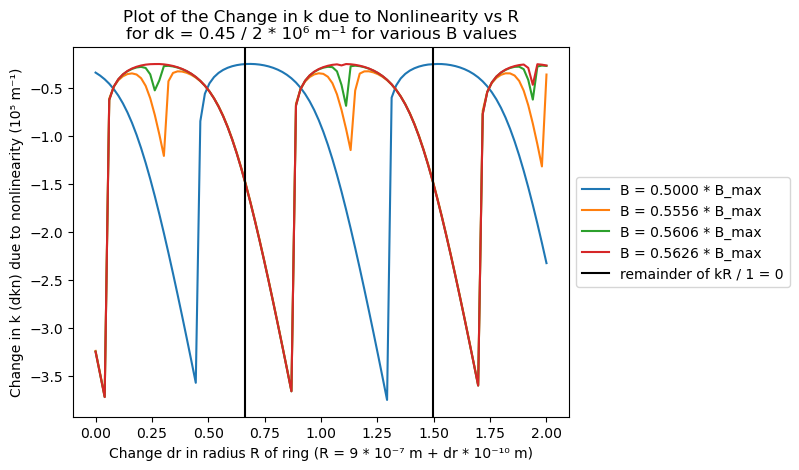

In [ ]:
Bi = [0, 55, 60, 62]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for various B values")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dkn_arr[:, Bi[i]]/100000, label = f"B = {B0+B[Bi[i]]:.4f} * B_max")
    
plt.axline((find_dR_k_osc(1),-0.5), (find_dR_k_osc(1),-0.6), color='k', label="remainder of kR / 1 = 0")
plt.axline((find_dR_k_osc(2),-0.5), (find_dR_k_osc(2),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

In [116]:
B[62]

0.06262626262626259

Now we have the completed shift at around $B = 0.563$, our next node of $B$, which is the midpoint in the $B$ cycle.

This is a graph from my full $B$ range dataset which which shows the two secant squared shapes at the two types of nodes in the period, with the sum of them both at the peaks placed on top. The two peaks of this sum are slightly less than each of the individual peaks.

In [117]:
# Load the data from the fourth dataset for full $B$ range.
gind = 3

del dkn_arr, dMn_arr

dkn_arr = np.zeros((gs_r2, gs_b2))
dMn_arr = np.zeros((gs_r2, gs_b2))

for r, rr in enumerate(R_g[gind]):
    for b, bb in enumerate(B_g[gind]):
        tbl_sel = tbl_red[gind][(tbl_red[gind]["R"]==rr) &(tbl_red[gind]["B"]==bb)]
        dkn_arr[r,b] = tbl_sel["dkn"].to_numpy()[0]
        dMn_arr[r,b] = tbl_sel["dMn"].to_numpy()[0]

# B and R for the fourth dataset
dk = dk_g[gind][0]

R = (R_g[gind] - R0)/scale_R
B = B_g[gind]

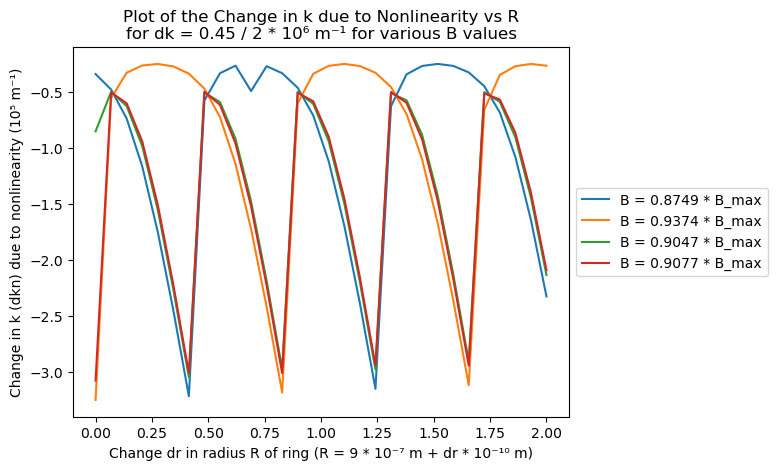

In [ ]:
# And show our plot
bmn = 85

Bi = [4+bmn, 25+bmn, 14+bmn, 15+bmn]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for various B values")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dkn_arr[:, Bi[i]]/100000, label = f"B = {B0+B[Bi[i]]:.4f} * B_max")

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

# $dkn$ vs $B$

In [119]:
# Reload the data from our first dataset, as I had temporarily used the 4th dataset previously

gind = 0

del dkn_arr, dMn_arr

dkn_arr = np.zeros((grid_size, grid_size))
dMn_arr = np.zeros((grid_size, grid_size))

for r, rr in enumerate(R_g[gind]):
    for b, bb in enumerate(B_g[gind]):
        tbl_sel = tbl_red[gind][(tbl_red[gind]["R"]==rr) &(tbl_red[gind]["B"]==bb)]
        dkn_arr[r,b] = tbl_sel["dkn"].to_numpy()[0]
        dMn_arr[r,b] = tbl_sel["dMn"].to_numpy()[0]

#B and B will be rescaled to show only the difference from our 
dk = dk_g[gind][0]

R = (R_g[gind] - R0)/scale_R
B = B_g[gind] - B0

The next plots should show this same $dkn$ analysis, but for $dkn$ vs $B$ plots. 

In [120]:
# For reference
print("Position of fast cycle starts:", find_dR_k_osc(1), ", ", find_dR_k_osc(2))

Position of fast cycle starts: 0.6645833333333333 ,  1.4979166666666663


In [121]:
# To translate our dR value to an index, when we know that R[-1] = 2
# The third number is the midway point.
find_dR_k_osc(1) / 2 * 100, find_dR_k_osc(2) / 2 * 100, find_dR_k_osc(1.5) / 2 * 100,

(33.229166666666664, 74.89583333333331, 54.06249999999999)

We want R indicies from 33 to 75.

In [122]:
# And for our lines marking the B oscillation boundaries.
find_dB_B_osc(4), find_dB_B_osc(5)

(0.00035152415969275097, 0.12543940519961594)

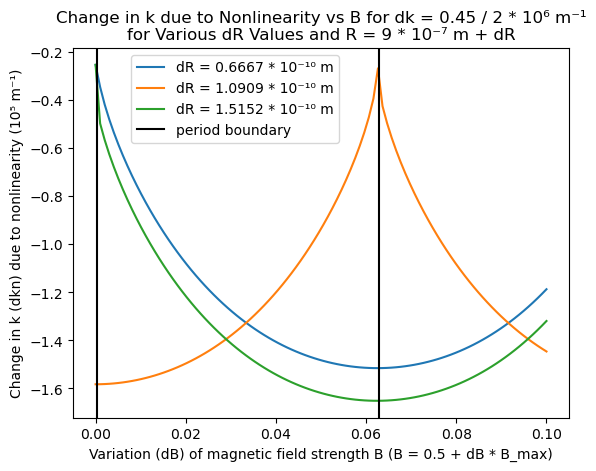

In [ ]:
# Here are the most obvious plots to show

Ri = [33, 54, 75]

ilim = len(Ri)

fig, ax = plt.subplots()

plt.title(f"Change in k Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = 0.5 + dB * B_max)")

for i in range(ilim):
    ax.plot(B, dkn_arr[Ri[i],:]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")
plt.axline((find_dB_B_osc(4),-0.4), (find_dB_B_osc(4),-0.41), color='k', label ="period boundary")
plt.axline((find_dB_B_osc(4.5),-0.4), (find_dB_B_osc(4.5),-0.41), color='k')

plt.legend(bbox_to_anchor=(0.55, 1))

plt.show()

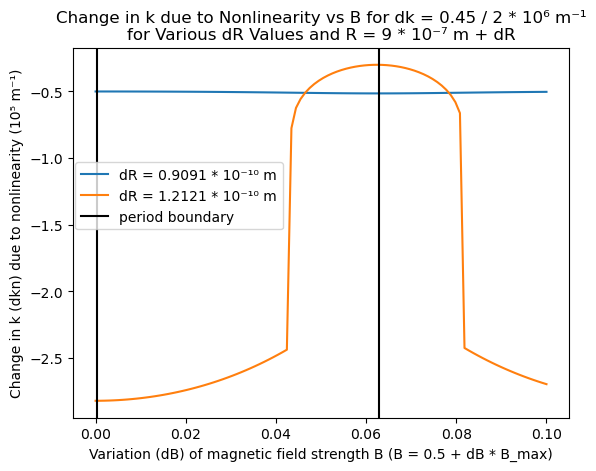

In [ ]:
# To show the largest and smallest variations of dkn

Ri = [45, 60]

ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = 0.5 + dB * B_max)")

for i in range(ilim):
    ax.plot(B, dkn_arr[Ri[i],:]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")

plt.axline((find_dB_B_osc(4),-0.5), (find_dB_B_osc(4),-0.6), color='k', label = "period boundary")
plt.axline((find_dB_B_osc(4.5),-0.5), (find_dB_B_osc(4.5),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(-0.01, 0.6))

plt.show()

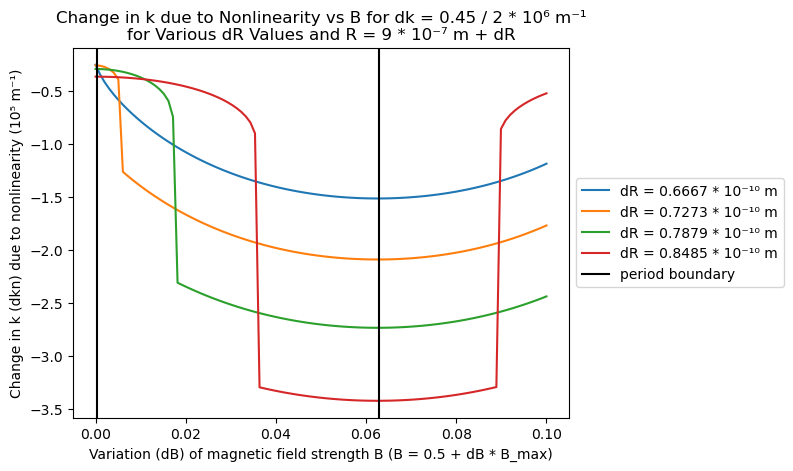

In [ ]:
Ri = [33, 36, 39, 42]

ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = 0.5 + dB * B_max)")

for i in range(ilim):
    ax.plot(B, dkn_arr[Ri[i],:]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")

plt.axline((find_dB_B_osc(4),-0.5), (find_dB_B_osc(4),-0.6), color='k', label = 'period boundary')
plt.axline((find_dB_B_osc(4.5),-0.5), (find_dB_B_osc(4.5),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

Around dB[45], I reach the peak of my spike and drip down to a node in $R$, where the $B$ oscillations disappear. 

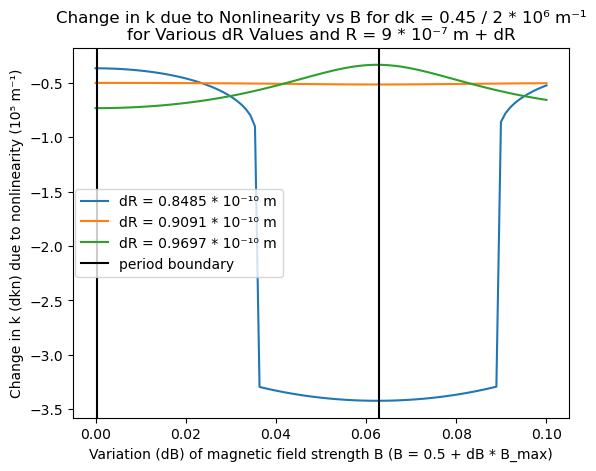

In [ ]:
Ri = [42, 45, 48]

ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = 0.5 + dB * B_max)")

for i in range(ilim):
    ax.plot(B, dkn_arr[Ri[i],:]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")

plt.axline((find_dB_B_osc(4),-0.5), (find_dB_B_osc(4),-0.6), color='k', label = 'period boundary')
plt.axline((find_dB_B_osc(4.5),-0.5), (find_dB_B_osc(4.5),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(-0.01, 0.5))

plt.show()

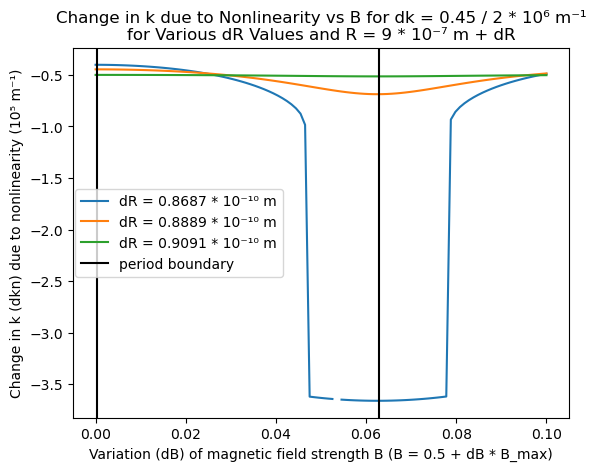

In [ ]:
Ri = [43,44,45]

ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = 0.5 + dB * B_max)")

for i in range(ilim):
    ax.plot(B, dkn_arr[Ri[i],:]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")
plt.axline((find_dB_B_osc(4),-0.5), (find_dB_B_osc(4),-0.6), color='k', label = 'period boundary')
plt.axline((find_dB_B_osc(4.5),-0.5), (find_dB_B_osc(4.5),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(-0.01, 0.5))

plt.show()

The point where my curve is constant in $B$ is after the drop in values from the spike. Note that B[44] is already after the drop in absolute value, but B[45] is my constant $dkn$ value.

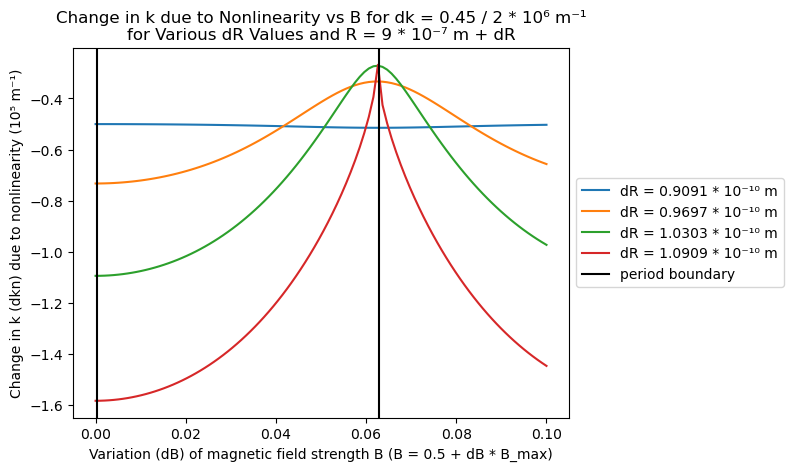

In [ ]:
Ri = [45, 48, 51, 54]

ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = 0.5 + dB * B_max)")

for i in range(ilim):
    ax.plot(B, dkn_arr[Ri[i],:]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")

plt.axline((find_dB_B_osc(4),-0.5), (find_dB_B_osc(4),-0.6), color='k', label = 'period boundary')
plt.axline((find_dB_B_osc(4.5),-0.5), (find_dB_B_osc(4.5),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

At our midpoint of the $R$ oscillation (the red curve above), our pattern matches our oscillations at the period boundaries, but shifted by half a period. This is the same behavior which we saw in the $dkn$ vs $R$ plots, only with a different pattern. These cycles look like cycloids. 

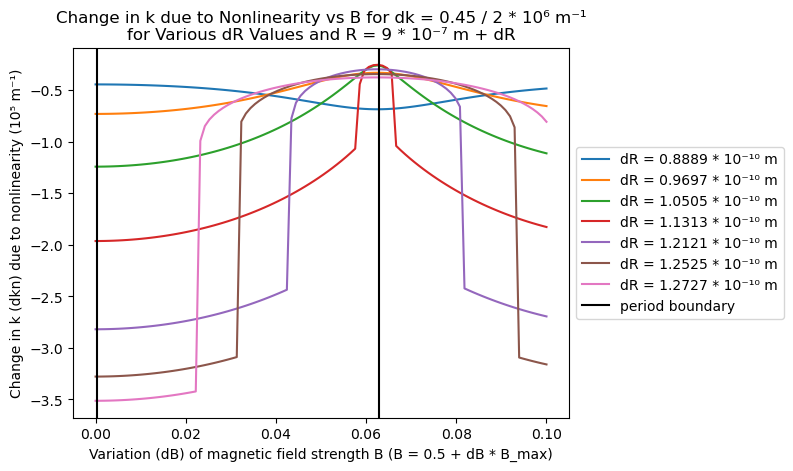

In [ ]:
# for easy changing which two plots to use.

Ri = [44, 48, 52, 56,60, 62, 63]

ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = 0.5 + dB * B_max)")

for i in range(ilim):
    ax.plot(B, dkn_arr[Ri[i],:]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")

plt.axline((find_dB_B_osc(4),-0.5), (find_dB_B_osc(4),-0.6), color='k', label = 'period boundary')
plt.axline((find_dB_B_osc(4.5),-0.5), (find_dB_B_osc(4.5),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

The curves between pattern flipping on the side with the node loop like the Jacobian elliptic dn functions, while on the side with the spike, they look like two different symmetric curves, one facing up and one facing down, with a jump connecting them. They might be cycloid arcs, but I don't think so. I am going to try to matching the cycloid-looking curves, then move on to the shape of the next oscillation.

In [154]:
# this is the parametric definition of a cycloid
def cycl(r, t, x0):
    x = r * (t - np.sin(t)) + x0
    y = r * (1 - np.cos(t))
    return x, y

In [ ]:
Ri = 33 # This is our desired radius for analysis, when the cycloid appears

zero_ssh = np.nanmax(dkn_arr[33]) # This is our smallest absolute value
arg_rad = np.nanargmax(-dkn_arr[33]) # This position in the array of our maximum absolute value
#print(zero_ssh, arg_rad)

In [156]:
Bi = 62 # This is our maximum absolute value
rad1 = B[Bi]
rad2 = np.nanmax(-dkn_arr[Ri] + zero_ssh) # We are shifting our curve so that the crests are at zero

y_arr = (-dkn_arr[Ri] + zero_ssh)/rad2 # rescale the y direction so that the 
x_arr = B/rad1 - 1   # rescale the x direction, so that the oscillation goes from -1 to 1

y_arr = y_arr.flatten()

t_arr = np.linspace(0, 2.7*pi/2, 100) # make the t array for our cycloid
            # the end time here is not so important, as long as it is long enough

x_5,y_5 = cycl(0.503,t_arr,-pi/2) # x and y array for the cycloid, produced from t_arr
                # The radius was adjusted by hand, since my zero was not where I thought it was.
                # For a normal cycloid, the radius would be 0.5, not 0.503

x_5 = x_5 *2 / pi # rescale the x direction, so that the repeated pattern goes from -1 to 1

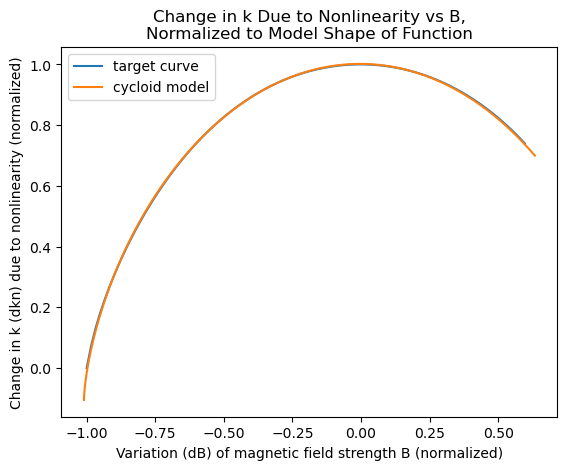

In [160]:
# for easy changing which two plots to use.

Ri = [33]

ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B,\nNormalized to Model Shape of Function")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (normalized)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (normalized)")

ax.plot(x_arr, y_arr, label = "target curve")
ax.plot(x_5-0.01, y_5*1.1 -0.105, label = "cycloid model") # parameters here are adjusted, because a normal cycloid with the cusps at zero didn't work. 

plt.legend()

plt.show()

Well, many of the parameters were chosen by hand, but it does fit the shape. The cusps are not at the same place as for a cycloid, instead starting further up in the curve, and not fully going to zero. So it is not quite a cycloid like I thought. 

# $dMn$ vs $B$

So, we have so far found the shapes of both $dkn$ oscillations. Now we need to examine the same two oscillations in $dMn$.

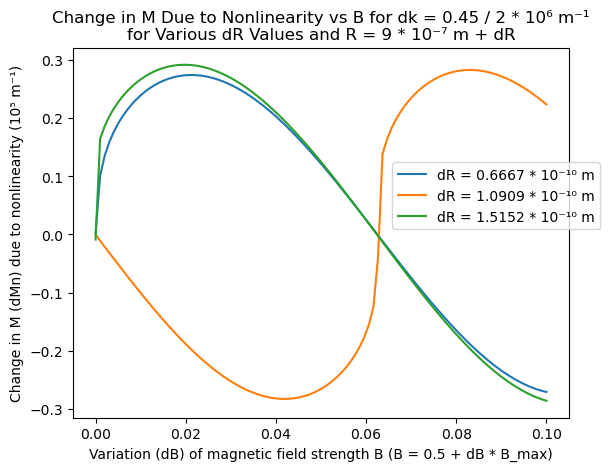

In [169]:
# Select which R values we want. 
# Let us start with the peaks and nodes, like before
Ri = [33, 54, 75]
ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = 0.5 + dB * B_max)")

for i in range(ilim):
    ax.plot(B, dMn_arr[Ri[i],:]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")

plt.legend(loc='center left', bbox_to_anchor=(0.63, 0.6))

plt.show()

We have a skewed sine here, as noted before. In these graphs, there is a discontinuity when the oscillation begins. The point which goes through our axis in the center of our oscillation is a straight line.

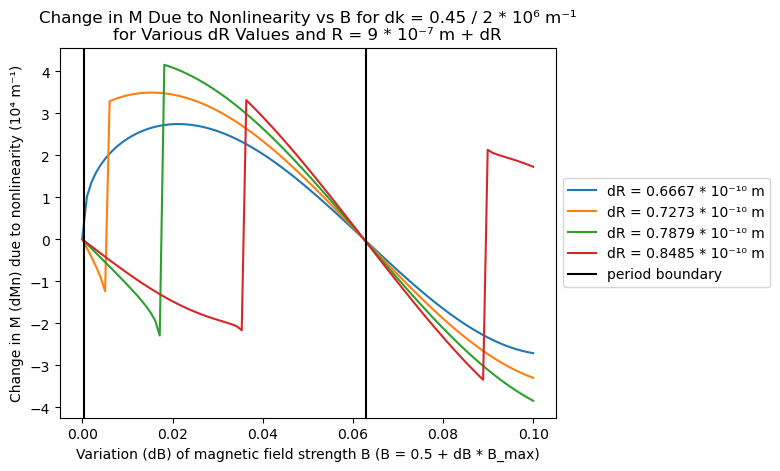

In [186]:
Ri = [33, 36, 39, 42]

ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = 0.5 + dB * B_max)")

for i in range(ilim):
    ax.plot(B, dMn_arr[Ri[i],:]/10000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")
plt.axline((find_dB_B_osc(4),-0.5), (find_dB_B_osc(4),-0.6), color='k', label = "period boundary")
plt.axline((find_dB_B_osc(4.5),-0.5), (find_dB_B_osc(4.5),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

The discontinuity is building to the phase-shifted pattern. Both patterns are rotating, and the cutoff is moving towards the central point of the old oscillation, evenly from both directions.

In [177]:
# Find the index of a quarter period
find_dR_k_osc(1.25)*100/2

43.64583333333333

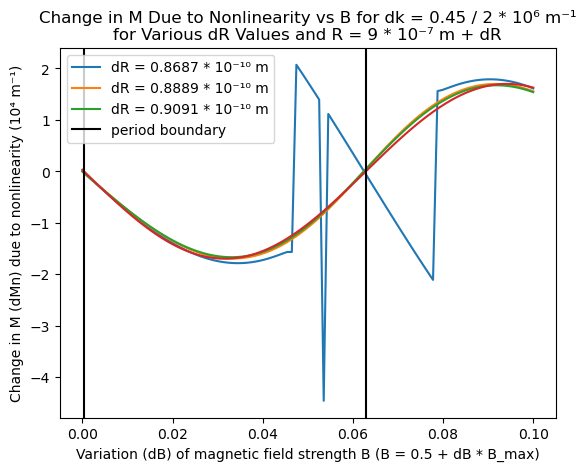

In [188]:
Ri = [43, 44, 45]

ilim = len(Ri)

y = -np.sin(2* pi * (B-find_dB_B_osc(4))/ (find_dB_B_osc(5)-find_dB_B_osc(4)))*1.7

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = 0.5 + dB * B_max)")

for i in range(ilim):
    ax.plot(B, dMn_arr[Ri[i],:]/10000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")
ax.plot(B, y)
plt.axline((find_dB_B_osc(4),-0.5), (find_dB_B_osc(4),-0.6), color='k', label ="period boundary")
plt.axline((find_dB_B_osc(4.5),-0.5), (find_dB_B_osc(4.5),-0.6), color='k')

plt.legend()#loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

At our quarter period, we loose the entirety of our old oscillations, and settle into the new oscillations. The red sine curve here shows that we still have a skew in our pattern. 

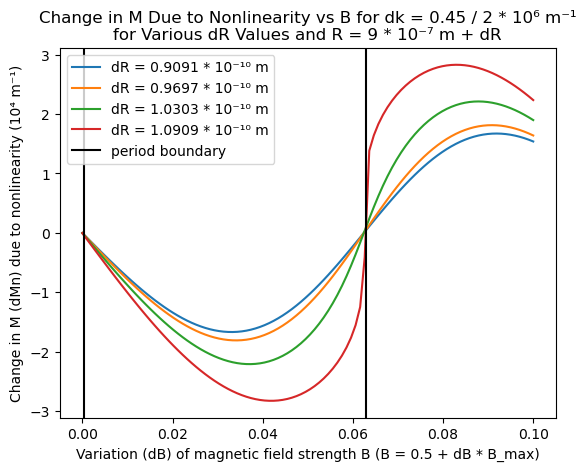

In [190]:
Ri = [45, 48, 51, 54]

ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = 0.5 + dB * B_max)")

for i in range(ilim):
    ax.plot(B, dMn_arr[Ri[i],:]/10000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")
    
plt.axline((find_dB_B_osc(4),-0.5), (find_dB_B_osc(4),-0.6), color='k', label = "period boundary")
plt.axline((find_dB_B_osc(4.5),-0.5), (find_dB_B_osc(4.5),-0.6), color='k')

plt.legend()#loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

Here there is only one skewed sine curve from the quarter period to the half period of our oscillation, when the discontinuity appears again.

In [191]:
# Find the index of three quarters period
find_dR_k_osc(1.75)*100/2

64.47916666666666

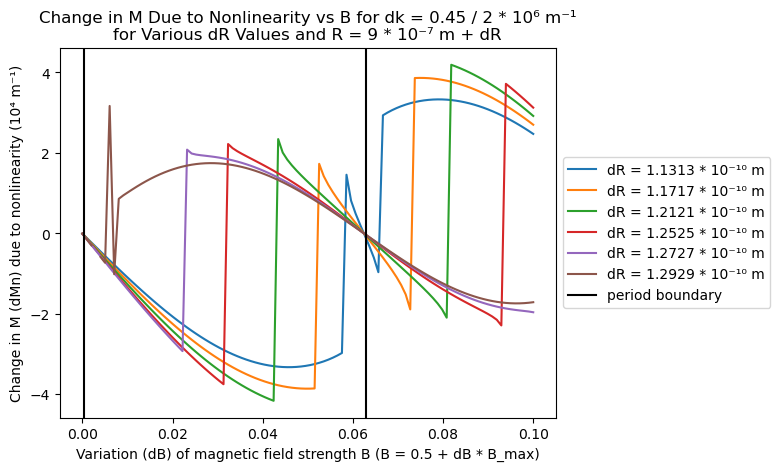

In [192]:
Ri = [56, 58, 60, 62, 63, 64]

ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = 0.5 + dB * B_max)")

for i in range(ilim):
    ax.plot(B, dMn_arr[Ri[i],:]/10000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")

plt.axline((find_dB_B_osc(4),-0.5), (find_dB_B_osc(4),-0.6), color='k', label = "period boundary")
plt.axline((find_dB_B_osc(4.5),-0.5), (find_dB_B_osc(4.5),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

The error appears around our phase shift, but the pattern appears to disappear around our 3/4 period.

# $dMn$ vs $R$

The final pattern is for the fast oscillations of the change of slow oscillation wave number. We know that our $B$ nodes are at indexes 0 and 62.

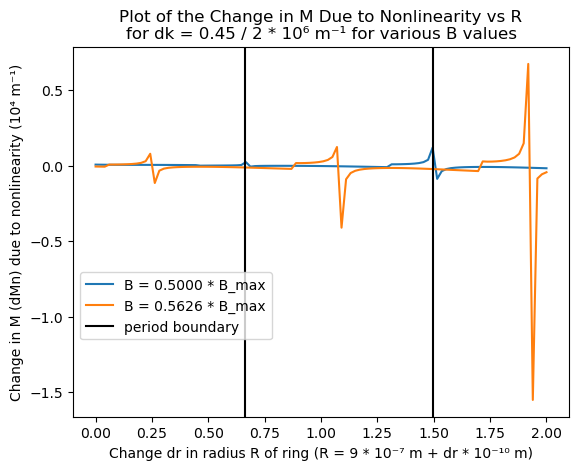

In [ ]:
# Again, choose the indexes beforehand.

Bi = [0,62]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in M Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for various B values")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dMn_arr[:, Bi[i]]/10000, label = f"B = {B0+B[Bi[i]]:.4f} * B_max")

plt.axline((find_dR_k_osc(1),0), (find_dR_k_osc(1),-0.01), color='k', label = "period boundary")
plt.axline((find_dR_k_osc(2),0), (find_dR_k_osc(2),-0.01), color='k')

plt.legend(loc='center left', bbox_to_anchor=(0, 0.3))

plt.show()

On our actual node, $dMn$ appears to be zero everywhere. As we move away from this, spikes appear at the boundaries of our oscillation. Our indexes of note are:

In [103]:
print( find_dB_B_osc(4.25)/B[-1]*100, find_dB_B_osc(4.5)/B[-1]*100, find_dB_B_osc(4.75)/B[-1]*100)

31.6234944196735 62.89546467965435 94.16743493963511


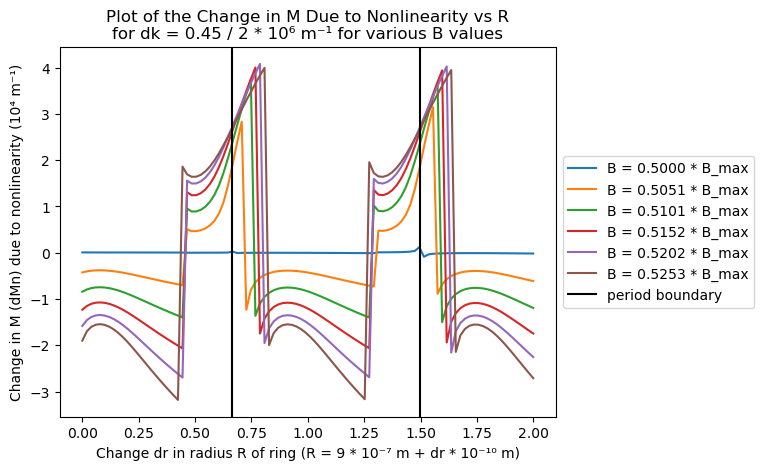

In [196]:
Bi = [0, 5, 10, 15,  20, 25]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in M Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for various B values")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dMn_arr[:, Bi[i]]/10000, label = f"B = {B0+B[Bi[i]]:.4f} * B_max")

plt.axline((find_dR_k_osc(1),0), (find_dR_k_osc(1),-0.01), color='k', label = "period boundary")
plt.axline((find_dR_k_osc(2),0), (find_dR_k_osc(2),-0.01), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

Ok. That is a weird pattern. It rises up quickly and tilts towards the axis slowly. There is a reflected pattern on the negative axis. That one has its long curve rotating away from the axis, so that the pattern will reverse which one is tall and which one is long. 

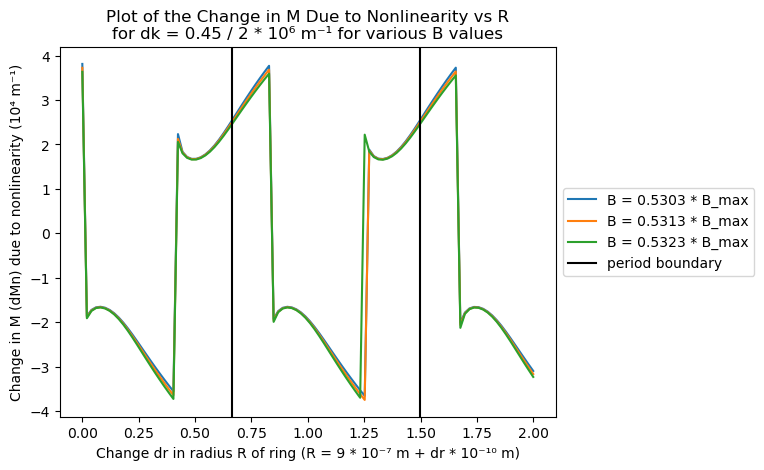

In [197]:
Bi = [30,31, 32]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in M Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for various B values")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dMn_arr[:, Bi[i]]/10000, label = f"B = {B0+B[Bi[i]]:.4f} * B_max")

plt.axline((find_dR_k_osc(1),0), (find_dR_k_osc(1),-0.01), color='k', label = "period boundary")
plt.axline((find_dR_k_osc(2),0), (find_dR_k_osc(2),-0.01), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

I think the angle is now 45 degrees. 

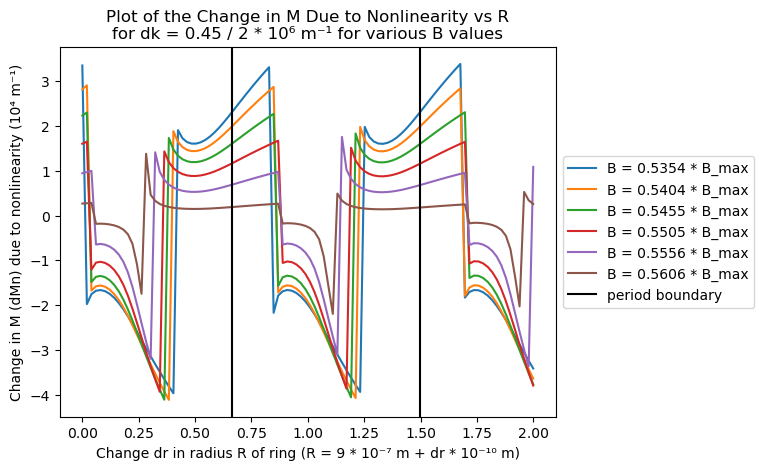

In [198]:
# for easy changing which two plots to use.

Bi = [35, 40, 45, 50, 55, 60]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in M Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for various B values")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dMn_arr[:, Bi[i]]/10000, label = f"B = {B0+B[Bi[i]]:.4f} * B_max")

plt.axline((find_dR_k_osc(1),0), (find_dR_k_osc(1),-0.01), color='k', label = "period boundary")
plt.axline((find_dR_k_osc(2),0), (find_dR_k_osc(2),-0.01), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

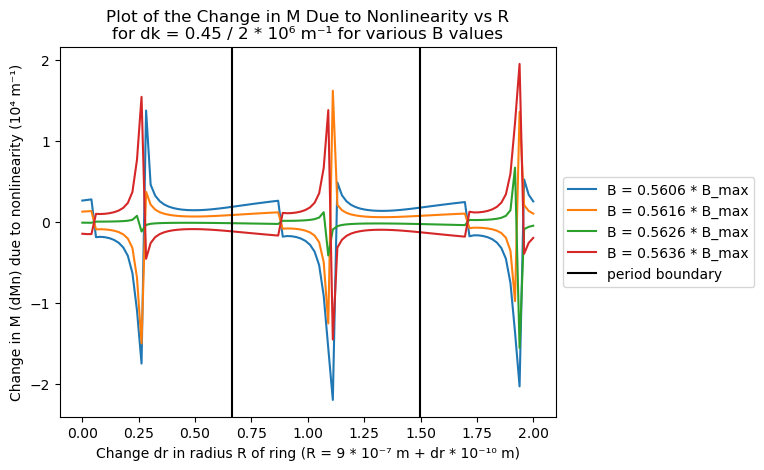

In [199]:
# for easy changing which two plots to use.

Bi = [60, 61, 62, 63]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in M Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for various B values")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dMn_arr[:, Bi[i]]/10000, label = f"B = {B0+B[Bi[i]]:.4f} * B_max")

plt.axline((find_dR_k_osc(1),0), (find_dR_k_osc(1),-0.01), color='k', label = "period boundary")
plt.axline((find_dR_k_osc(2),0), (find_dR_k_osc(2),-0.01), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

After it crosses the $R$ axis, it starts again, but mirrored across the axis. The red and blue curves here are the mirrored curves.

# Full $B$ Range

Now lets check for $B$ dependence on the shape of these oscillations. This data is stored in table 3.

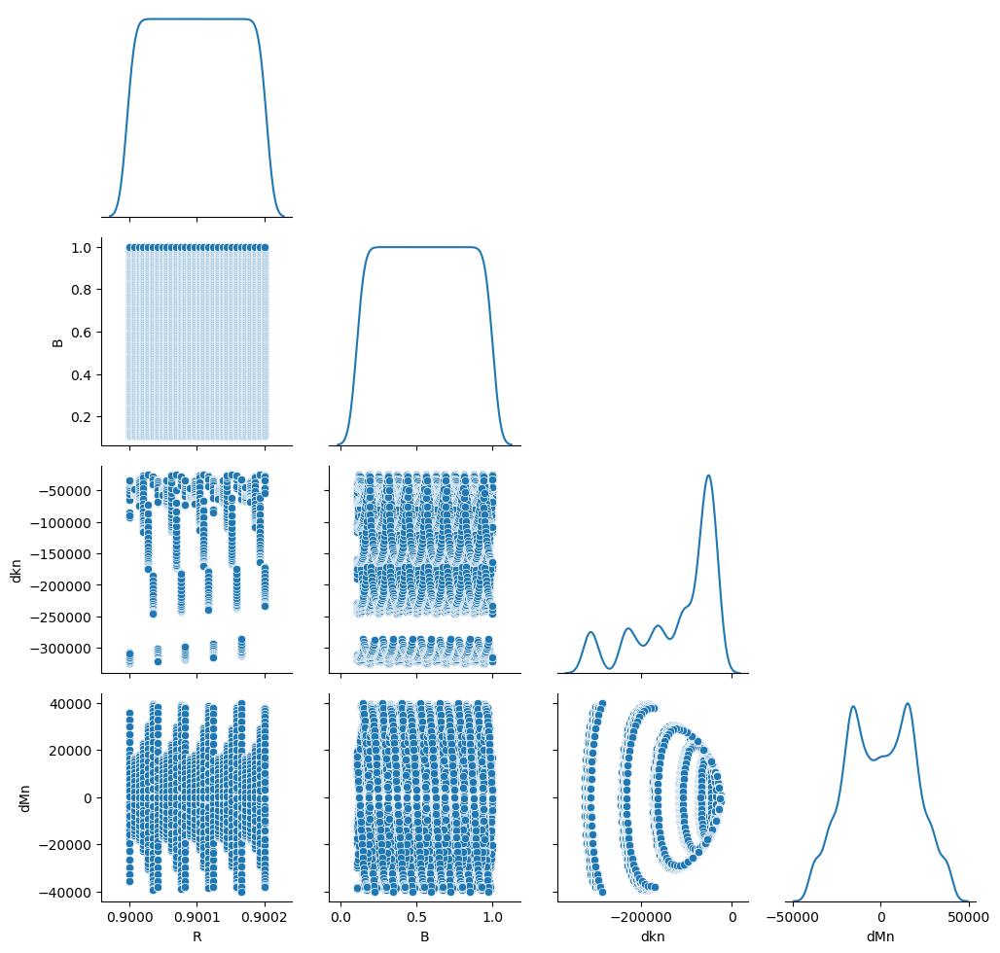

In [200]:
g = sns.PairGrid(tbl_red[3], diag_sharey=False, corner=True)

g.map_diag(sns.kdeplot)
g.map_lower(sns.scatterplot)

The periodic nature of our dataset is obvious from this plot.

In [201]:
gind = 3

In [202]:
del dkn_arr, dMn_arr

dkn_arr = np.zeros((gs_r2, gs_b2))
dMn_arr = np.zeros((gs_r2, gs_b2))

for r, rr in enumerate(R_g[gind]):
    for b, bb in enumerate(B_g[gind]):
        tbl_sel = tbl_red[gind][(tbl_red[gind]["R"]==rr) &(tbl_red[gind]["B"]==bb)]
        dkn_arr[r,b] = tbl_sel["dkn"].to_numpy()[0]
        dMn_arr[r,b] = tbl_sel["dMn"].to_numpy()[0]

In [203]:
#B and B will be rescaled to show only the difference from our 
scale_R = 1/10000
R0 = 0.9
#B0 = 0.5
dk = dk_g[gind][0]

R = (R_g[gind] - R0)/scale_R
B = B_g[gind] #- B0

In [204]:
# We will learn here that our oscillations are based on the fractional part of B * R^2 * pi^2
# Here are a few functions for calculating our period boundaries.

def find_count_B_osc(dR, dB):
    R = dR * scale_R  + R0
    B = dB
    count =  B * R**2 * pi**2
    return count

def find_dB_B_osc(n, dR = 0):
    R = dR * scale_R  + R0
    # n = B * R^2 * pi^2
    dB = n / (R**2 * pi**2)
    return dB

In [205]:
intervalB = (B[-1]-B[0])/300
find_dB_B_osc(1) / intervalB, find_dB_B_osc(2) / intervalB, find_dB_B_osc(3) / intervalB, find_dB_B_osc(4) / intervalB

(42.16445428312018, 84.32890856624036, 126.49336284936051, 168.65781713248072)

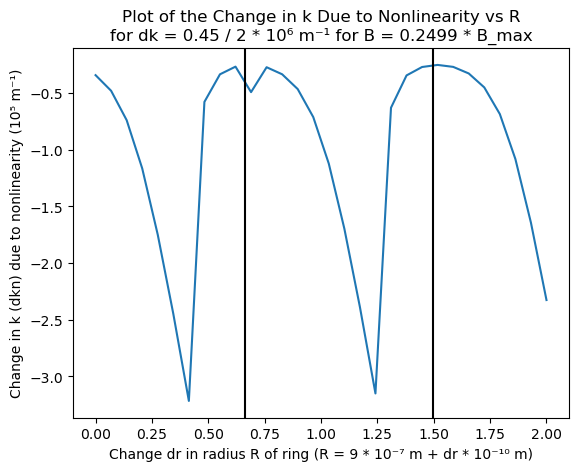

In [207]:
# Again, choose the indicies beforehand.

Bi = [47]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for B = {B[Bi[i]]:.4f} * B_max")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dkn_arr[:, Bi[i]]/100000)
plt.axline((find_dR_k_osc(1),-0.5), (find_dR_k_osc(1),-0.6), color='k')
plt.axline((find_dR_k_osc(2),-0.5), (find_dR_k_osc(2),-0.6), color='k')

plt.show()

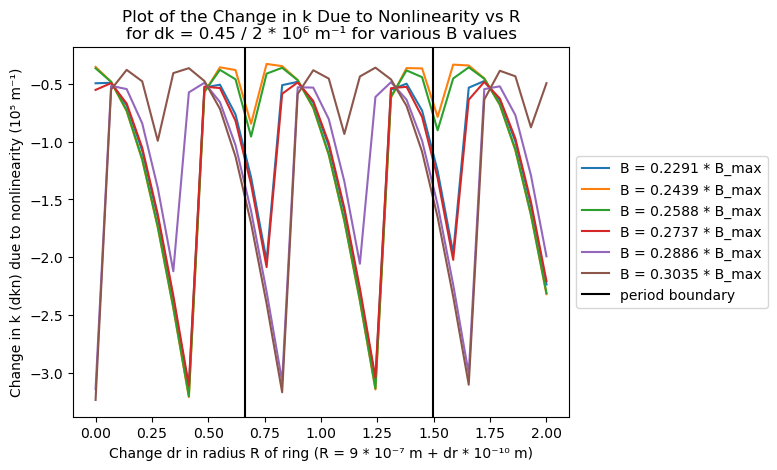

In [ ]:
# Again, choose the indexes beforehand.

Bi = [40, 45, 50, 55, 60, 65]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for various B values")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dkn_arr[:, Bi[i]]/100000, label = f"B = {B[Bi[i]]:.4f} * B_max")

plt.axline((find_dR_k_osc(1),-0.5), (find_dR_k_osc(1),-0.6), color='k', label = "period boundary")
plt.axline((find_dR_k_osc(2),-0.5), (find_dR_k_osc(2),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

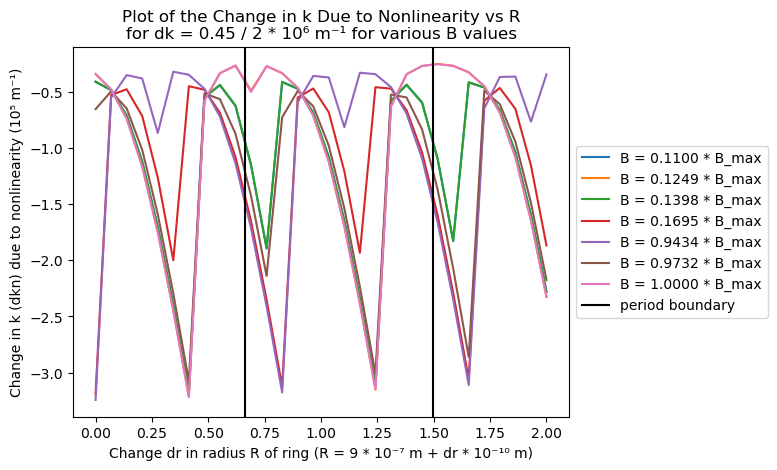

In [ ]:
# Again, choose the indexes beforehand.

Bi = [0, 5, 10, 20, 280, 290, 299]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for various B values")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dkn_arr[:, Bi[i]]/100000, label = f"B = {B[Bi[i]]:.4f} * B_max")

plt.axline((find_dR_k_osc(1),-0.5), (find_dR_k_osc(1),-0.6), color='k', label = "period boundary")
plt.axline((find_dR_k_osc(2),-0.5), (find_dR_k_osc(2),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

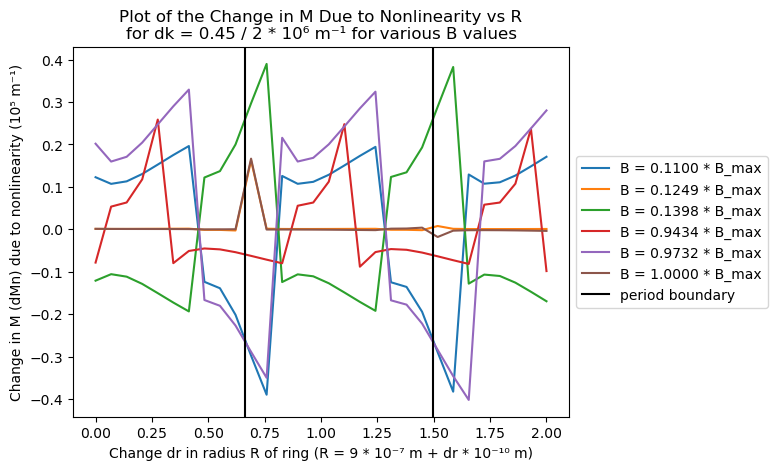

In [ ]:
# Again, choose the indexes beforehand.

Bi = [0, 5, 10, 280, 290, 299]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in M Due to Nonlinearity vs R\nfor dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for various B values")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dMn_arr[:, Bi[i]]/100000, label = f"B = {B[Bi[i]]:.4f} * B_max")

plt.axline((find_dR_k_osc(1),0), (find_dR_k_osc(1),-0.01), color='k', label = "period boundary")
plt.axline((find_dR_k_osc(2),0), (find_dR_k_osc(2),-0.01), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

No obvious change between indexes at the start and indexes at the end.

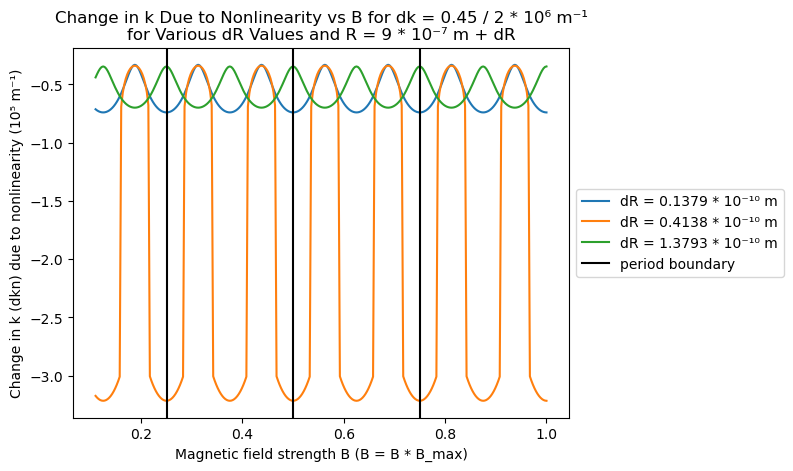

In [212]:
Ri = [ 2, 6, 20]

ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Magnetic field strength B (B = B * B_max)")

for i in range(ilim):
    ax.plot(B, dkn_arr[Ri[i],:]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")
    
plt.axline((find_dB_B_osc(2),-0.5), (find_dB_B_osc(2),-0.6), color='k', label = "period boundary")    
plt.axline((find_dB_B_osc(4),-0.5), (find_dB_B_osc(4),-0.6), color='k')
plt.axline((find_dB_B_osc(6),-0.5), (find_dB_B_osc(6),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

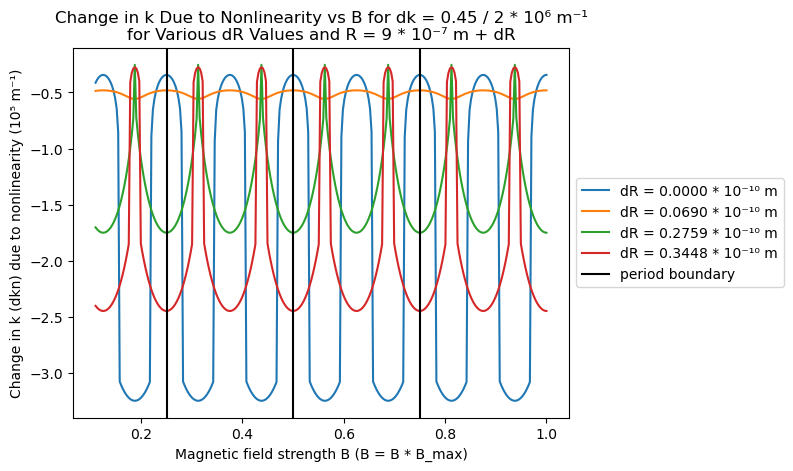

In [213]:
Ri = [0,1,4,5]

ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Magnetic field strength B (B = B * B_max)")

for i in range(ilim):
    ax.plot(B, dkn_arr[Ri[i],:]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")

plt.axline((find_dB_B_osc(2),-0.5), (find_dB_B_osc(2),-0.6), color='k', label = "period boundary")    
plt.axline((find_dB_B_osc(4),-0.5), (find_dB_B_osc(4),-0.6), color='k')
plt.axline((find_dB_B_osc(6),-0.5), (find_dB_B_osc(6),-0.6), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

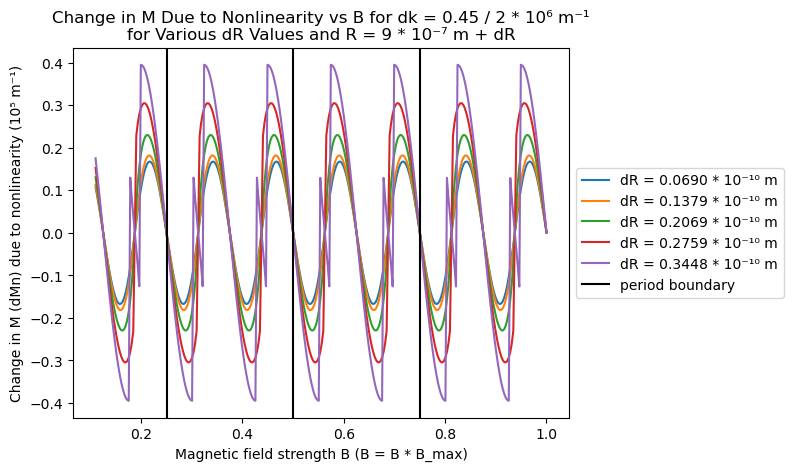

In [214]:
Ri = [ 1, 2, 3, 4, 5]

ilim = len(Ri)

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Magnetic field strength B (B = B * B_max)")

for i in range(ilim):
    ax.plot(B, dMn_arr[Ri[i],:]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")

plt.axline((find_dB_B_osc(2),0), (find_dB_B_osc(2),-0.01), color='k', label = "period boundary")    
plt.axline((find_dB_B_osc(4),0), (find_dB_B_osc(4),-0.01), color='k')
plt.axline((find_dB_B_osc(6),0), (find_dB_B_osc(6),-0.01), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

The pattern still appears as expected. The periodicity of the slow oscillations matches the $B\pi^2R^2 = B\pi^2R^2 + n$ for integers $n$ pattern as before. 

In [215]:
# Here is one point on which to start the period.
B[89], find_dB_B_osc(3)

(0.3749163879598662, 0.3752636431197695)

Now for a single oscillation in the $B$ direction.

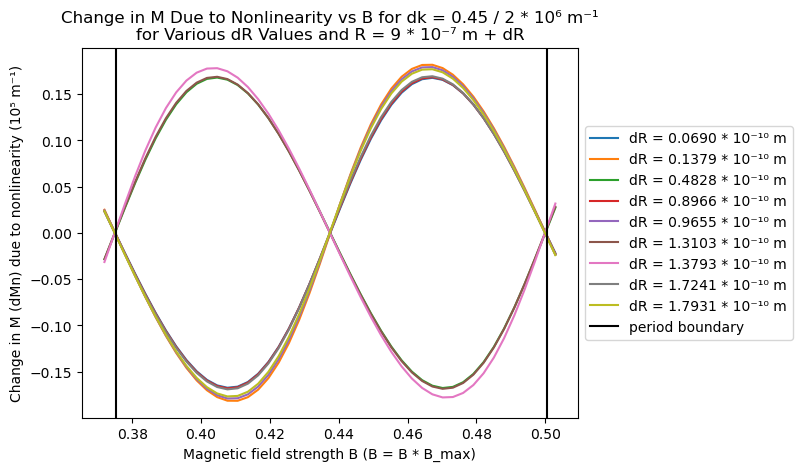

In [216]:
Ri = [1, 2, 7, 13, 14, 19, 20, 25, 26]

ilim = len(Ri)
bmn = 88
bmx = bmn + 45

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Magnetic field strength B (B = B * B_max)")

for i in range(ilim):
    ax.plot(B[bmn:bmx], dMn_arr[Ri[i],bmn:bmx]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")

plt.axline((find_dB_B_osc(4),0), (find_dB_B_osc(4),-0.01), color='k', label = "period boundary")
plt.axline((find_dB_B_osc(3),0), (find_dB_B_osc(3),-0.01), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

And the same for $dkn$.

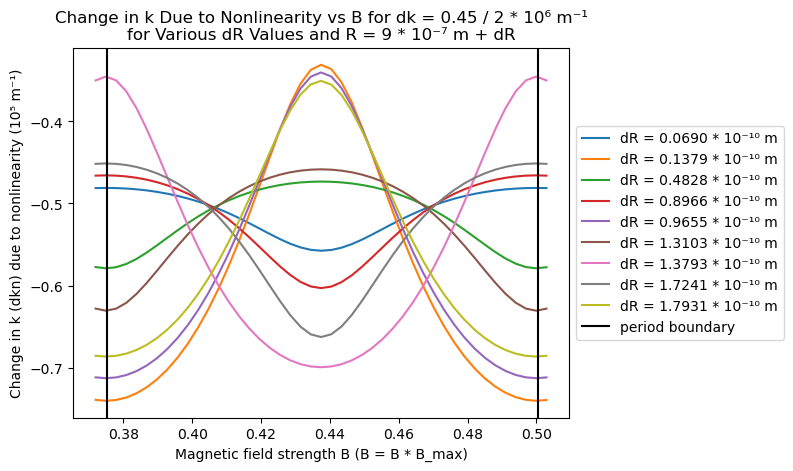

In [217]:
Ri = [1, 2, 7, 13, 14, 19, 20, 25, 26]
#Ri = [ 19, 26]


ilim = len(Ri)
bmn = 88
bmx = bmn + 45

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Magnetic field strength B (B = B * B_max)")

for i in range(ilim):
    ax.plot(B[bmn:bmx], dkn_arr[Ri[i],bmn:bmx]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")

plt.axline((find_dB_B_osc(4),-.4), (find_dB_B_osc(4),-0.401), color='k', label = "period boundary")
plt.axline((find_dB_B_osc(3),-.4), (find_dB_B_osc(3),-0.401), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

Our period guess appears correct. Now to draw the expected nodes of the graphs. 

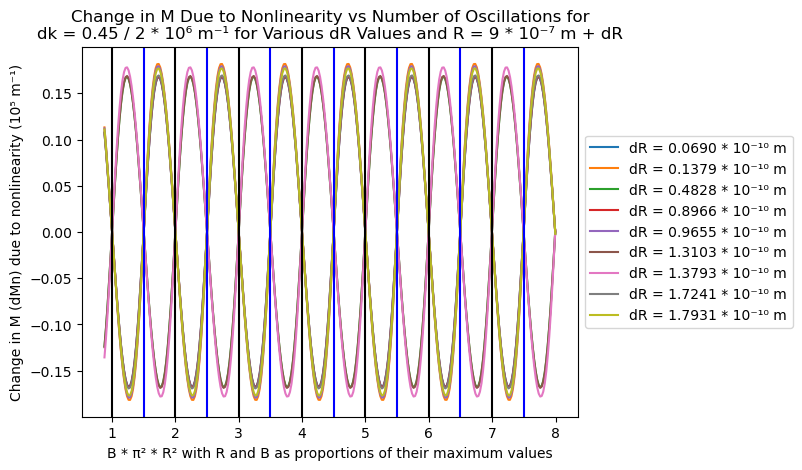

In [224]:
Ri = [1, 2, 7, 13, 14, 19, 20, 25, 26]

ilim = len(Ri)
bmn = 88
bmx = bmn + 45

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs Number of Oscillations for\ndk = 0.45 / 2 * 10\u2076 m\u207b\u00b9 for Various dR Values and R = 9 * 10\u207b\u2077 m + dR")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("B * π\u00b2 * R\u00b2 with R and B as proportions of their maximum values")

for i in range(ilim):
    ax.plot(B*(R[Ri[i]]*scale_R +R0)**2*pi**2, dMn_arr[Ri[i],:]/100000, label = f"dR = {R[Ri[i]]:.4f} * 10\u207b\u00b9\u2070 m")

for i in range(1,8):
    plt.axline((i,0), (i,-0.01), color='k')
    plt.axline((i+.5,0), (i+.5,-0.01), color='blue')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

Here I am plotting the various $dkn$ vs $R$ graphs for B values separated by one period on top of each other. A difference between periods should be obvious by having the lower graphics be visible under the upper graphic.

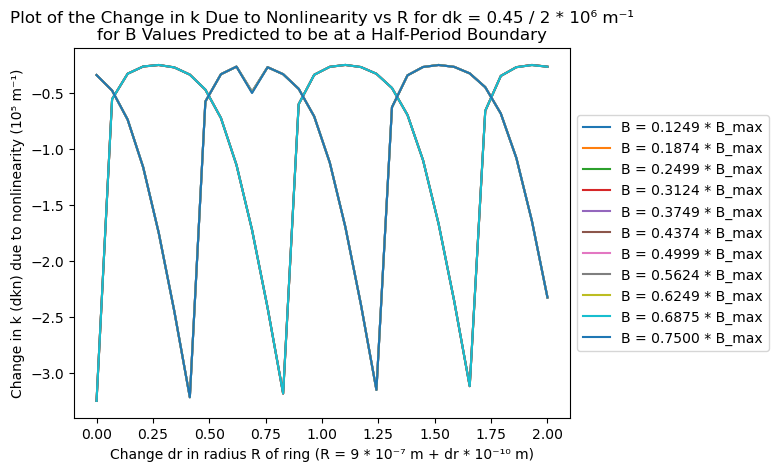

In [227]:
bmn = 85
Bi = [4+bmn-84,4+bmn-63,4+bmn-42,4+bmn-21,4+bmn, 25+bmn, 46+bmn, 67+bmn, 67+bmn+21, 67+bmn+42, 67+bmn+63]#, 99+bmn, 120+bmn]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs R for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor B Values Predicted to be at a Half-Period Boundary")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dkn_arr[:, Bi[i]]/100000, label = f"B = {B[Bi[i]]:.4f} * B_max")

#plt.axline((R[1],-0.5), (R[1],-0.51), color='k')
#plt.axline((R[25],-0.5), (R[25],-0.51), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

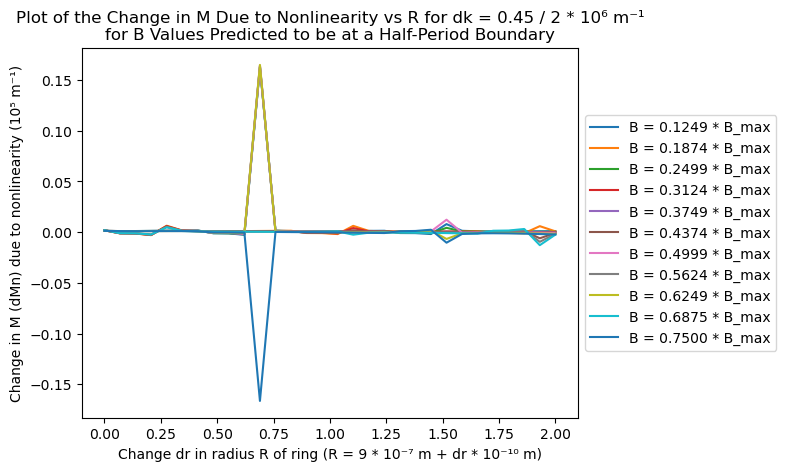

In [228]:
Bi = [4+bmn-84,4+bmn-63,4+bmn-42,4+bmn-21,4+bmn, 25+bmn, 46+bmn, 67+bmn, 67+bmn+21, 67+bmn+42, 67+bmn+63]#, 99+bmn, 120+bmn]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in M Due to Nonlinearity vs R for dk = 0.45 / 2 * 10\u2076 m\u207b\u00b9\nfor B Values Predicted to be at a Half-Period Boundary")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dMn_arr[:, Bi[i]]/100000, label = f"B = {B[Bi[i]]:.4f} * B_max")

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

The data here is clearly periodic in $B$, with the same pattern as before. 

# $\mu$ Dependence for Fast Oscillations

In [127]:
tbl_red[1]

,dk,mu,dkn,dMn
0,0.0,3.162278e-09,-7969.899509,13.457522
1,0.0,3.236689e-09,-21241.450718,14.759672
2,0.0,3.312852e-09,-21655.040102,15.081138
3,0.0,3.390807e-09,-22075.471048,15.409241
4,0.0,3.470596e-09,-22502.823629,15.744108
...,...,...,...,...
9995,3.0,2.881350e-08,-102227.695108,100.520093
9996,3.0,2.949151e-08,-103715.570360,102.482218
9997,3.0,3.018547e-08,-105221.666897,104.480650
9998,3.0,3.089577e-08,-106746.223455,106.516039


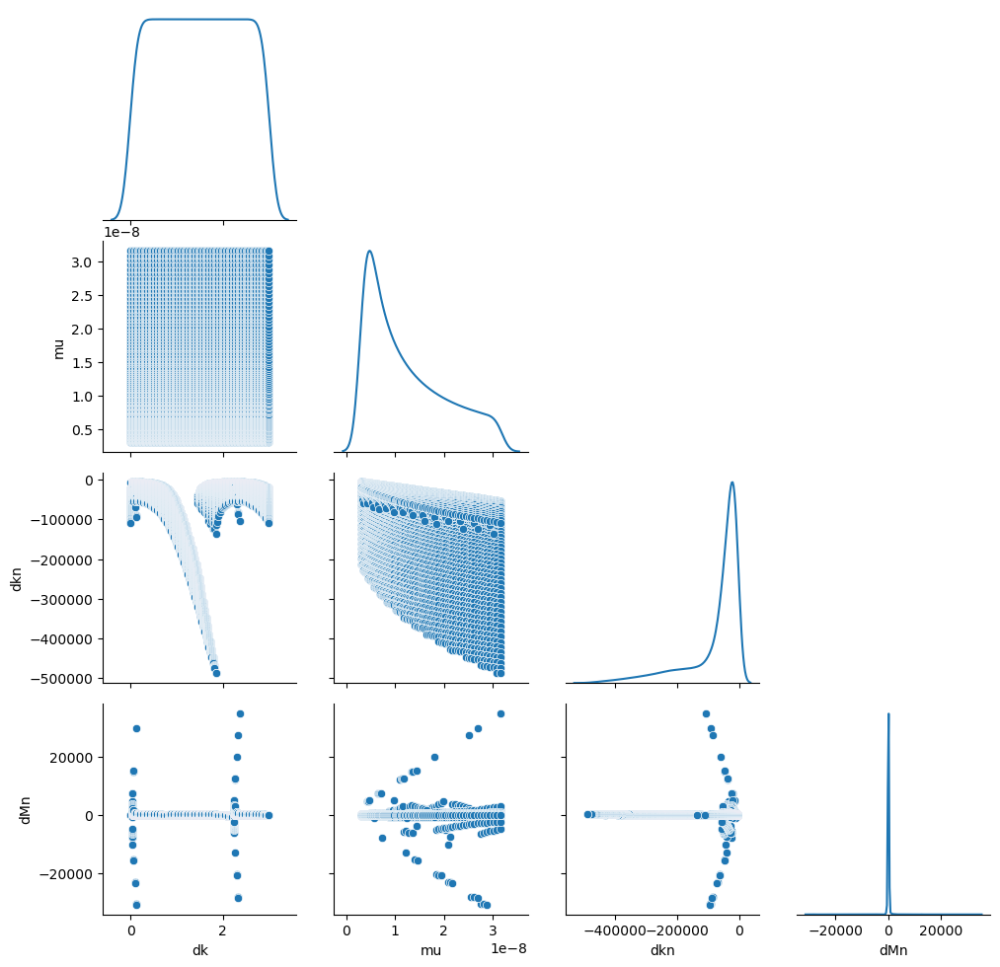

In [229]:
g = sns.PairGrid(tbl_red[1], diag_sharey=False, corner=True)

g.map_diag(sns.kdeplot)
g.map_lower(sns.scatterplot)

In [230]:
gind = 1

In [231]:
dkn_arr = np.zeros((grid_size, grid_size))
dMn_arr = np.zeros((grid_size, grid_size))

for r, rr in enumerate(dk_g[gind]):
    for b, bb in enumerate(mu_g[gind]):
        tbl_sel = tbl_red[gind][(tbl_red[gind]["dk"]==rr) &(tbl_red[gind]["mu"]==bb)]
        dkn_arr[r,b] = tbl_sel["dkn"].to_numpy()[0]
        dMn_arr[r,b] = tbl_sel["dMn"].to_numpy()[0]

In [232]:
dk = dk_g[1]
mu = mu_g[1]

This dataset only contains the $\mu$ dependence for the change in $k$ from the linear case with respect to the small-scale oscillations. So lets see what this dependence looks like. We can visualize this data either with stacked plots of $dkn$ vs $\mu$ or stacked plots of $dkn$ vs $dk$. 

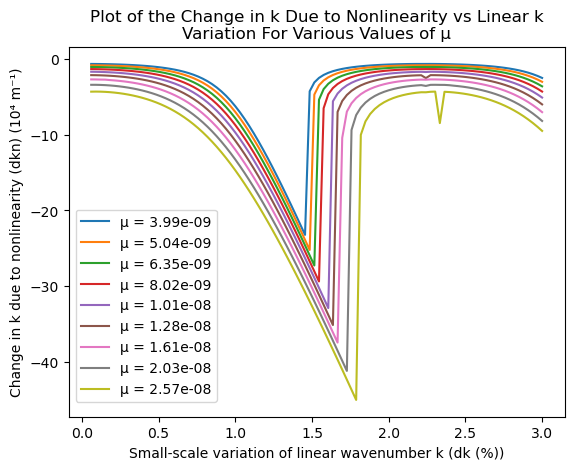

In [ ]:
# Here is the plot of dkn vs dk
# Note that dkn (difference between nonlinear and linear fast oscillation wave number) 
# here is actually dkn / 10^4 and dk (difference in linear fast oscillation wave number 
# from the wave number which produces a whole number of fast cycles in the linear case)
# is 2 * dk * R_max.

jj = [10, 20, 30, 40, 50, 60, 70, 80, 90]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs Linear k\nVariation For Various Values of \u03BC")
ax.set_ylabel('Change in k due to nonlinearity (dkn) (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

for i in range(ilim):
    ax.plot(dk[2:], dkn_arr[2:, jj[i]]/10000, label = f'\u03BC = {mu[jj[i]]:.2e}')

plt.legend(loc='center left', bbox_to_anchor=(0, 0.3))

plt.show()

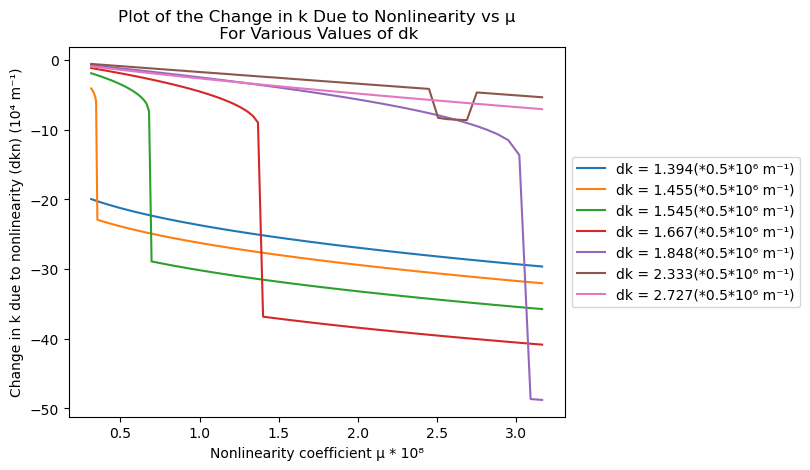

In [239]:
# Now for plots of dkn / 10^4 vs mu * 10 ^8 
# I have split this up into 4 graphs, as something interesting happens.

jj = [46, 48, 51, 55, 61, 77, 90]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs \u03BC\n For Various Values of dk")
ax.set_ylabel('Change in k due to nonlinearity (dkn) (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Nonlinearity coefficient \u03BC * 10\u2078")

for i in range(ilim):
    ax.plot(mu*1e8, dkn_arr[jj[i],:]/10000, label = f"dk = {dk[jj[i]]:.3f}(*0.5*10\u2076 m\u207b\u00b9)")

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

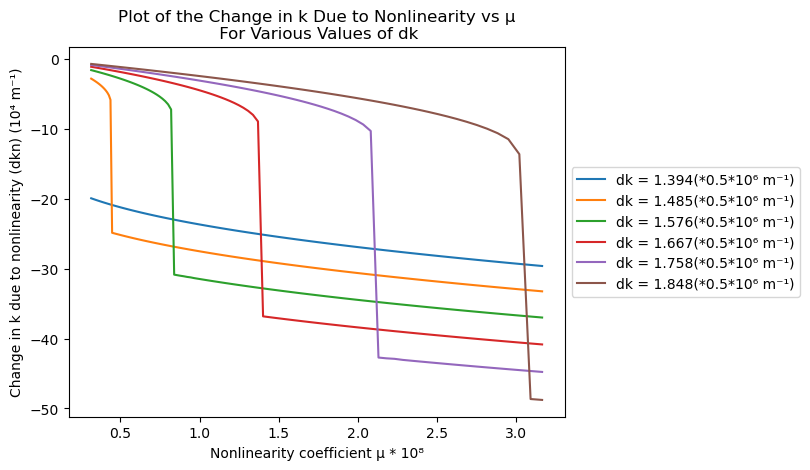

In [240]:
# More plots of dkn / 10^4 vs mu * 10 ^8 

jj = [46, 49, 52, 55, 58, 61]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs \u03BC\n For Various Values of dk")
ax.set_ylabel('Change in k due to nonlinearity (dkn) (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Nonlinearity coefficient \u03BC * 10\u2078")

for i in range(ilim):
    ax.plot(mu*1e8, dkn_arr[jj[i],:]/10000, label = f"dk = {dk[jj[i]]:.3f}(*0.5*10\u2076 m\u207b\u00b9)")

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

In [241]:
print(f"Our jump (or drop) first appears at dk = {dk[48]}")

Our jump (or drop) first appears at dk = 1.4545454545454546


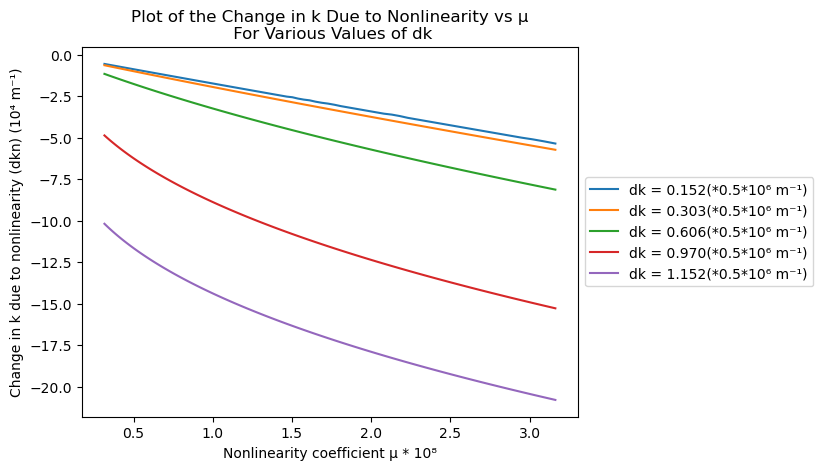

In [242]:
# These are for earlier dk values, where there is no drop.

jj = [5, 10, 20, 32, 38]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs \u03BC\n For Various Values of dk")
ax.set_ylabel('Change in k due to nonlinearity (dkn) (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Nonlinearity coefficient \u03BC * 10\u2078")

for i in range(ilim):
    ax.plot(mu*1e8, dkn_arr[jj[i],:]/10000, label = f"dk = {dk[jj[i]]:.3f}(*0.5*10\u2076 m\u207b\u00b9)")

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

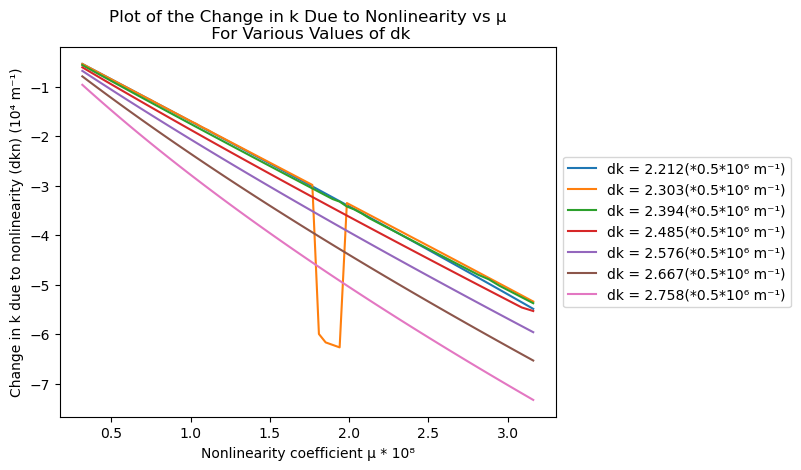

In [243]:
# These occur for large dk numbers, where the drop in signal has already occured.

jj = [73, 76, 79, 82, 85, 88, 91]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Plot of the Change in k Due to Nonlinearity vs \u03BC\n For Various Values of dk")
ax.set_ylabel('Change in k due to nonlinearity (dkn) (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Nonlinearity coefficient \u03BC * 10\u2078")

for i in range(ilim):
    ax.plot(mu*1e8, dkn_arr[jj[i],:]/1e4, label = f"dk = {dk[jj[i]]:.3f}(*0.5*10\u2076 m\u207b\u00b9)")

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

As dk increases from 0 to 1, the whole graph increases with dk. Around k = 1.45, a drop appears for lower $\mu$ values. This means that $\mu$ causes a phase shift as well as an amplification. To remove the effects of $dk$, I can grab the value with the large drop as my $\mu$ value. Lets try to get the maximum $dkn$ and minimum $dkn$ for every value of $\mu$.

In [245]:
max_for_mu = -np.max(dkn_arr, axis=0)/1e5
min_for_mu = -np.min(dkn_arr, axis=0)/1e5

I have added in a rescaling of $dkn$ of $10^{-5}$ to remove the zeros from the end. I need to not forget about this rescaling later.

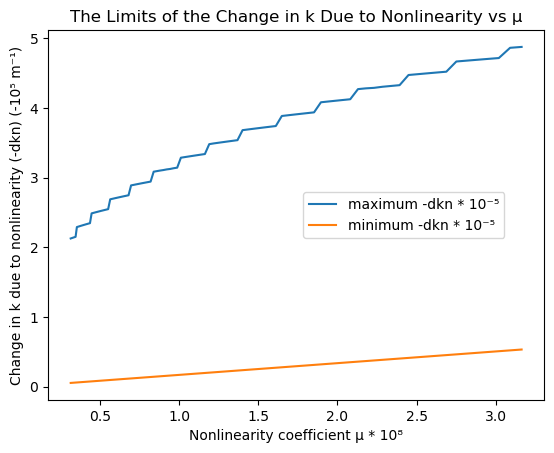

In [252]:
# Now we plot the greatest and least values of - dkn / 10^5 vs mu * 10^8 for all values of k

fig, ax = plt.subplots()
plt.title(f"The Limits of the Change in k Due to Nonlinearity vs \u03BC")
ax.set_ylabel('Change in k due to nonlinearity (-dkn) (-10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Nonlinearity coefficient \u03BC * 10\u2078")

ax.plot(mu*1e8, min_for_mu, label="maximum -dkn * 10\u207b\u2075")
ax.plot(mu*1e8, max_for_mu, label="minimum -dkn * 10\u207b\u2075")

plt.legend(loc='center left', bbox_to_anchor=(0.5, 0.5))

plt.show()

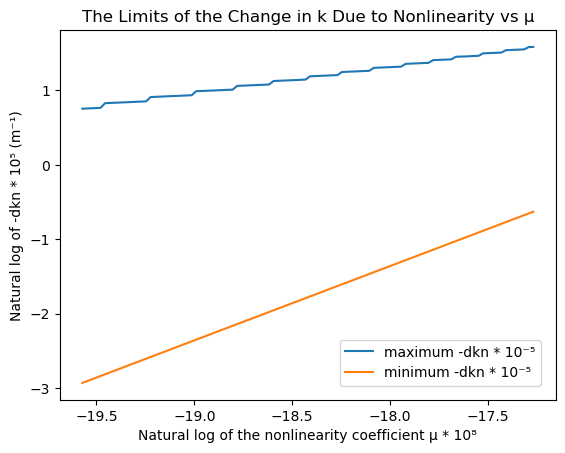

In [259]:
# Again, but with logrithmic scaling, which makes power law scaling appear as a straight line.
# This is ln(- dkn/10^5) vs ln(mu)

fig, ax = plt.subplots()
plt.title(f"The Limits of the Change in k Due to Nonlinearity vs \u03BC")
ax.set_ylabel('Natural log of -dkn * 10\u2075 (m\u207b\u00b9)')
ax.set_xlabel("Natural log of the nonlinearity coefficient \u03BC * 10\u2078")

ax.plot(np.log(mu), np.log(min_for_mu), label="maximum -dkn * 10\u207b\u2075")
ax.plot(np.log(mu), np.log(max_for_mu), label="minimum -dkn * 10\u207b\u2075")

plt.legend(loc='center left', bbox_to_anchor=(0.55, 0.1))

plt.show()

Now that I have straight lines, I can try linear regression to find their shape.

In [ ]:
# take the logarithm
x = np.log(mu)
X = np.array([x]).T
y2 = np.log(max_for_mu)
y1 = np.log(min_for_mu)

# fit to a line
reg1 = LinearRegression().fit(X, y1)
reg2 = LinearRegression().fit(X, y2)

# To save our results
slope_min = reg2.coef_
intercept_min = reg2.intercept_
slope_max = reg1.coef_
intercept_max = reg1.intercept_

# and show our results
print("Slope dkn_max:", reg1.coef_[0], ", intercept dkn_max:", reg1.intercept_, ", convergence statistic:", reg1.score(X, y1))
print("Slope dkn_mix:", reg2.coef_[0], ", intercept dkn_min:", reg2.intercept_, ", convergence statistic:", reg2.score(X, y2))

Slope dkn_max: 0.35515532338982736 , intercept dkn_max: 7.7109215640459015 , convergence statistic: 0.9971399441064484
Slope dkn_mix: 0.9987941677455325 , intercept dkn_min: 16.619171811728208 , convergence statistic: 0.9999999229745502


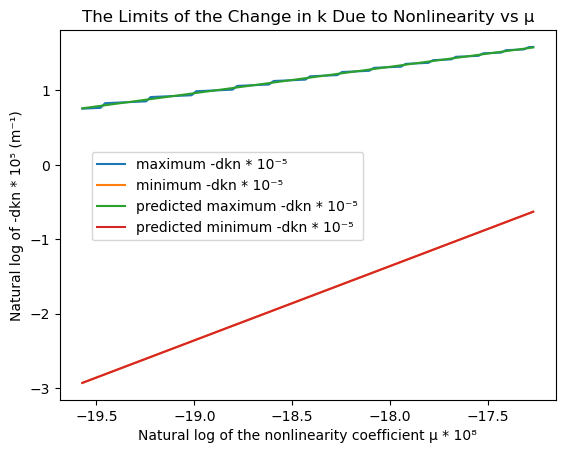

In [ ]:
# Plot the results

line1 = slope_max* np.log(mu) + intercept_max
line2 = slope_min* np.log(mu) + intercept_min

fig, ax = plt.subplots()
plt.title(f"The Limits of the Change in k Due to Nonlinearity vs \u03BC")
ax.set_ylabel('Natural log of -dkn * 10\u2075 (m\u207b\u00b9)')
ax.set_xlabel("Natural log of the nonlinearity coefficient \u03BC * 10\u2078")

ax.plot(np.log(mu), np.log(min_for_mu), label="maximum -dkn * 10\u207b\u2075")
ax.plot(np.log(mu), np.log(max_for_mu), label="minimum -dkn * 10\u207b\u2075")
ax.plot(np.log(mu), line1, label="predicted maximum -dkn * 10\u207b\u2075")
ax.plot(np.log(mu), line2, label="predicted minimum -dkn * 10\u207b\u2075")

plt.legend(loc='center left', bbox_to_anchor=(0.05, 0.55))

plt.show()

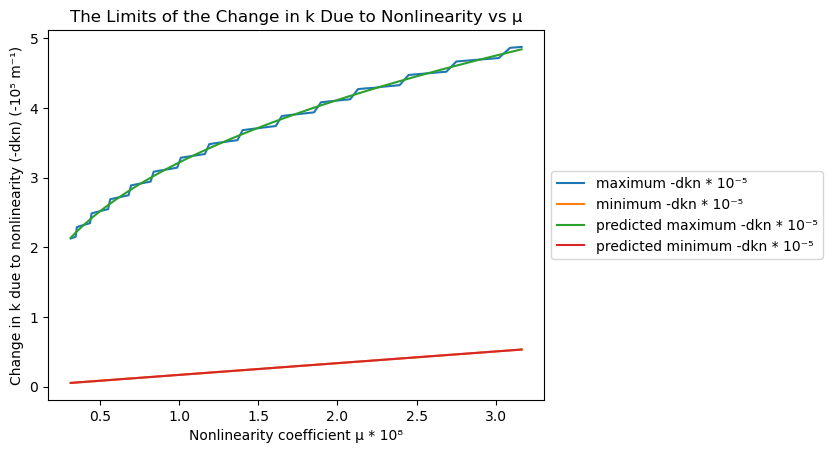

In [266]:
# Take the exponent of my line and fit the results.

line1 = slope_max* np.log(mu) + intercept_max
line2 = slope_min*np.log(mu) + intercept_min

fig, ax = plt.subplots()
plt.title(f"The Limits of the Change in k Due to Nonlinearity vs \u03BC")
ax.set_ylabel('Change in k due to nonlinearity (-dkn) (-10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Nonlinearity coefficient \u03BC * 10\u2078")

ax.plot(mu*1e8, min_for_mu, label="maximum -dkn * 10\u207b\u2075")
ax.plot(mu*1e8, max_for_mu, label="minimum -dkn * 10\u207b\u2075")
ax.plot(mu*1e8, np.exp(line1), label="predicted maximum -dkn * 10\u207b\u2075")
ax.plot(mu*1e8, np.exp(line2), label="predicted minimum -dkn * 10\u207b\u2075")

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

In [267]:
print("Coefficient for dkn_min:", np.exp(intercept_min), ", and dkn_max: ", np.exp(intercept_max))

Coefficient for dkn_min: 16504965.149048917 , and dkn_max:  2232.5987932024873


Our fits for the maximum and minimum values of $-dkn*10^{-5}$ vs $\mu$ are:

\begin{equation}
L_{max} = 2232.6 * \mu^{0.355155}
\end{equation}

\begin{equation}
L_{min} = 16505000 * \mu^{0.99879}
\end{equation}

Recalculated, we have: 

\begin{equation}
dkn_{min}\left(\mu\right) = - 2.2326 \times 10^8 * \mu^{0.355155}
\end{equation}

\begin{equation}
dkn_{max}\left(\mu\right)  = - 1.6505 \times 10^{12} * \mu^{0.99879}
\end{equation}

The relation marked here as $dkn_{max}$ is expected to be more significant, as it corresponds to the amplitude of our skewed squared secant function, and not the shape of it. It is also linear, or at least close to it. The slower than linear growth of $dkn_{min}$ corresponds to a linear growth of the amplitude and a further tilting of the squared secant graph, which produces this fractional power growth. The $dkn$ vs $dk$ graph reproduced below shows the uniform increase in growth with a change in parameters (tilt and shift) for varying $\mu$.

# $dk$ Periodicity Test

The following is a test of the periodicity of my function with respect to $dk$.

In [268]:
# I want to find my starting point for the dk oscillation
np.where(dk > 2/.9)[0]

array([74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90,
       91, 92, 93, 94, 95, 96, 97, 98, 99], dtype=int64)

In [269]:
# create a new object which is the same as my old dk array from the start of the previous cycle at 0
# to the start of the new cycle at dk = 2.222
# Then fill the rest of the array with the values from this first cycle + n * my period.
dk2=np.zeros(962)
dk2[0:74] = dk[0:74]
for i in range(13):
    dk2[74*i:74*(i+1)] = dk[0:74]+dk[74]*i

In [270]:
# Fill the values of dkn at these dk values with with those of dkn from the previous cycle
dkn2 = np.zeros((962,100))
for i in range(13):
    dkn2[74*i:74*(i+1)] = dkn_arr[0:74]

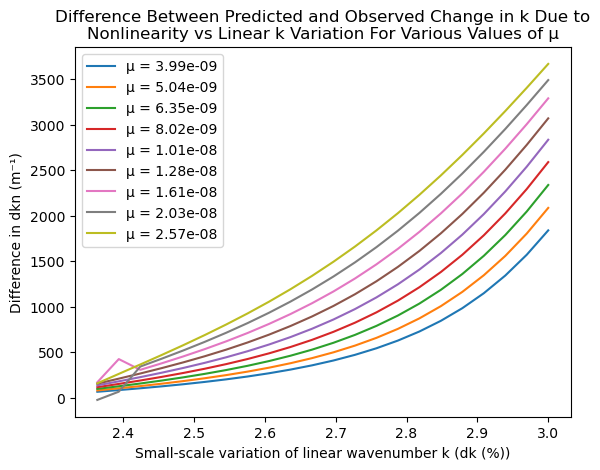

In [ ]:
# And compare to the actual results. 

jj = [10, 20, 30, 40, 50, 60, 70, 80, 90]

ilim = len(jj)

fig, ax = plt.subplots()
plt.title(f"Difference Between Predicted and Observed Change in k Due to\nNonlinearity vs Linear k Variation For Various Values of \u03BC")
ax.set_ylabel('Difference in dkn (m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

for i in range(ilim):
    ax.plot(dk2[78:100], dkn2[78:100, jj[i]]-dkn_arr[78:, jj[i]], label = f'\u03BC = {mu[jj[i]]:.2e}')

plt.legend()

plt.show()

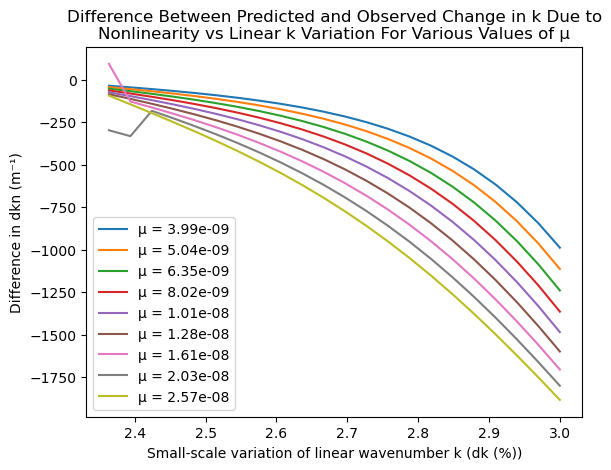

In [ ]:
# Shift the plot by one point, due to the fact that our repetition is not exactly on our grid.

jj = [10, 20, 30, 40, 50, 60, 70, 80, 90]

ilim = len(jj)

#dk = dk_g[4]
#mu = mu_g[4]

fig, ax = plt.subplots()
plt.title(f"Difference Between Predicted and Observed Change in k Due to\nNonlinearity vs Linear k Variation For Various Values of \u03BC")
ax.set_ylabel('Difference in dkn (m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

for i in range(ilim):
    ax.plot(dk2[78:100], dkn2[79:101, jj[i]]-dkn_arr[78:, jj[i]], label = f'\u03BC = {mu[jj[i]]:.2e}')

plt.legend()

plt.show()

Since the difference between plots is in the opposite direction at opposite sides of the period boundary, my period is what I expect. I see little evidence of a period change from $\mu$. I am not sure if it is actually shifting, or tilting with $\mu$. Linear $\mu$ dependence occurs at the minimum. 

# Visualization $\mu$ dependence

All of these plots worked with a dataset where there were 10 points for each of my 4 parameters. My parameter ranges for $R$, and $B$ were very small. All $\mu$ dependencies show an amplification of the signal (which is most likely linear) as well as a variation of the parameters of the same functional forms already found. The periods of oscillation are unchanged. 

In [276]:
gind = 4

In [27]:
tbl_red[gind]

,R,B,dk,mu,dkn,dMn
0,0.9000,0.500,0.1,3.162278e-10,-543.384872,4.338550
1,0.9000,0.500,0.1,5.011872e-10,-860.990616,6.888751
2,0.9000,0.500,0.1,7.943282e-10,-1364.039793,10.949784
3,0.9000,0.500,0.1,1.258925e-09,-2160.525335,17.434920
4,0.9000,0.500,0.1,1.995262e-09,-3420.936071,27.837906
...,...,...,...,...,...,...
14636,0.9002,0.506,0.9,5.011872e-09,-13583.041660,1825.339240
14637,0.9002,0.506,0.9,7.943282e-09,-22291.148302,2910.698893
14638,0.9002,0.506,0.9,1.258925e-08,-37789.155453,4676.204490
14639,0.9002,0.506,0.9,1.995262e-08,-70899.717850,7722.336209


In [277]:
dkn = np.zeros((gs2, gs2, gs2, gs2))
dMn = np.zeros((gs2, gs2, gs2, gs2))

for r, rr in enumerate(R_g[gind]):
    for b, bb in enumerate(B_g[gind]):
        for kk, kkk in enumerate(dk_g[gind]):
            for m, mm in enumerate(mu_g[gind]):
                tbl_sel = tbl_red[gind][(tbl_red[gind]["R"]==rr) &(tbl_red[gind]["B"]==bb)&(tbl_red[gind]["dk"]==kkk) &(tbl_red[gind]["mu"]==mm)]
                dkn[r, b, kk, m] = tbl_sel["dkn"].to_numpy()[0]
                dMn[r, b, kk, m] = tbl_sel["dMn"].to_numpy()[0]

In [299]:
kscale = 1e5
R = (R_g[gind] - 0.9)*10000
mu = mu_g[gind]
mscale = 1e4


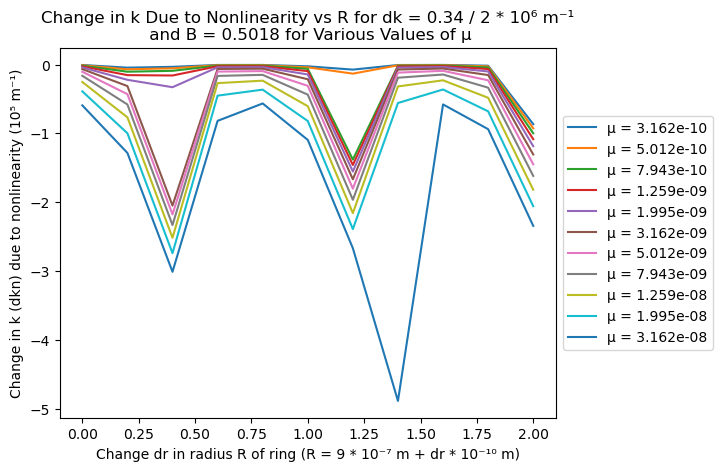

In [ ]:
# This is the plot for R dependence of dkn.
# mu amplifies the signal, but no other changes are visible here.

mui = [0,1,2,3,4,5,6,7,8,9,10]
bi = 3
ki = 3

ilim = len(mui)


fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs R for dk = {dk_g[gind][ki]:.2f} / 2 * 10\u2076 m\u207b\u00b9\n and B = {B_g[gind][bi]:.4f} for Various Values of \u03BC")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

#ax.set_xlabel("Variation (dB) of magnetic field strength B (B = 0.5 + dB * B_max)")

#plt.title(f"Plot of the Change in k Due to Nonlinearity vs Linear k\nVariation For Various Values of \u03BC")
#ax.set_ylabel('Change in k due to nonlinearity (dkn) (m\u207b\u00b9)')
#ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

for i in range(ilim):
    ax.plot(R, dkn[:, bi,ki,mui[i]]/kscale, label = f'\u03BC = {mu[mui[i]]:.3e}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

The periodic behavior of $R$ is multiplied by some function of $\mu$. The large $\mu$ point may either be a deviation from the behavior or an error. This characteristic is not visible on the $\mu$ vs dkn graphs, but clearly visible here.

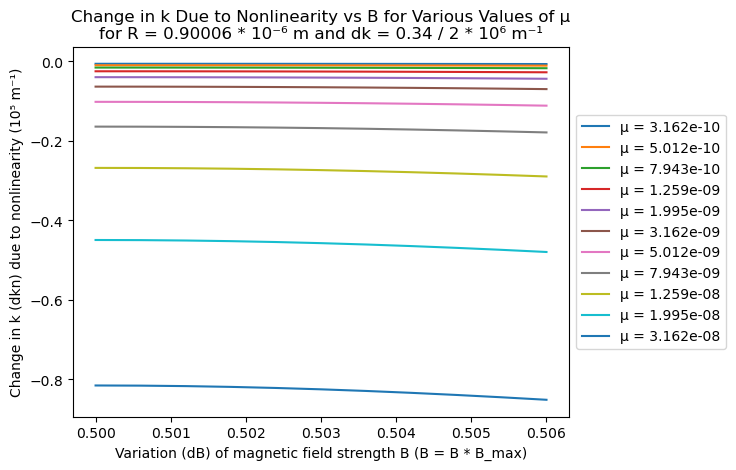

In [ ]:
# This is the plot for B dependence of dkn.
# mu amplifies the signal, but no other changes are visible here.

ivar = [0,1,2,3,4,5,6,7,8,9,10]
i1  = 3
i2  = 3

ilim = len(ivar)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B for Various Values of \u03BC\nfor R = {R_g[gind][i1]:.5f} * 10\u207b\u2076 m and dk = {dk_g[gind][i2]:.2f} / 2 * 10\u2076 m\u207b\u00b9")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = B * B_max)")

#plt.title(f"Plot of the Change in k Due to Nonlinearity vs Linear k\nVariation For Various Values of \u03BC")
#ax.set_ylabel('Change in k due to nonlinearity (dkn) (m\u207b\u00b9)')
#ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

for i in range(ilim):
    ax.plot(B_g[gind], dkn[i1, :,i2,ivar[i]]/kscale, label = f'\u03BC = {mu[ivar[i]]:.3e}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

The scale for B dependence here is obviously still too small. A pattern does exist, however. Only the effect of amplification with increased $\mu$ is visible at this $B$ node.

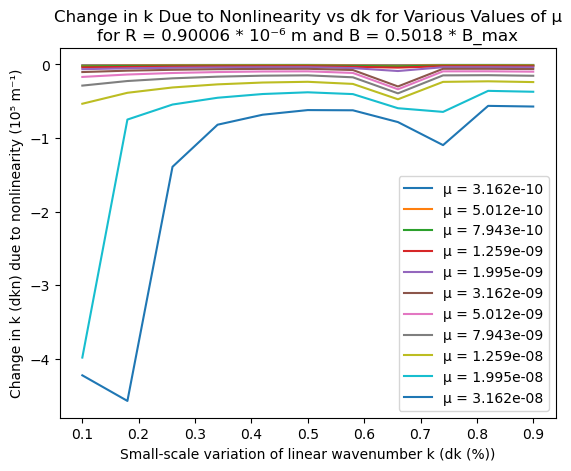

In [ ]:
# This is the plot for dk dependence of dkn.
# mu amplifies the signal as well as causing a shift to the right.

ivar = [0,1,2,3,4,5,6,7,8,9,10]
i1  = 3
i2  = 3

ilim = len(ivar)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs dk for Various Values of \u03BC\nfor R = {R_g[gind][i1]:.5f} * 10\u207b\u2076 m and B = {B_g[gind][i2]:.4f} * B_max")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

for i in range(ilim):
    ax.plot(dk_g[gind], dkn[i1, i2,:,ivar[i]]/kscale, label = f'\u03BC = {mu[ivar[i]]:.3e}')

plt.legend()#loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

dk has a phase shift with growing mu, not just a amplification. The dk data requires a larger range to see the periodic shape. 

Now for the dependence of $dMn$ on my parameters.

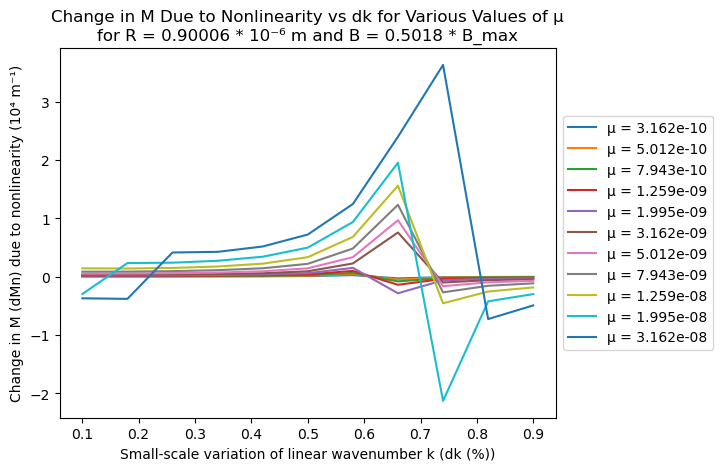

In [ ]:
# This is the plot for dk dependence of dMn.
# mu amplifies the signal as well as causing a shift to the right.
# I don't know if there is something else visible here.

ivar = [0,1,2,3,4,5,6,7,8,9,10]
i1  = 3
i2  = 3

ilim = len(ivar)

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs dk for Various Values of \u03BC\nfor R = {R_g[gind][i1]:.5f} * 10\u207b\u2076 m and B = {B_g[gind][i2]:.4f} * B_max")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Small-scale variation of linear wave number k (dk (%))")

for i in range(ilim):
    ax.plot(dk_g[gind], dMn[i1, i2,:,ivar[i]]/mscale, label = f'\u03BC = {mu[ivar[i]]:.3e}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

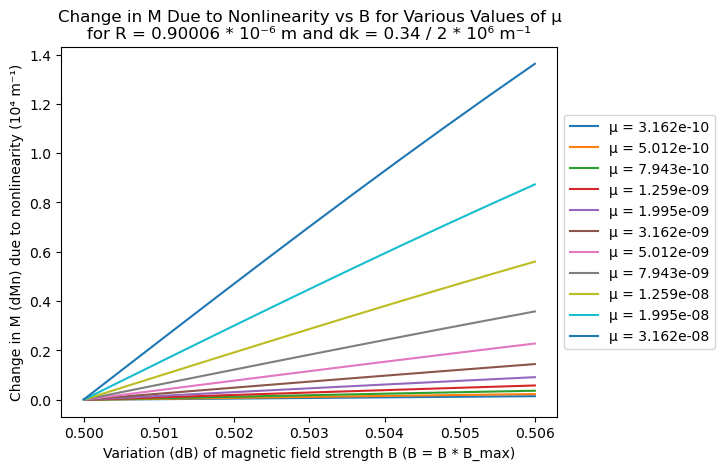

In [296]:
# This is the plot for B dependence of dMn.
# mu amplifies the signal, but the node is fixed on zero.

ivar = [0,1,2,3,4,5,6,7,8,9,10]
i1  = 3
i2  = 3

ilim = len(ivar)

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs B for Various Values of \u03BC\nfor R = {R_g[gind][i1]:.5f} * 10\u207b\u2076 m and dk = {dk_g[gind][i2]:.2f} / 2 * 10\u2076 m\u207b\u00b9")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Variation (dB) of magnetic field strength B (B = B * B_max)")

for i in range(ilim):
    ax.plot(B_g[gind], dMn[i1, :, i2,ivar[i]]/mscale, label = f'\u03BC = {mu[ivar[i]]:.3e}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

Linear or linearized. $B$ is still too small in scale to see the oscillations. $\mu$ definitely amplifies the signal, but leaves the position of the $0$ value unchanged.

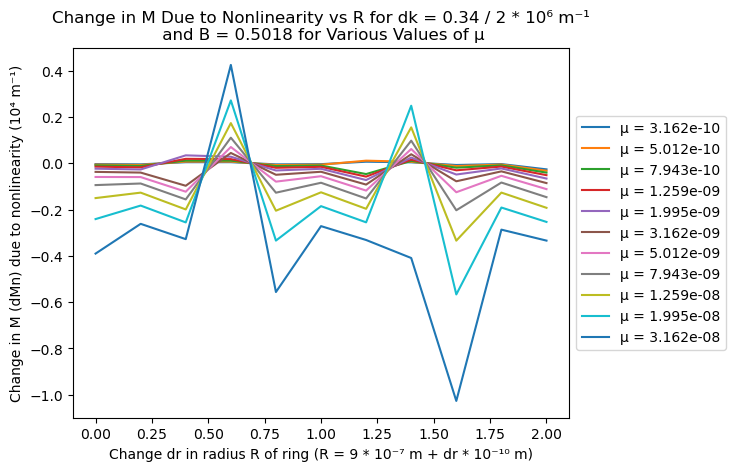

In [301]:
# This is the plot for R dependence of dMn.
# mu amplifies the signal, but the nodes are unchanged.

ivar = [0,1,2,3,4,5,6,7,8,9,10]
i1  = 3
i2  = 3

ilim = len(ivar)

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs R for dk = {dk_g[gind][ki]:.2f} / 2 * 10\u2076 m\u207b\u00b9\n and B = {B_g[gind][bi]:.4f} for Various Values of \u03BC")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2074 m\u207b\u00b9)')
ax.set_xlabel("Change dr in radius R of ring (R = 9 * 10\u207b\u2077 m + dr * 10\u207b\u00b9\u2070 m)")

for i in range(ilim):
    ax.plot(R, dMn[:, i1, i2,ivar[i]]/mscale, label = f'\u03BC = {mu[ivar[i]]:.3e}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

They are all meeting at zero at the same points. There is an erroneous point (or possibly a phase change) for the largest $\mu$, but the rest appear to show a periodic structure with the same frequency and offset for every values of $\mu$. 

# Large R analysis

For my final analysis, I have fixed $R$ to always be at the same point in the small-scale oscillations with a periodicity based on $kR$, and sampled the full range of $R$ values. The large-scale $B\pi^2R^2$ oscillations should be visible in this graph, as should any unaccounted for $R$ dependent behavior. 

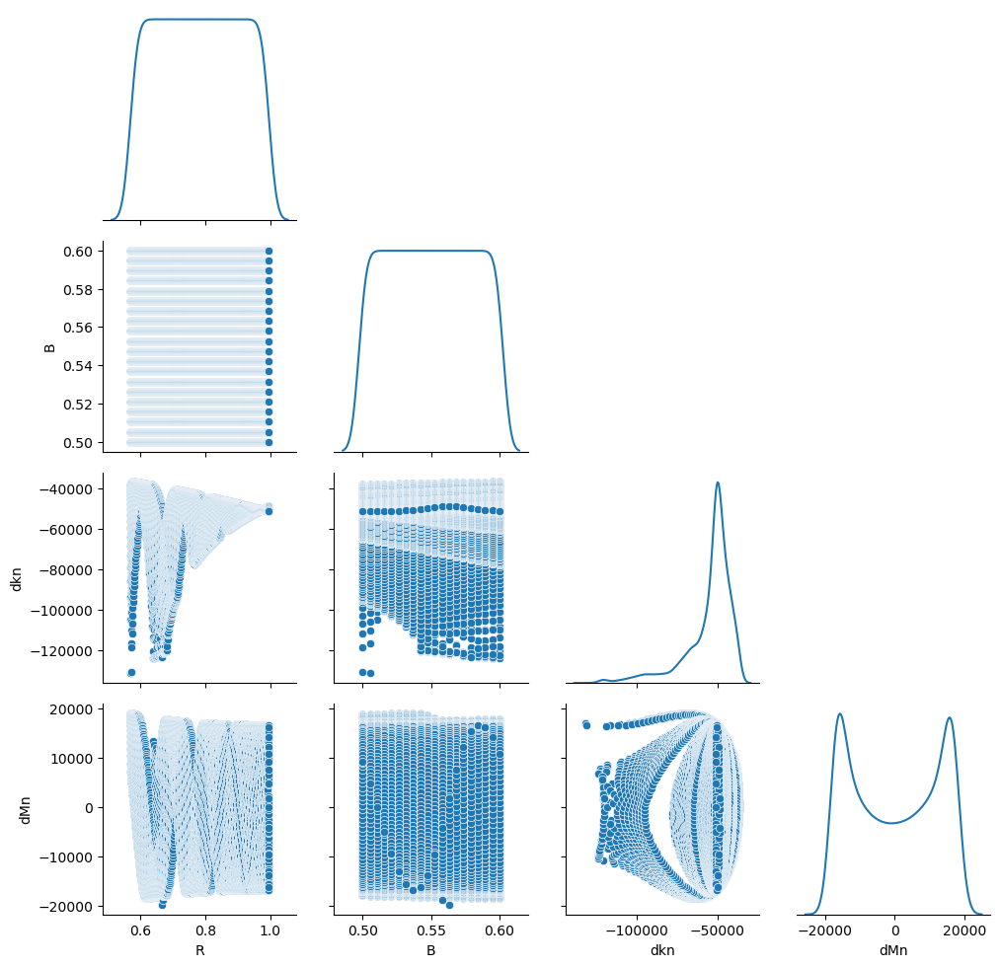

In [302]:
g = sns.PairGrid(tbl_red[2], diag_sharey=False, corner=True)

g.map_diag(sns.kdeplot)
g.map_lower(sns.scatterplot)

Lets start by loading our data.

In [303]:
gind = 2

In [304]:
del dkn_arr, dMn_arr

dkn_arr = np.zeros((gs_r1, gs_b1))
dMn_arr = np.zeros((gs_r1, gs_b1))

for r, rr in enumerate(R_g[gind]):
    for b, bb in enumerate(B_g[gind]):
        tbl_sel = tbl_red[gind][(tbl_red[gind]["R"]==rr) &(tbl_red[gind]["B"]==bb)]
        dkn_arr[r,b] = tbl_sel["dkn"].to_numpy()[0]
        dMn_arr[r,b] = tbl_sel["dMn"].to_numpy()[0]

In [305]:
R = R_g[gind]
B = B_g[gind]

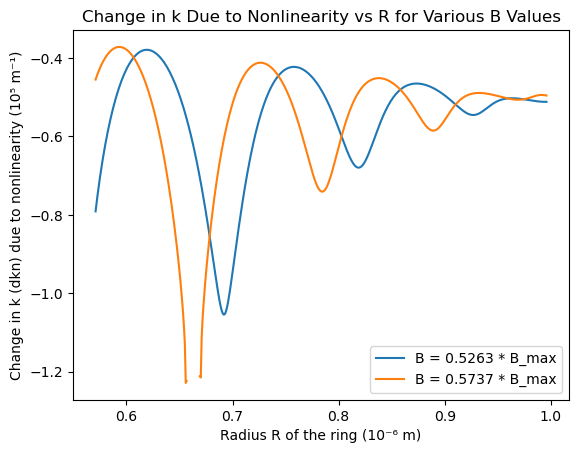

In [310]:
# Plots of dkn vs R

Bi = [5, 14]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs R for Various B Values")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Radius R of the ring (10\u207b\u2076 m)")

for bb in Bi:
    ax.plot(R, dkn_arr[:,bb]/100000, label = f"B = {B[bb]:.4f} * B_max")

plt.legend()#loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()


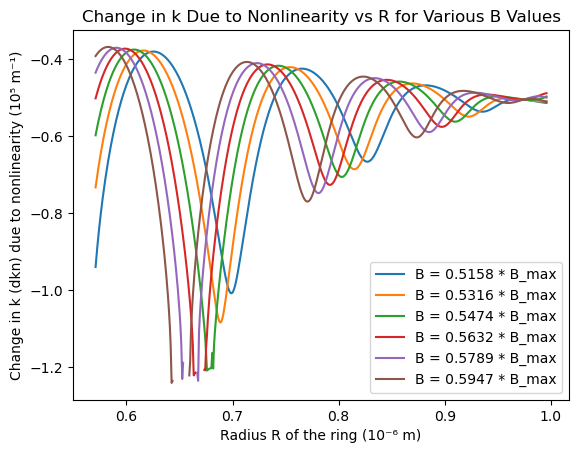

In [311]:
# Plots of dkn vs R

Bi = [3,6,9,12,15,18]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs R for Various B Values")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Radius R of the ring (10\u207b\u2076 m)")

for bb in Bi:
    ax.plot(R, dkn_arr[:,bb]/100000, label = f"B = {B[bb]:.4f} * B_max")

plt.legend()

plt.show()

The oscillations here appear to have a parabolic maximum absolute value and a linear minimum absolute value. There is a point of intersection of all the lines at a value close to $R=1$, but the exact location of that point may have to do with the choise of point on the fast oscillations. I avoided the minima, since despite the fact that it would be the most insightful, there is a problem relating to the spikes which appear only at the minima. They are either error, or a relic of the fact that we are not exactly on our $B$ node.

I now want to check that the oscillations are indeed our known $B\pi^2R^2$ oscillations.

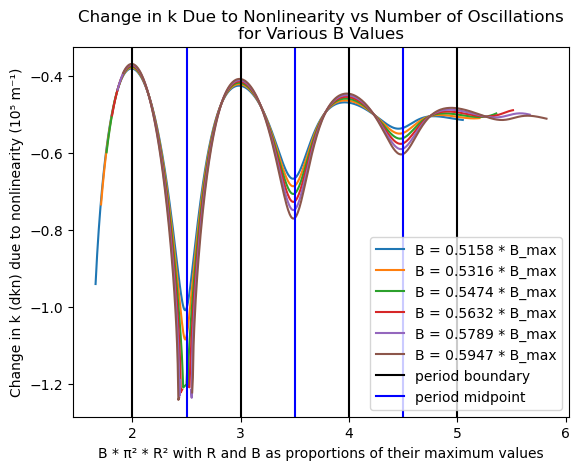

In [314]:
Bi = [3,6,9,12,15,18]

ilim = len(Bi)


fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs Number of Oscillations\nfor Various B Values")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("B * π\u00b2 * R\u00b2 with R and B as proportions of their maximum values")

for bb in Bi:
    # x = B * pi^2 * R^2
    cycle_number = np.power(np.array(R), 2)*pi**2*B[bb]
    # and plot
    ax.plot(cycle_number, dkn_arr[:,bb]/100000, label = f"B = {B[bb]:.4f} * B_max")
# Count the number of cycles.
plt.axline((2,-0.6), (2,-0.66), color='k', label="period boundary")
plt.axline((2.5,-0.6), (2.5,-0.66), color='b', label = "period midpoint")
plt.axline((3,-0.6), (3,-0.66), color='k')
plt.axline((3.5,-0.6), (3.5,-0.66), color='b')
plt.axline((4,-0.6), (4,-0.66), color='k')
plt.axline((4.5,-0.6), (4.5,-0.66), color='b')
plt.axline((5,-0.6), (5,-0.66), color='k')

plt.legend()

plt.show()

The minima are close to or on the cycle boundary, while the maxima are close to or on the half period. The period is definitely correct. There may be a slight translation, but that could actually be expected from our skewed secant squared function fit.

The next series of plots are for the $dkn$ vs $B$ data, with large $R$ variations being represented by different curves.

Minimum absolute value of dkn for R = 0.57509: 37257.13817
Minimum absolute value of dkn for R = 0.57926: 36836.36141
Minimum absolute value of dkn for R = 0.58342: 36899.82919
Minimum absolute value of dkn for R = 0.58759: 37034.96513
Minimum absolute value of dkn for R = 0.59176: 37128.13734


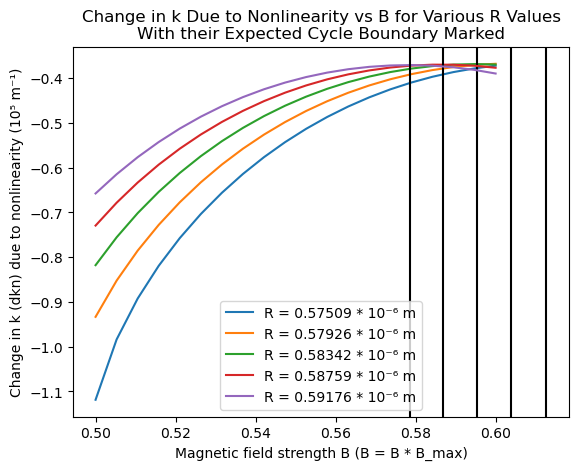

In [321]:
# Low R values
Ri = [5, 10, 15, 20, 25]
Bi = [3,6,9,12,15,18]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B for Various R Values\nWith their Expected Cycle Boundary Marked")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Magnetic field strength B (B = B * B_max)")

for rr in Ri:
    ax.plot(B, dkn_arr[rr,:]/100000, label = f"R = {R[rr]:.5f} * 10\u207b\u2076 m")
    print(f"Minimum absolute value of dkn for R = {R[rr]:.5f}: {-np.max( dkn_arr[rr,:]):.5f}")
    # The black lines printed will designate the expected cycle boundary
    plt.axline((2/(R[rr]**2 * pi**2),-0.45), (2/(R[rr]**2 * pi**2),-0.5), color='k')

plt.legend()

plt.show()

Minimum absolute value of dkn for R = 0.59592: 37255.42202
Minimum absolute value of dkn for R = 0.60009: 37358.95283
Minimum absolute value of dkn for R = 0.60426: 37489.68861
Minimum absolute value of dkn for R = 0.60842: 37589.56458
Minimum absolute value of dkn for R = 0.61259: 37731.22027


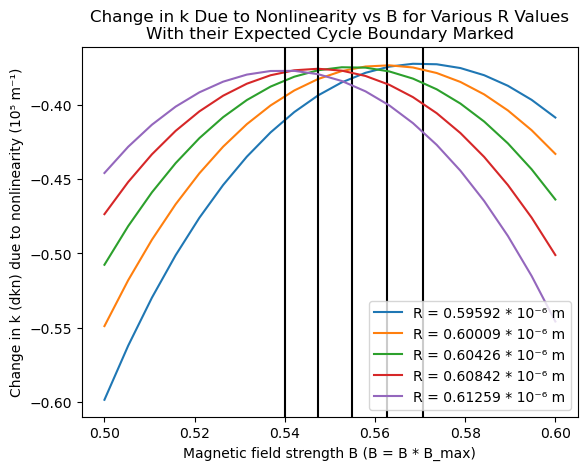

In [320]:
# R is now increasing 

Ri = [30, 35, 40, 45, 50]
Bi = [3,6,9,12,15,18]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B for Various R Values\nWith their Expected Cycle Boundary Marked")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Magnetic field strength B (B = B * B_max)")

for rr in Ri:
    ax.plot(B, dkn_arr[rr,:]/100000, label = f"R = {R[rr]:.5f} * 10\u207b\u2076 m")
    print(f"Minimum absolute value of dkn for R = {R[rr]:.5f}: {-np.max( dkn_arr[rr,:]):.5f}")
    # The black lines printed here designate the expected cycle boundary
    plt.axline((2/(R[rr]**2 * pi**2),-0.45), (2/(R[rr]**2 * pi**2),-0.5), color='k')

plt.legend()

plt.show()

Minimum absolute value of dkn for R = 0.61676: 37827.62983
Minimum absolute value of dkn for R = 0.62092: 37947.87134
Minimum absolute value of dkn for R = 0.62509: 38090.30873
Minimum absolute value of dkn for R = 0.62926: 38186.86325
Minimum absolute value of dkn for R = 0.63342: 38304.87916
Minimum absolute value of dkn for R = 0.63759: 38439.78907


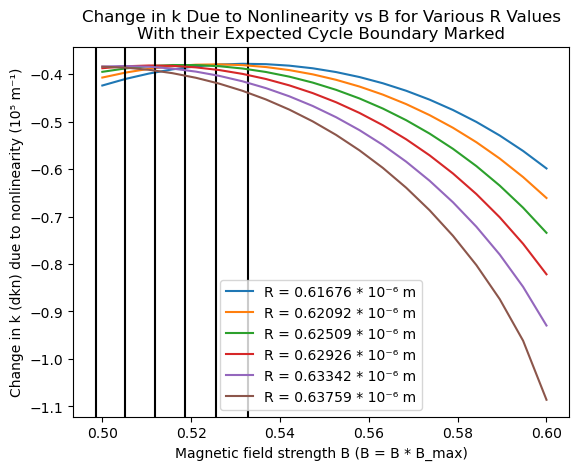

In [319]:
Ri = [55, 60, 65, 70, 75, 80]
Bi = [3,6,9,12,15,18]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Change in k Due to Nonlinearity vs B for Various R Values\nWith their Expected Cycle Boundary Marked")
ax.set_ylabel('Change in k (dkn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Magnetic field strength B (B = B * B_max)")

for rr in Ri:
    ax.plot(B, dkn_arr[rr,:]/100000, label = f"R = {R[rr]:.5f} * 10\u207b\u2076 m")
    print(f"Minimum absolute value of dkn for R = {R[rr]:.5f}: {-np.max( dkn_arr[rr,:]):.5f}")
    # The black lines printed here designate the expected cycle boundary
    plt.axline((2/(R[rr]**2 * pi**2),-0.45), (2/(R[rr]**2 * pi**2),-0.5), color='k')

plt.legend()

plt.show()

The black line appears to be hitting the minima of its curve. The minimum absolute value appears to be increasing, although this increase is not visible. It appears that the curve is moving to the right with a constant speed. Changes to the shape are minimal. No new behaviors are visible.

Now for the large-scale oscillation dependence of the slow oscillation wave number.

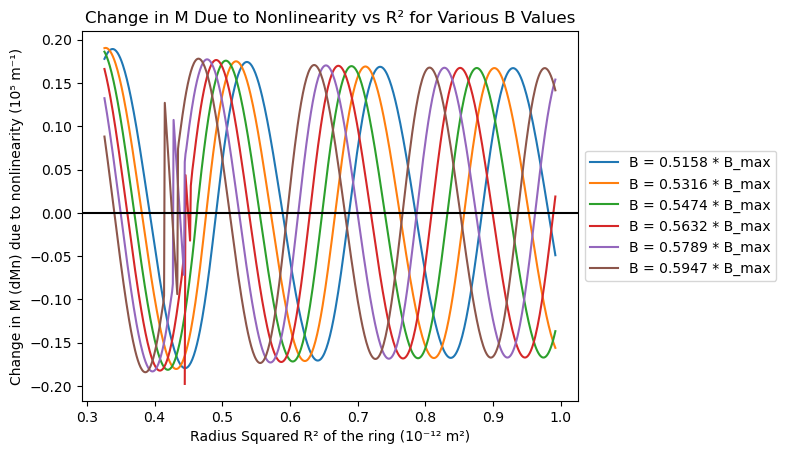

In [324]:
# Plot of dMn as a function of R^2

Bi = [3,6,9,12,15,18]

x = [2, 3, 4, 5]

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs R\u00b2 for Various B Values")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Radius Squared R\u00b2 of the ring (10\u207b\u00b9\u00b2 m\u00b2)")

for bb in Bi:
    #cycle_number = np.power(np.array(R), 2)*pi**2*B[bb]
    ax.plot(np.power(np.array(R), 2), dMn_arr[:,bb]/100000, label = f"B = {B[bb]:.4f} * B_max")
#for ii in x:
#    plt.axline((ii,-0.1), (ii,-0.12), color='k')
plt.axline((0.5,0), (0.6,0), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

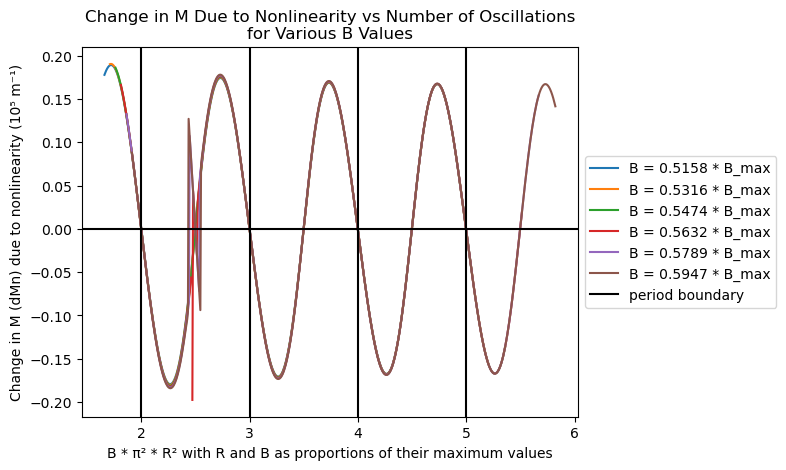

In [325]:
# Plot of dMn as a function of the number of large-scale periods

Bi = [3,6,9,12,15,18]

x = [2, 3, 4, 5]

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs Number of Oscillations\nfor Various B Values")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("B * π\u00b2 * R\u00b2 with R and B as proportions of their maximum values")

for bb in Bi:
    cycle_number = np.power(np.array(R), 2)*pi**2*B[bb]
    ax.plot(cycle_number, dMn_arr[:,bb]/100000, label = f"B = {B[bb]:.4f} * B_max")
for ii in x:
    plt.axline((ii,-0.1), (ii,-0.12), color='k')

plt.axline((5,0), (4,0), color='k', label = "period boundary")

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

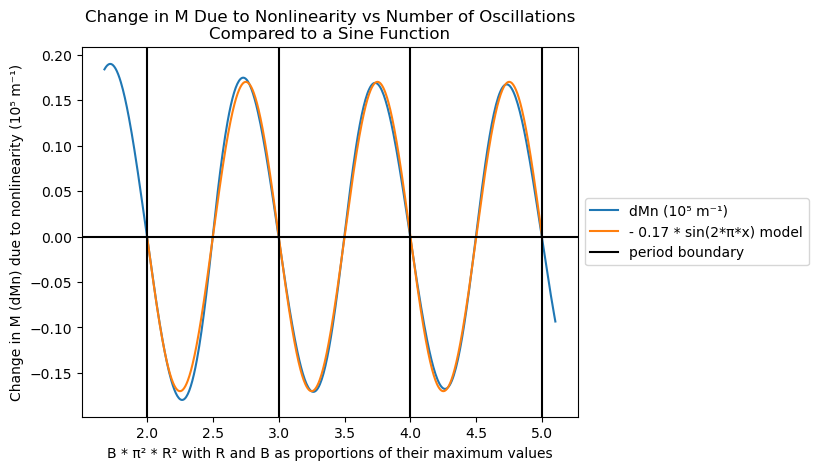

In [326]:
# Plot of dMn as a function of the number of large-scale periods
# for one value of B, and compared to a sine curve of equal period

Bi  = 4

# a sine function
x = np.linspace(2,5,1000)
y = -np.sin(2*pi*x)*0.17

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs Number of Oscillations\nCompared to a Sine Function")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("B * π\u00b2 * R\u00b2 with R and B as proportions of their maximum values")

# our curve
ax.plot(np.power(np.array(R), 2)*pi**2*B[Bi], dMn_arr[:,Bi]/100000, label = "dMn (10\u2075 m\u207b\u00b9)")
# a sine function with the same period and similar amplitude
ax.plot(x,y, label = "- 0.17 * sin(2*π*x) model")
# boundaries of oscillations
plt.axline((2,-0.1), (2,-0.12), color='k', label = "period boundary")
plt.axline((3,-0.1), (3,-0.12), color='k')
plt.axline((4,-0.1), (4,-0.12), color='k')
plt.axline((5,-0.1), (5,-0.12), color='k')
# the x axis
plt.axline((5,0), (4,0), color='k')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

The period is as expected. The structure appears have a slight tilt with respect to a sine. The amplitude decreases slightly with increased $R$. This effect is very small, unlike the rapid decrease in amplitude of the $dkn$ oscillations.

The final graph I wish to show is the plot of $dMn$ vs $B$ for varying $R$. 

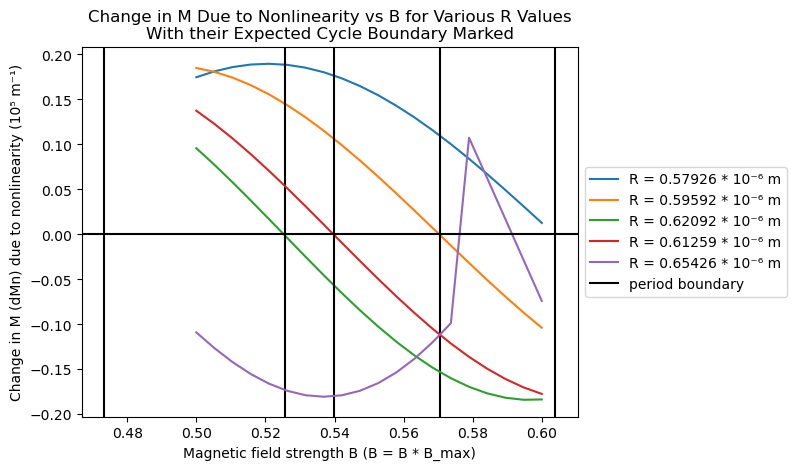

In [327]:
Ri = [10, 30, 60,  50,100]
Bi = [3,6,9,12,15,18]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs B for Various R Values\nWith their Expected Cycle Boundary Marked")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Magnetic field strength B (B = B * B_max)")

for rr in Ri:
    ax.plot(B, dMn_arr[rr,:]/100000, label = f"R = {R[rr]:.5f} * 10\u207b\u2076 m")
    plt.axline((2/(R[rr]**2 * pi**2),-0.1), (2/(R[rr]**2 * pi**2),-0.11), color='k')
plt.axline((0.54,0), (0.55,0), color='k', label = "period boundary")

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

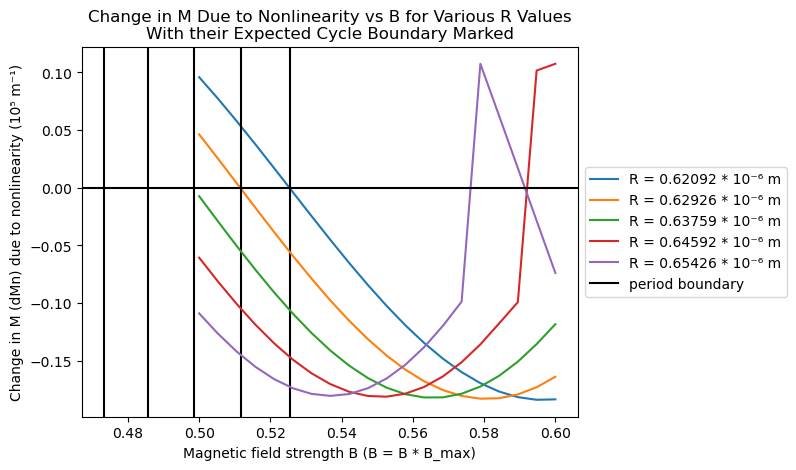

In [328]:
Ri = [55, 60, 65, 70, 75, 80]
Ri = [60, 70, 80, 90, 100]
Bi = [3,6,9,12,15,18]

ilim = len(Bi)

fig, ax = plt.subplots()
plt.title(f"Change in M Due to Nonlinearity vs B for Various R Values\nWith their Expected Cycle Boundary Marked")
ax.set_ylabel('Change in M (dMn) due to nonlinearity (10\u2075 m\u207b\u00b9)')
ax.set_xlabel("Magnetic field strength B (B = B * B_max)")

for rr in Ri:
    ax.plot(B, dMn_arr[rr,:]/100000, label = f"R = {R[rr]:.5f} * 10\u207b\u2076 m")
    plt.axline((2/(R[rr]**2 * pi**2),-0.1), (2/(R[rr]**2 * pi**2),-0.11), color='k')
plt.axline((0.54,0), (0.55,0), color='k', label = "period boundary")

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

The lines here are when my pattern reaches zero, not the maxima. If we ignore the spike, the pattern looks like it travels left with increasing $R$, roughly uniformly. This matches my expectations for the shift in period. No new behaviors are visible.

# Conclusions

There are two oscillations which repeat on the scale of $Rk$ and $B\pi^2R^2$, respectively. $R$ and $\mu$ change the parameters which designate the shape and amplitude of these oscillations, while $B$ doesn't impact this shape at all. $dk$ variations for this model are too small to impact this shape. 

We can separate these oscillations into 4 separate oscillation structures:
  1) $Rk$ oscillations of the change in our fast oscillation wave number when adding nonlinearity ($dkn$)\
  The shape of these oscillations resemble a secant squared function, rotated around the minimum of each curve. 
  The minimum is at the period boundary when the $B\pi^2R^2$ oscillation is at its period boundary, and at the 
  period midpoint when the $B\pi^2R^2$ oscillation is also at its midpoint. Quarter $B\pi^2R^2$ oscillations 
  produce a function which is slightly less than the maximum of both curves. Oscillation causes the new spike to
  grow at the old minimum before the old spike decays into the new minimum. 
  2) $B\pi^2R^2$ oscillations of the change in our fast oscillation wave number when adding nonlinearity ($dkn$)\
  The shape of these oscillations at the half-period boundaries of the $Rk$ oscillation appear similar to cycloids 
  which start their next cycle before hitting the 0 axis. This shape has the same phase-shifting behavior as the
  $Rk$ oscillations. The pattern at half-period boundaries is shifted over by half a period from the one at whole
  period boundaries. Between these boundaries, the shape can have one of two forms. The first is a piecewise graph 
  with two separate arc types, one facing towards the axis and the other away from the axis, one centered on the 
  half-period boundaries, and the other centered on the whole period boundaries. They are centered in terms of
  curvature as well as what percentage of the graph they take up. The new arc grows out of the troughs of the cycloid, 
  rounding it with decreasing curvature, while the other grows in amplitude and shrinks in curvature as the percentage 
  of the graph it takes up shrinks. Once it shrinks entirely, the $kR$ oscillation reaches a node, with $B\pi^2R^2$
  graph for this value of $kR$ being constant. After that, the oscillations grow in a non-symmetric curve with symmetry 
  similar to the Jacobian dn elliptic, but with the sharper peaks facing the origin. The sharper peaks become sharper
  with time, until we return to the cycloid-like shape, but shifted over by a half period.
  3) $B\pi^2R^2$ oscillations of the change in our slow oscillation wave number when adding nonlinearity ($dMn$)\
  The oscillation starts at the period boundary as a tilted sine. At this point, we switch to a piecewise function.
  Our old function continues to tilt and look more and more like a sawtooth, but it is cut off by a growing pattern with 
  a quarter phase shift. The space the old function takes up is symmetric around the midpoints of the oscillations,
  while the new function, which take up the boundaries of the oscillation, start as a sawtooth with the $kR$ period 
  boundaries as their midpoints. As the portion of the graph this new pattern takes grows, the function curves and the end 
  falls. At the quarter $kR$ period point, the previous sawtooth piecewise function disappears and we are very close to
  a negative sin function. Growth in $kR$ causes the sine to grow and tilt towards the axis. At the half $kR$ period point,
  the two sides of the tilted sine function split. \
  Each time when the new function grows, it doesn't look like a tilted sine which has been cutoff, but rather has an 
  additional curve near the cutoff which tilts away from the x-axis. The old function which disappears doesn't have this 
  feature, and just looks like a cutoff tilted sine.
  4) $Rk$ oscillations of the change in our slow oscillation wave number when adding nonlinearity ($dMn$)\
  At $B\pi^2R^2$ period boundaries, the $dMn$ vs $Rk$ graph is almost everywhere zero, with peaks at the period boundaries.
  At the half-period boundaries of $B\pi^2R^2$ oscillations, the spikes are at the half-period boundaries of $Rk$
  oscillations. As we increase $B$ from the $B$ period boundaries, we see a curve appear, with a shorter, curved side, and a long straight side, sort of like half of our secant squared curve. When it rises out of our period boundaries, it has the long end pointed away from the axis and short end along the axis, above the axis, but not as far away as the long end. The short end is to the left of the period boundary, with only the greatest points of the long end to the right of the period boundary. This piece is connected piecewise to another copy of the curve with negative values. This curve has the long end along the x axis and the short end pointing away from the axis, to the left of the long end. As $B$ increases, both curves move away from the axis and rotate, the vertical J with its long end falling, and the horizontal curve with the long end rotating away from the axis. The curve changes its shape during the rotation, so that the short end starts to curve towards the direction of the long end. By the quarter period, the two shapes appear as mirror opposite of each other. The rotation continues to the point where the tall curve is not long, and the long curve is now tall, mirrored and moved over by a half period from the old pattern. The pattern flattens everywhere except for the half-period lines, before flipping over and starting again.


$\mu$ amplitude dependence. The amplitude of all the oscillations appear to have a roughly linear dependence on the value of $\mu$. $\mu$ also impacts the parameters of the functional forms of the oscillations. The increase in rotation angle of the secant squared pattern with increasing $\mu$ causes the maximum $dkn$ value to increase at a noticeably less than linear rate (with our best fit being $\mu^{0.355155}$), while the minimum increases at a rate consistent with linear dependence (with our best fit being $\mu^{0.99879}$). It also causes a noticeable shift in the point where the left curve is cut off in favor of the right curve.

$R$ shape dependence. Our point in the fast oscillations for analysis of the large $R$ dependence is not the most convenient for analysis, but the results are most consistent with a change in parameters of our functional form with $R$, most notably the tilt of the secant squared curve. Our choice of point is between the quarter period and half period of the $kR$ oscillations, where the tilted negative sine appears for the $B\pi^2R^2$ oscillations. This point is to the right of a whole period rotated secant squared minimum, but to the left of the half-period minimum. This produces the dn-like pattern. As $R$ decreases, the rotation angle decreases, and the point moves up the curve on the left and down the curve on the right. Increasing $R$ produces the opposite effect, until reaching the point of intersection of the two switching patterns. $R$ dependence on amplitude appears minimal, if any, as any apparent amplitude change could just be a parameter change.